# Import Packages

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as ctx
import xgboost as xgb
import shap
import statsmodels.api as sm
import matplotlib.colors as mcolors
import re
import json
from sklearn.base import clone
from flaml import AutoML
from sklearn.preprocessing import MinMaxScaler
from pathlib import Path
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import RobustScaler
from linearmodels.panel import PanelOLS,compare
from linearmodels import RandomEffects
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor

In [2]:
data_path = r"F:/LongMig2025/data/"
# SHELDUS = pd.read_csv(data_path + "SHELDUS/ORIGINAL.csv")
SHELDUS = pd.read_csv(data_path + "SHELDUS/ORIGINAL_converted.csv")
state   = gpd.read_file(data_path + "Census/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file(data_path + "Census/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(data_path + "PEP/co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(data_path + "PEP/co-est2020-alldata.csv", encoding='latin-1')
SVI_10  = pd.read_csv(data_path + "SVI/SVI_2010_US_county.csv")
SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")
state   = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]
NRI     = pd.read_csv(data_path + "NRI/NRI_Table_Counties/NRI_Table_Counties.csv")

# Preprocess

### Add Employment data, Population Density data, Amenity Scale, and House Price data

In [3]:
# Employment = pd.read_csv(data_path + "Unemployment.csv")
PopDensity = pd.read_csv(data_path + "POPDen/2010/PopDensity2010.csv")
# HPI        = pd.read_csv(data_path + "HPI/hpi_master.csv")
# house_price= pd.read_csv(data_path + "Zillow/County_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")
MedianHouseValue2000 = pd.read_csv(data_path + "MedianHouseValue/DECENNIALSF32000.H076-Data.csv")
MedianHouseValue2020 = pd.read_csv(data_path + "MedianHouseValue/ACSDT5Y2020.B25077-Data.csv")
MedianHouseholdIncome2000 = pd.read_csv(data_path + "MedianHouseValue/nhgis0011_csv/nhgis0011_csv/nhgis0011_ds151_2000_county1.csv")
MedianHouseholdIncome2020 = pd.read_csv(data_path + "MedianHouseValue/ACSDT5Y2020.B19013_2025-05-07T200431/ACSDT5Y2020.B19013-Data1.csv")
# GDP        = pd.read_csv(data_path + "GDP/CAGDP1_ALL_AREAS_2001_2023.csv",  encoding='latin1')
# TJan    = pd.read_csv(data_path + "PRISM/Tmean_Jan_All.csv")
# TJuly   = pd.read_csv(data_path + "PRISM/Tmean_July_All.csv")
Amenity = pd.read_csv(data_path + "Amenity/amenity.csv")
HAI     = pd.read_csv(data_path + "LAI/HAI_W.csv")
# LAI     = pd.read_csv(data_path + "LAI/LAI.csv")

### Process of PEP data

In [4]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

### df_pep_0120 is all pep data

In [5]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

### Process of Pop Density

In [6]:
PopDensity_CONUS = PopDensity[~(PopDensity["STATE"] == 2)]
PopDensity_CONUS = PopDensity_CONUS[~(PopDensity_CONUS["STATE"] == 15)]
PopDensity_CONUS["FIPS"] = PopDensity_CONUS['GEOID10'].astype(str).str.rjust(5,"0")
PopDensity_CONUS_sel = PopDensity_CONUS[["FIPS","POPDENS10"]]

### Process of Median House Value

In [7]:
MedianHouseValue2000["FIPS"] = MedianHouseValue2000["GEO_ID"].str[-5:]
MedianHouseValue2000["FIPS"]  = MedianHouseValue2000["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseValue2000["H076001"] = pd.to_numeric(MedianHouseValue2000["H076001"], errors='coerce')
# CPI for 2000 = 172.2, CPI for 2020 = 258.811
cpi_2000 = 172.2
cpi_2020 = 258.811
adjustment_factor = cpi_2020 / cpi_2000
MedianHouseValue2000["MedianHouseValue2000(adjusted)"] = (
    MedianHouseValue2000["H076001"] * adjustment_factor
).round(0)
MedianHouseValue2000 = MedianHouseValue2000[["FIPS","MedianHouseValue2000(adjusted)"]]

In [8]:
MedianHouseValue2020["FIPS"] = MedianHouseValue2020["GEO_ID"].str[-5:]
MedianHouseValue2020["FIPS"]  = MedianHouseValue2020["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseValue2020["MedianHouseValue2020"] = MedianHouseValue2020["B25077_001E"]
MedianHouseValue2020["MedianHouseValue2020"] = pd.to_numeric(MedianHouseValue2020["MedianHouseValue2020"], errors='coerce')
MedianHouseValue2020 = MedianHouseValue2020[["FIPS","MedianHouseValue2020"]]

In [9]:
MedianHouseValue = pd.merge(MedianHouseValue2000,MedianHouseValue2020,on="FIPS")
MedianHouseValue["ratiochange"] = (MedianHouseValue["MedianHouseValue2020"]-MedianHouseValue["MedianHouseValue2000(adjusted)"])/MedianHouseValue["MedianHouseValue2000(adjusted)"]*100

In [10]:
MedianHouseholdIncome2000["State"] = MedianHouseholdIncome2000["STATEA"].astype(str).str.rjust(2,"0")
MedianHouseholdIncome2000["County"] = MedianHouseholdIncome2000["COUNTYA"].astype(str).str.rjust(3,"0")
MedianHouseholdIncome2000["FIPS"] = MedianHouseholdIncome2000["State"]+MedianHouseholdIncome2000["County"]
MedianHouseholdIncome2000["FIPS"]  = MedianHouseholdIncome2000["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseholdIncome2000["GMY001"] = pd.to_numeric(MedianHouseholdIncome2000["GMY001"], errors='coerce')
# CPI for 2000 = 172.2, CPI for 2020 = 258.811
cpi_2000 = 172.2
cpi_2020 = 258.811
adjustment_factor = cpi_2020 / cpi_2000
MedianHouseholdIncome2000["MedianHouseholdIncome2000(adjusted)"] = (
    MedianHouseholdIncome2000["GMY001"] * adjustment_factor
).round(0)
MedianHouseholdIncome2000 = MedianHouseholdIncome2000[["FIPS","MedianHouseholdIncome2000(adjusted)"]]

In [11]:
MedianHouseholdIncome2020["FIPS"] = MedianHouseholdIncome2020["GEO_ID"].str[-5:]
MedianHouseholdIncome2020["FIPS"]  = MedianHouseholdIncome2020["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseholdIncome2020["MedianHouseholdIncome2020"] = MedianHouseholdIncome2020["B19013_001E"]
MedianHouseholdIncome2020["MedianHouseholdIncome2020"] = pd.to_numeric(MedianHouseholdIncome2020["MedianHouseholdIncome2020"], errors='coerce')
MedianHouseholdIncome2020 = MedianHouseholdIncome2020[["FIPS","MedianHouseholdIncome2020"]]

In [12]:
MedianHouseholdIncome = pd.merge(MedianHouseholdIncome2000,MedianHouseholdIncome2020,on="FIPS",how="inner")
MedianHouseIndicator = pd.merge(MedianHouseValue,MedianHouseholdIncome,how="inner",on="FIPS")


MedianHouseIndicator["%ChangeIncome"] = (MedianHouseIndicator["MedianHouseholdIncome2020"]-MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"])/MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"]*100
MedianHouseIndicator["%ChangeValue"] = (MedianHouseIndicator["MedianHouseValue2020"]-MedianHouseIndicator["MedianHouseValue2000(adjusted)"])/MedianHouseIndicator["MedianHouseValue2000(adjusted)"]*100
MedianHouseIndicator["income/value2000"] = MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"] / MedianHouseIndicator["MedianHouseValue2000(adjusted)"]*100
MedianHouseIndicator["income/value2020"] = MedianHouseIndicator["MedianHouseholdIncome2020"] / MedianHouseIndicator["MedianHouseValue2020"]*100
MedianHouseIndicator["%Income/%Value"] = MedianHouseIndicator["%ChangeIncome"]/MedianHouseIndicator["%ChangeValue"]

In [13]:
county_used = county[["FIPS","geometry"]]
gdf_MedianHouseIndicator = pd.merge(county_used,MedianHouseIndicator,on="FIPS",how="inner")
gdf_MedianHouseIndicator = gpd.GeoDataFrame(gdf_MedianHouseIndicator,geometry="geometry")

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:940: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:970: RuntimeWarning: invalid value encountered in scalar divide
  gadf = 1 if adam == 0 else 1 - self.adcm / adam
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\190171415.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


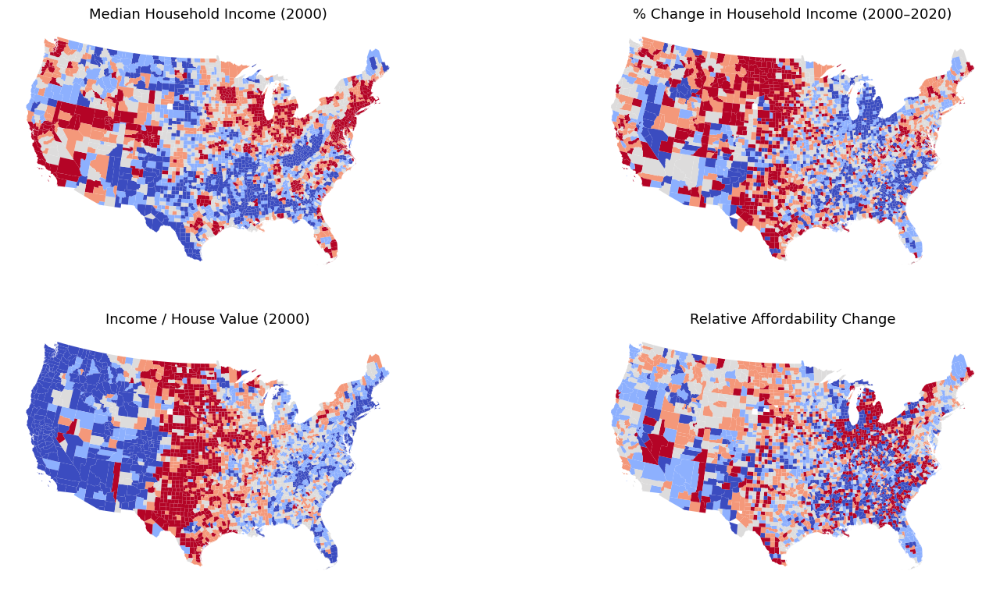

In [14]:
used_columns = [
    "MedianHouseholdIncome2000(adjusted)",
#                 "MedianHouseholdIncome2020",
                "%ChangeIncome",
                "income/value2000",
#                 "income/value2020",
                "%Income/%Value"]
titles = [
    'Median Household Income (2000)',
#     'Median Household Income (2020)',
    '% Change in Household Income (2000–2020)',
    'Income / House Value (2000)',
#     'Income / House Value (2020)',
    'Relative Affordability Change']
fig, axes = plt.subplots(2, 2, figsize=(18, 9), constrained_layout=True)
axes = axes.flatten()
for i, col in enumerate(used_columns):
    gdf_MedianHouseIndicator.plot(column=col,
             cmap='coolwarm',
              scheme = "quantiles" ,                   
#              linewidth=0.2,
#              edgecolor='black',
#              legend=True,
             ax=axes[i])
    axes[i].set_title(titles[i], fontsize=13)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

### Process of Amenity data

In [15]:
Amenity["FIPS"]  = Amenity["FIPS"].astype(str).str.rjust(5,"0")
Amenity = Amenity[["FIPS","Scale","Level"]]
Amenity.head()

,FIPS,Scale,Level
0,01001,0.78,4
1,01003,1.82,4
2,01005,0.19,4
3,01007,-0.15,3
4,01009,0.23,4


### Process of Location Affordability Index (LAI)

In [16]:
HAI["FIPS"]  = HAI["FIPS"].astype(str).str.rjust(5,"0")
HAI = HAI.rename(columns={
    "Weight_HAI":"W_HT_HAI"
#     "MEAN_hh_type1_h":"W_HT_LAI"
})
HAI = HAI[["FIPS","W_HT_HAI"]]
non_conus_fips_prefixes = ['02', '15', '60', '66', '69', '72', '78']  # Alaska, Hawaii, and island territories
HAI = HAI[
    ~HAI['FIPS'].str[:2].isin(non_conus_fips_prefixes)
]

### Process of SHELDUS

In [17]:
SHELDUS['FIPS'] = SHELDUS['FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2000) & (SHELDUS_0020['Month'] <= 6))]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2020) & (SHELDUS_0020['Month'] >= 7))]
SHELDUS_0020["StateID"] = SHELDUS_0020["FIPS"].astype(str).str[:2]
SHELDUS_0020 = SHELDUS_0020[~SHELDUS_0020["StateID"].isin(non_conus_fips_prefixes)]
SHELDUS_0020_dis = SHELDUS_0020.groupby(["Hazard"]).agg({"PropertyDmg(ADJ 2020)":"sum","Fatalities":"sum","Injuries":"sum"}).reset_index()
SHELDUS_0020_dis.sort_values(by="PropertyDmg(ADJ 2020)",ascending=False)

,Hazard,PropertyDmg(ADJ 2020),Fatalities,Injuries
4,Flooding,2.056574e+11,1648.020,1387.000
8,Hurricane/Tropical Storm,1.759030e+11,1215.980,1300.010
12,Tornado,3.784049e+10,1504.000,19077.000
15,Wildfire,3.218132e+10,296.000,1619.960
6,Hail,2.999533e+10,3.000,620.000
16,Wind,1.825596e+10,973.315,3993.930
17,Winter Weather,1.136860e+10,648.995,2833.035
11,Severe Storm/Thunder Storm,5.431994e+09,303.500,2387.000
3,Earthquake,4.256910e+09,7.990,223.000
9,Landslide,3.151915e+09,183.960,300.010


### Process: Hurricane-induced Flooding to Hurricane in SHELDUS

In [18]:
flood_to_hurricane = pd.read_csv(data_path + "Flood_to_Hurr200.csv")

In [19]:
flood_to_hurricane_fips = list(flood_to_hurricane["FIPS"])
flood_to_hurricane_Year = list(flood_to_hurricane["Year"])
flood_to_hurricane_Month = list(flood_to_hurricane["Month"])

In [20]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado'])].reset_index(drop=True)

In [21]:
keys = pd.DataFrame({
    'FIPS':  flood_to_hurricane_fips,
    'Year':  flood_to_hurricane_Year,
    'Month': flood_to_hurricane_Month
}).drop_duplicates()

In [22]:
SHELDUS_0020_sel['FIPS']  = SHELDUS_0020_sel['FIPS'].astype(str).str.zfill(5) 
keys['FIPS'] = keys['FIPS'].astype(str).str.zfill(5)
SHELDUS_0020_sel['Year']  = SHELDUS_0020_sel['Year'].astype(int)
SHELDUS_0020_sel['Month'] = SHELDUS_0020_sel['Month'].astype(int)
keys['Year']  = keys['Year'].astype(int)
keys['Month'] = keys['Month'].astype(int)

In [23]:
hit = (
    SHELDUS_0020_sel[['FIPS','Year','Month']]
    .merge(keys.assign(_hit=1), on=['FIPS','Year','Month'], how='left')
    ['_hit'].eq(1).fillna(False).to_numpy()
)

In [24]:
mask = hit & (SHELDUS_0020_sel['Hazard'].eq('Flooding'))
SHELDUS_0020_sel.loc[mask, 'Hazard'] = 'Hurricane/Tropical Storm'

In [25]:
SHELDUS_0020_sel["prop_adj20"] = pd.to_numeric(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"], errors="coerce")

SHELDUS_0020_sel["prop_adj20_k"] = (SHELDUS_0020_sel["prop_adj20"]).round().astype("Int64")

mask_hts = SHELDUS_0020_sel["Hazard"].eq("Hurricane/Tropical Storm")
subset_cols = ["FIPS","Year","Month","Hazard","prop_adj20_k","Injuries","Fatalities"]

dup_mask = mask_hts & SHELDUS_0020_sel.duplicated(subset=subset_cols, keep="first")
SHELDUS_0020_sel = SHELDUS_0020_sel[~dup_mask].copy()

print(f"Removed {dup_mask.sum()} duplicates (HTS, same month & FIPS, same damage bucket & same casualties).")


Removed 120 duplicates (HTS, same month & FIPS, same damage bucket & same casualties).


In [26]:
SHELDUS_0020_sel.to_csv(r"F:\LongMig2025\data\SHELDUS\new_0910.csv")

In [27]:
# SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado'])].reset_index(drop=True)
SHELDUS_0020_sel_use = SHELDUS_0020_sel[['FIPS', 'Hazard', 'Year',"Month",'PropertyDmg(ADJ 2020)','Fatalities','Injuries']]

def calculate_period(row):
    year = row['Year']
    month = row['Month']
    # If month is from July to December, the period is the current year
    if month >= 7:
        return year +1
    # If month is from January to June, the period is the previous year
    else:
        return year

# Apply the function to the dataframe
SHELDUS_0020_sel_use['Period'] = SHELDUS_0020_sel_use.apply(calculate_period, axis=1)
SHELDUS_0020_sel_use["Count"]  = 1
SHELDUS_0020_sel_use_group = SHELDUS_0020_sel_use.groupby(["FIPS","Hazard","Period"]).agg({"PropertyDmg(ADJ 2020)":"sum",
                                                                                                 'Fatalities':"sum",
                                                                                                  'Injuries':"sum",
                                                                                                  "Count":"sum"}).reset_index()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\1961029826.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_sel_use['Period'] = SHELDUS_0020_sel_use.apply(calculate_period, axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\1961029826.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_sel_use["Count"]  = 1


In [28]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
flood_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[0]]
flood_list = list(flood_temp["FIPS"].unique())
hurricane_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[1]]
hurricane_list = list(hurricane_temp["FIPS"].unique())
wildfire_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[2]]
wildfire_list = list(wildfire_temp["FIPS"].unique())
tornado_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[3]]
tornado_list = list(tornado_temp["FIPS"].unique())

# Annual Time Series

### Create annual data

In [29]:
correct_pop_columns = ["FIPS","POPESTIMATE2000","POPESTIMATE2001","POPESTIMATE2002","POPESTIMATE2003","POPESTIMATE2004",
                       "POPESTIMATE2005","POPESTIMATE2006","POPESTIMATE2007","POPESTIMATE2008","POPESTIMATE2009",
                       "POPESTIMATE2010_x","POPESTIMATE2011","POPESTIMATE2012","POPESTIMATE2013","POPESTIMATE2014",
                       "POPESTIMATE2015","POPESTIMATE2016","POPESTIMATE2017","POPESTIMATE2018","POPESTIMATE2019","POPESTIMATE2020"]
correct_pop_columns_rev = ["FIPS","POP2000","POP2001","POP2002","POP2003","POP2004",
                       "POP2005","POP2006","POP2007","POP2008","POP2009",
                       "POP2010","POP2011","POP2012","POP2013","POP2014",
                       "POP2015","POP2016","POP2017","POP2018","POP2019","POP2020"]
df_pep_0120_pop_use = df_pep_0120[correct_pop_columns]
df_pep_0120_pop_use.columns = correct_pop_columns_rev

In [30]:
years = range(2000, 2021)
year_cols = [f'POP{year}' for year in years]
df2_long = pd.melt(df_pep_0120_pop_use, id_vars=['FIPS'], value_vars=year_cols, var_name='Year', value_name='Population')
df2_long['Year'] = df2_long['Year'].str.extract('(\d+)').astype(int)  # Convert Year to integer

# Merge the dataframes
SHELDUS_0020_sel_use_group['FIPS'] = SHELDUS_0020_sel_use_group['FIPS'].astype(str)  # Ensure FIPS codes are strings if they have leading zeros
SHELDUS_0020_sel_use_group['Year'] = SHELDUS_0020_sel_use_group['Period'].astype(int)  # Ensure Year is integer
# merged_df = pd.merge(SHELDUS_0020_sel_use_group, df2_long, left_on=['FIPS', 'Year'], right_on=['FIPS', 'Year'], how='left')

# Result
# merged_df["PropertyDmgPerCapita"] = merged_df["PropertyDmg(ADJ 2020)"] / merged_df["Population"]

<>:4: SyntaxWarning: invalid escape sequence '\d'
<>:4: SyntaxWarning: invalid escape sequence '\d'
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\690949418.py:4: SyntaxWarning: invalid escape sequence '\d'
  df2_long['Year'] = df2_long['Year'].str.extract('(\d+)').astype(int)  # Convert Year to integer


In [31]:
disaster_list = ['Flooding', 'Hurricane/Tropical Storm', 'Tornado', 'Wildfire']
df_disaster_year = list()
for each in disaster_list:
    df_temp_used = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==each]
    df_temp_used_merge = pd.merge(df2_long,df_temp_used,left_on=["FIPS","Year"],right_on=["FIPS","Year"],how = "outer")
    df_temp_used_merge = df_temp_used_merge[["FIPS","Year","Population","PropertyDmg(ADJ 2020)","Fatalities","Injuries","Count"]]
    df_temp_used_merge["PropertyDmgPerCapita"] = df_temp_used_merge["PropertyDmg(ADJ 2020)"]/df_temp_used_merge["Population"]
    df_temp_used_merge["Existance"] = np.where(
    df_temp_used_merge['Count'] > 0,
    1,
    0
)
    df_temp_used_merge = df_temp_used_merge.fillna(0)
    df_temp_used_merge = df_temp_used_merge[
    (df_temp_used_merge["PropertyDmg(ADJ 2020)"] != 0) |
    (df_temp_used_merge["Fatalities"] != 0) |
    (df_temp_used_merge["Injuries"] != 0)
]
    df_disaster_year.append(df_temp_used_merge)

In [32]:
def classify_bivariate_impact(
    df: pd.DataFrame,
    freq_col: str = "frequency",
    loss_col: str = "PropertyDmgPerCapita(ADJ 2020)",
    weights=(0.5, 0.5),
#     cuts=(0.33, 0.66),
    cuts=(0.25, 0.75),
    suffix: str = "",
    inplace: bool = True
):
    """
    用频数+损失（MinMax标准化后等权加权）→ 综合分数 → 33/66分位数
    输出 Impact_level{suffix}: Low/Moderate/High Impact
    """
    if not inplace:
        df = df.copy()

    # 取两列并做基本清洗
    work = df[[freq_col, loss_col]].replace([np.inf, -np.inf], np.nan).astype(float)
    work = work.fillna(0)  # 若你想改为填充最小值也可以

    X = work.values

    # 独立对两列做 Min-Max（常数列直接给 0）
    scaler0 = MinMaxScaler()
    scaler1 = MinMaxScaler()
    x0 = np.zeros(len(df)) if np.isclose(X[:, 0].ptp(), 0) else scaler0.fit_transform(X[:, [0]])[:, 0]
    x1 = np.zeros(len(df)) if np.isclose(X[:, 1].ptp(), 0) else scaler1.fit_transform(X[:, [1]])[:, 0]

    # 综合得分
    w1, w2 = weights
    score = w1 * x0 + w2 * x1
    score_s = pd.Series(score, index=df.index)  # ✅ 与原 df 索引对齐

    # 分位数阈值
    q_low, q_high = cuts
    q1 = float(np.nanquantile(score, q_low))
    q2 = float(np.nanquantile(score, q_high))

    def _label(v):
        if np.isnan(v):
            return "Low Impact"          # 可按需改
        elif v <= q1:
            return "Low Impact"
        elif v <= q2:
            return "Moderate Impact"
        else:
            return "High Impact"

    impact_col = f"Impact_level{suffix}"
    df[impact_col] = score_s.map(_label).astype("category")

    return df, {"q_low": q1, "q_high": q2, "weights": weights, "cuts": cuts}


In [33]:
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
def calculate_period(row):
    year = row['Year']
    month = row['Month']
    # If month is from July to December, the period is the current year
    if month >= 7:
        return year +1
    # If month is from January to June, the period is the previous year
    else:
        return year

# Apply the function to the dataframe
SHELDUS_0020_use['Period'] = SHELDUS_0020_use.apply(calculate_period, axis=1)
SHELDUS_0020_use["Year"] = SHELDUS_0020_use["Period"]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        
                                                                                        
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean",
                                                                                       "CropDmg(ADJ 2020)":"sum",
                                                                                       "CropDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})

# SHELDUS_0020_use_group["Loss"] = SHELDUS_0020_use_group["Fatalities"] * 11600000 + SHELDUS_0020_use_group["Injuries"] / 10 * 11600000 + SHELDUS_0020_use_group["PropertyDmg(ADJ 2020)"]




C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\229793605.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_use['Period'] = SHELDUS_0020_use.apply(calculate_period, axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\229793605.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_use["Year"] = SHELDUS_0020_use["Period"]


In [34]:
SHELDUS_0020_use_group.to_csv(r"F:\LongMig2025\data\SHELDUS\SHELDUS_Yearly_Group_0910.csv")

In [35]:
df_20_years_by_county = SHELDUS_0020_use_group.groupby(['FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean",
                                                                                        "CropDmg(ADJ 2020)":"sum",
                                                                                        "CropDmgPerCapita(ADJ 2020)":"mean"
                                                                                        }).reset_index()


In [36]:
df_20_years_by_county = df_20_years_by_county.rename(columns={"count":"frequency"})

In [37]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]
# SHELDUS_20_use_heat      = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Heat"]
SHELDUS_20_use_tornado   = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Tornado"]

In [38]:
Flood_gdf = pd.merge(SHELDUS_20_use_flooding,county_used,on="FIPS",how="inner")
Flood_gdf = gpd.GeoDataFrame(Flood_gdf,geometry="geometry")

Hurricane_gdf = pd.merge(SHELDUS_20_use_hurricane,county_used,on="FIPS",how="inner")
Hurricane_gdf = gpd.GeoDataFrame(Hurricane_gdf,geometry="geometry")

Wildfire_gdf = pd.merge(SHELDUS_20_use_wildfire,county_used,on="FIPS",how="inner")
Wildfire_gdf = gpd.GeoDataFrame(Wildfire_gdf,geometry="geometry")

Tornado_gdf = pd.merge(SHELDUS_20_use_tornado,county_used,on="FIPS",how="inner")
Tornado_gdf = gpd.GeoDataFrame(Tornado_gdf,geometry="geometry")

In [39]:
Flood_gdf.to_file(r"F:\LongMig2025\results\maps\map1\flood_0910.shp")
Hurricane_gdf.to_file(r"F:\LongMig2025\results\maps\map1\hurricane_0910.shp")
Wildfire_gdf.to_file(r"F:\LongMig2025\results\maps\map1\wildfire_0910.shp")
Tornado_gdf.to_file(r"F:\LongMig2025\results\maps\map1\tornado_0910.shp")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\4041309195.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  Flood_gdf.to_file(r"F:\LongMig2025\results\maps\map1\flood_0910.shp")
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmg(ADJ 2020)' to 'CropDmg(AD'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laund

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 126048242.24000001 of field PropertyDm of feature 1938 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 132130180.040000007 of field PropertyDm of feature 1939 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 175425910.420000017 of field PropertyDm of feature 1952 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 108989642.050000012 of fie

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmg(ADJ 2020)' to 'CropDmg(AD'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmgPerCapita(ADJ 2020)' to 'CropDmgPer'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 4991979609.9800005 of field PropertyDm o

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmg(ADJ 2020)' to 'CropDmg(AD'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmgPerCapita(ADJ 2020)' to 'CropDmgPer'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 193868811.320000023 of field PropertyDm 

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmg(ADJ 2020)' to 'PropertyDm'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'PropertyDmgPerCapita(ADJ 2020)' to 'Property_1'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmg(ADJ 2020)' to 'CropDmg(AD'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Normalized/laundered field name: 'CropDmgPerCapita(ADJ 2020)' to 'CropDmgPer'
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 147948818.189999998 of field PropertyDm 

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 134125121.109999999 of field PropertyDm of feature 1465 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 509943513.640000045 of field PropertyDm of feature 1558 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 124489608.649999991 of field PropertyDm of feature 1581 not successfully written. Possibly due to too larger number with respect to field width
  ogr_write(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\pyogrio\raw.py:709: RuntimeWarning: Value 2605692921.69000006 of fi

In [40]:
dfs = {
    "flood": SHELDUS_20_use_flooding,
    "hurr":  SHELDUS_20_use_hurricane,
    "fire":  SHELDUS_20_use_wildfire,
    "tor":   SHELDUS_20_use_tornado,
}

results = {}
for key, df in dfs.items():
    df_out, th = classify_bivariate_impact(
        df,
        freq_col="frequency",
        loss_col="PropertyDmgPerCapita(ADJ 2020)",
        weights=(0.5, 0.5),
        cuts=(0.25,0.75),
#         cuts=(0.33, 0.66),
        suffix=f"_{key}",   # 区分不同灾害
        inplace=True
    )
    results[key] = th

C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\3729749065.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[impact_col] = score_s.map(_label).astype("category")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\3729749065.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[impact_col] = score_s.map(_label).astype("category")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_39864\3729749065.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

In [41]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [42]:
flooding_list = list(SHELDUS_20_use_flooding["FIPS"])
flooding_high_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["Impact_level_flood"] == "High Impact"]["FIPS"])
flooding_low_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["Impact_level_flood"] == "Low Impact"]["FIPS"])
flooding_med_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["Impact_level_flood"] == "Moderate Impact"]["FIPS"])

hurricane_list = list(SHELDUS_20_use_hurricane["FIPS"])
hurricane_high_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["Impact_level_hurr"] == "High Impact"]["FIPS"])
hurricane_low_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["Impact_level_hurr"] == "Low Impact"]["FIPS"])
hurricane_med_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["Impact_level_hurr"] == "Moderate Impact"]["FIPS"])

wildfire_list = list(SHELDUS_20_use_wildfire["FIPS"])
wildfire_high_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["Impact_level_fire"] == "High Impact"]["FIPS"])
wildfire_low_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["Impact_level_fire"] == "Low Impact"]["FIPS"])
wildfire_med_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["Impact_level_fire"] == "Moderate Impact"]["FIPS"])

tornado_list = list(SHELDUS_20_use_tornado["FIPS"])
tornado_high_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["Impact_level_tor"] == "High Impact"]["FIPS"])
tornado_low_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["Impact_level_tor"] == "Low Impact"]["FIPS"])
tornado_med_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["Impact_level_tor"] == "Moderate Impact"]["FIPS"])

In [43]:
yearly_flooding_all      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_list)]
yearly_flooding_all_mean = yearly_flooding_all[correct_netmig_columns].mean()
yearly_flooding_high     = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_high_list)] 
yearly_flooding_high_mean= yearly_flooding_high[correct_netmig_columns].mean()
yearly_flooding_low      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_low_list)] 
yearly_flooding_low_mean = yearly_flooding_low[correct_netmig_columns].mean()
yearly_flooding_med      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_med_list)] 
yearly_flooding_med_mean = yearly_flooding_med[correct_netmig_columns].mean()

yearly_hurricane_all      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_list)]
yearly_hurricane_all_mean = yearly_hurricane_all[correct_netmig_columns].mean()
yearly_hurricane_high     = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_high_list)] 
yearly_hurricane_high_mean= yearly_hurricane_high[correct_netmig_columns].mean()
yearly_hurricane_low      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_low_list)] 
yearly_hurricane_low_mean = yearly_hurricane_low[correct_netmig_columns].mean()
yearly_hurricane_med      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_med_list)] 
yearly_hurricane_med_mean = yearly_hurricane_med[correct_netmig_columns].mean()

yearly_wildfire_all      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_list)]
yearly_wildfire_all_mean = yearly_wildfire_all[correct_netmig_columns].mean()
yearly_wildfire_high     = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_high_list)] 
yearly_wildfire_high_mean= yearly_wildfire_high[correct_netmig_columns].mean()
yearly_wildfire_low      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_low_list)] 
yearly_wildfire_low_mean = yearly_wildfire_low[correct_netmig_columns].mean()
yearly_wildfire_med      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_med_list)] 
yearly_wildfire_med_mean = yearly_wildfire_med[correct_netmig_columns].mean()

# yearly_heat_all      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_list)]
# yearly_heat_all_mean = yearly_heat_all[correct_netmig_columns].mean()
# yearly_heat_high     = df_pep_0120[df_pep_0120["FIPS"].isin(heat_high_list)] 
# yearly_heat_high_mean= yearly_heat_high[correct_netmig_columns].mean()
# yearly_heat_low      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_low_list)] 
# yearly_heat_low_mean = yearly_heat_low[correct_netmig_columns].mean()
# yearly_heat_med      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_med_list)] 
# yearly_heat_med_mean = yearly_heat_med[correct_netmig_columns].mean()

yearly_tornado_all      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_list)]
yearly_tornado_all_mean = yearly_tornado_all[correct_netmig_columns].mean()
yearly_tornado_high     = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_high_list)] 
yearly_tornado_high_mean= yearly_tornado_high[correct_netmig_columns].mean()
yearly_tornado_low      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_low_list)] 
yearly_tornado_low_mean = yearly_tornado_low[correct_netmig_columns].mean()
yearly_tornado_med      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_med_list)] 
yearly_tornado_med_mean = yearly_tornado_med[correct_netmig_columns].mean()

In [44]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
Year_list = []
Disaster_list= []
for each in disaster_list:
    df_disaster_year_temp = SHELDUS_0020_use_group[SHELDUS_0020_use_group["Hazard"]==each]
    df_disaster_year_temp = df_disaster_year_temp.groupby("Year").sum("PropertyDmgPerCapita(ADJ 2020)").reset_index()
#     df_disaster_year_temp = df_disaster_year_temp.groupby("Year").sum("PropertyDmg(ADJ 2020)").reset_index()
    df_disaster_year_temp.sort_values("Year")
    Year_list.append(df_disaster_year_temp.Year.unique())
    Disaster_list.append(df_disaster_year_temp["PropertyDmgPerCapita(ADJ 2020)"].unique())
#     Disaster_list.append(df_disaster_year_temp["PropertyDmg(ADJ 2020)"].unique())

In [45]:
df_flood_year = df_disaster_year[0]
df_hurricane_year = df_disaster_year[1]
df_tornado_year = df_disaster_year[2]
df_wildfire_year = df_disaster_year[3]

In [46]:
df_flood_year     = df_flood_year[df_flood_year["FIPS"].isin(flood_list)].reset_index()
df_hurricane_year = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_list)].reset_index()
df_tornado_year   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_list)].reset_index()
df_wildfire_year  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_list)].reset_index()

In [47]:
df_flood_year_high     = df_flood_year[df_flood_year["FIPS"].isin(flooding_high_list)].reset_index()
df_hurricane_year_high = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_high_list)].reset_index()
df_tornado_year_high   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_high_list)].reset_index()
df_wildfire_year_high  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_high_list)].reset_index()

In [48]:
df_flood_year_medhigh     = df_flood_year[df_flood_year["FIPS"].isin(flooding_high_list+flooding_med_list)].reset_index()
df_hurricane_year_medhigh = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_high_list+hurricane_med_list)].reset_index()
df_tornado_year_medhigh   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_high_list+tornado_med_list)].reset_index()
df_wildfire_year_medhigh  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_high_list+wildfire_med_list)].reset_index()

In [49]:
flood_dmg_list = Disaster_list[0]
log_flood_dmg = np.log10(flood_dmg_list)
hurricane_dmg_list = Disaster_list[1]
log_hurricane_dmg = np.log10(hurricane_dmg_list)
wildfire_dmg_list = Disaster_list[2]
log_wildfire_dmg = np.log10(wildfire_dmg_list)
tornado_dmg_list = Disaster_list[3]
log_tornado_dmg = np.log10(tornado_dmg_list)

In [50]:
from matplotlib.ticker import ScalarFormatter

def set_right_axis_sci(ax, label=None, labelsize=14, ticksize=12):
    fmt = ScalarFormatter(useMathText=True)   # 用 10^n 形式
    fmt.set_scientific(True)
    fmt.set_powerlimits((0, 0))               # 始终使用科学计数法
    ax.yaxis.set_major_formatter(fmt)
    if label is not None:
        ax.set_ylabel(label, fontsize=labelsize)

    # 右轴刻度样式（和你现有风格一致）
    ax.tick_params(axis='y', labelsize=ticksize, colors='gray')
    # 指数偏移文本（例如 ×10^6）的样式
    ax.yaxis.get_offset_text().set_size(ticksize)
    ax.yaxis.get_offset_text().set_color('gray')


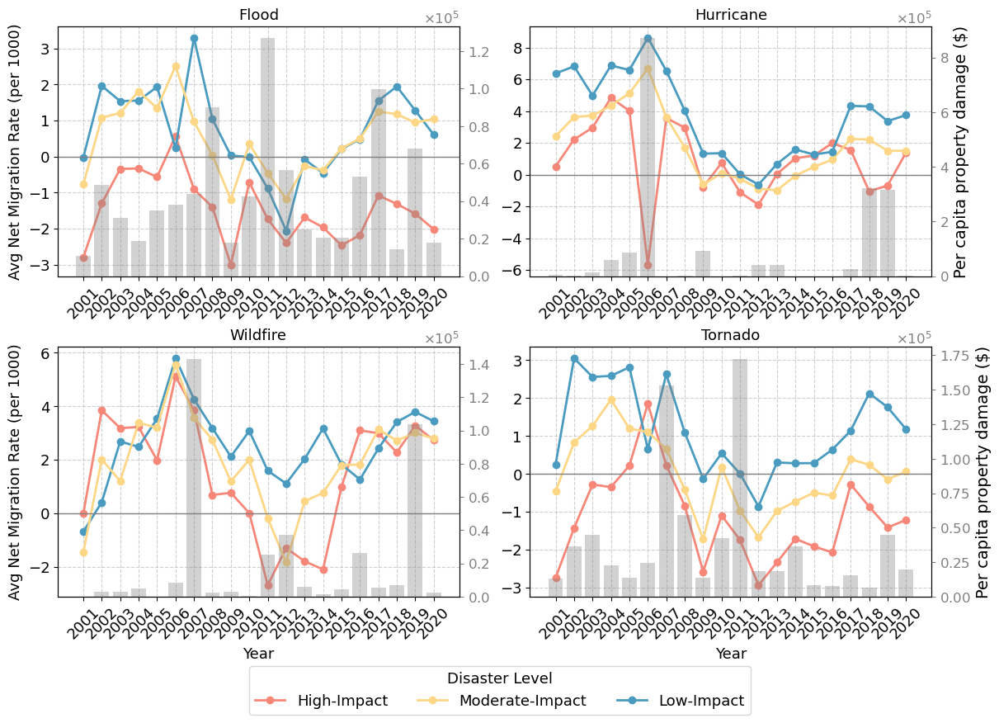

In [51]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
axes = axes.flatten()
years = list(range(2001, 2021))
fontsize = 13  # Slightly larger font for better readability
bar_x = 2020
bar_width = 0.8
# Improved color palette for visual distinction
colors = ['#499BC0', '#FDD786', '#F78779']

# Plotting data for floods
axes[0].plot(years, yearly_flooding_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[0].plot(years, yearly_flooding_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[0].plot(years, yearly_flooding_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[0]
ax2 = ax1.twinx()
ax2.bar(Year_list[0], flood_dmg_list, width=bar_width, color="grey", alpha=0.35)
# ax2.set_ylabel("Properyty Damage", fontsize=14)
set_right_axis_sci(ax2)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[0].set_title("Flood", fontsize=fontsize)
# axes[0].set_xlabel("Year", fontsize=fontsize)
axes[0].set_ylabel("Avg Net Migration Rate (per 1000)", fontsize=fontsize)
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[0].tick_params(axis='y', labelsize=fontsize)
# axes[0].legend(title="Disaster Level", fontsize=fontsize)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].axhline(0, color='gray', linewidth=1)

# Plotting data for hurricanes
axes[1].plot(years, yearly_hurricane_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High-Impact', linewidth=2)
axes[1].plot(years, yearly_hurricane_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Moderate-Impact', linewidth=2)
axes[1].plot(years, yearly_hurricane_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low-Impact', linewidth=2)

ax1 = axes[1]
ax2 = ax1.twinx()
ax2.bar(Year_list[1], hurricane_dmg_list, width=bar_width, color="grey", alpha=0.35)
ax2.set_ylabel("Per capita property damage ($)", fontsize=14)
set_right_axis_sci(ax2)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[1].set_title("Hurricane", fontsize=fontsize)
# axes[1].set_xlabel("Year", fontsize=fontsize)
# axes[1].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation=45, fontsize=fontsize)
# axes[1].legend(title="Disaster Level",fontsize=fontsize,loc='best')
axes[1].tick_params(axis='y', labelsize=fontsize)
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].axhline(0, color='gray', linewidth=1)

# Plotting data for wildfires
axes[2].plot(years, yearly_wildfire_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[2].plot(years, yearly_wildfire_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[2].plot(years, yearly_wildfire_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[2]
ax2 = ax1.twinx()
ax2.bar(Year_list[2], wildfire_dmg_list, width=bar_width, color="grey", alpha=0.35)
# ax2.set_ylabel("Properyty Damage", fontsize=14)
set_right_axis_sci(ax2)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[2].set_title("Wildfire", fontsize=fontsize)
axes[2].set_xlabel("Year", fontsize=fontsize)
axes[2].set_ylabel("Avg Net Migration Rate (per 1000)", fontsize=fontsize)
axes[2].set_xticks(years)
axes[2].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[2].tick_params(axis='y', labelsize=fontsize)
# axes[2].legend(title="Disaster Level", fontsize=fontsize)
axes[2].grid(True, linestyle='--', alpha=0.6)
axes[2].axhline(0, color='gray', linewidth=1)

# Plotting data for tornadoes
axes[3].plot(years, yearly_tornado_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[3].plot(years, yearly_tornado_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[3].plot(years, yearly_tornado_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[3]
ax2 = ax1.twinx()
ax2.bar(Year_list[3], tornado_dmg_list, width=bar_width, color="grey", alpha=0.35)
set_right_axis_sci(ax2)
ax2.set_ylabel("Per capita property damage ($)", fontsize=14)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[3].set_title("Tornado", fontsize=fontsize)
axes[3].set_xlabel("Year", fontsize=fontsize)
# axes[3].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[3].set_xticks(years)
axes[3].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[3].tick_params(axis='y', labelsize=fontsize)
# axes[3].legend(title="Disaster Level", fontsize=fontsize)
axes[3].grid(True, linestyle='--', alpha=0.6)
axes[3].axhline(0, color='gray', linewidth=1)

handles, labels = axes[1].get_legend_handles_labels()
fig.legend(handles, labels,
           loc='upper center',
           bbox_to_anchor=(0.5, 0.01),
           ncol=3,
           fontsize=fontsize,
           title='Disaster Level',
           title_fontsize=fontsize)
# plt.tight_layout()
fig.savefig(r"F:\LongMig2025\results\maps\plot2\NMR_0923.png", dpi=1000, bbox_inches="tight")


plt.show()



In [51]:
Floods = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
Floods = Floods.rename(columns={"frequency":"Flood_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Flood_Loss","Fatalities":"Flood_Fatalities","Injuries":"Flood_Injuries"})
Hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
Hurricane = Hurricane.rename(columns={"frequency":"Hurricane_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Hurricane_Loss","Fatalities":"Hurricane_Fatalities","Injuries":"Hurricane_Injuries"})
Wildfire = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]
Wildfire = Wildfire.rename(columns={"frequency":"Wildfire_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Wildfire_Loss","Fatalities":"Wildfire_Fatalities","Injuries":"Wildfire_Injuries"})
Tornado = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Tornado"]
Tornado = Tornado.rename(columns={"frequency":"Tornado_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Tornado_Loss","Fatalities":"Tornado_Fatalities","Injuries":"Tornado_Injuries"})
# Heat = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Heat"]
# Heat = Heat.rename(columns={"frequency":"Heat_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Heat_Loss","Fatalities":"Heat_Fatalities","Injuries":"Heat_Injuries"})
Floods["Flood_Occur"] = 1
Hurricane["Hurricane_Occur"] = 1
Wildfire["Wildfire_Occur"] = 1
Tornado["Tornado_Occur"] = 1
# Heat["Heat_Occur"] = 1
Floods = Floods[["FIPS","Flood_Frequency","Flood_Loss","Flood_Occur","Flood_Fatalities","Flood_Injuries"]]
Hurricane = Hurricane[["FIPS","Hurricane_Frequency","Hurricane_Loss","Hurricane_Occur","Hurricane_Fatalities","Hurricane_Injuries"]]
Wildfire = Wildfire[["FIPS","Wildfire_Frequency","Wildfire_Loss","Wildfire_Occur","Wildfire_Fatalities","Wildfire_Injuries"]]
Tornado = Tornado[["FIPS","Tornado_Frequency","Tornado_Loss","Tornado_Occur","Tornado_Fatalities","Tornado_Injuries"]]
# Heat = Heat[["FIPS","Heat_Frequency","Heat_Loss","Heat_Occur","Heat_Fatalities","Heat_Injuries"]]

In [52]:
Disaster = pd.merge(Floods,Hurricane,on="FIPS",how='outer')
Disaster = pd.merge(Disaster,Wildfire,on="FIPS",how='outer')
Disaster = pd.merge(Disaster,Tornado,on="FIPS",how='outer')
# Disaster = pd.merge(Disaster,Heat,on="FIPS",how='outer')
Disaster = Disaster.fillna(0)
Disaster["FIPS"] = Disaster["FIPS"].astype(str).str.rjust(5,"0")

In [53]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [54]:
df_pep_0120["NetMigrationRateTotal"] = df_pep_0120[correct_netmig_columns].mean(axis=1)
df_pep_0120_used = df_pep_0120[['FIPS','STNAME_x', 'CTYNAME_x', 'NetMigrationRateTotal']]

In [55]:
df_NMR = pd.merge(df_pep_0120_used,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

In [56]:
correct_nmr_columns = ["FIPS","RNETMIG2001","RNETMIG2002","RNETMIG2003","RNETMIG2004",
                       "RNETMIG2005","RNETMIG2006","RNETMIG2007","RNETMIG2008","RNETMIG2009",
                       "RNETMIG2010","RNETMIG2011","RNETMIG2012","RNETMIG2013","RNETMIG2014",
                       "RNETMIG2015","RNETMIG2016","RNETMIG2017","RNETMIG2018","RNETMIG2019","RNETMIG2020"]
correct_nmr_columns_rev = ["FIPS","NMR2001","NMR2002","NMR2003","NMR2004",
                       "NMR2005","NMR2006","NMR2007","NMR2008","NMR2009",
                       "NMR2010","NMR2011","NMR2012","NMR2013","NMR2014",
                       "NMR2015","NMR2016","NMR2017","NMR2018","NMR2019","NMR2020"]

df_pep_0120_nmr_use = df_pep_0120[correct_nmr_columns]
df_pep_0120_nmr_use.columns = correct_nmr_columns_rev


In [57]:
years = range(2001, 2021)
year_cols = [f'NMR{year}' for year in years]
dfnmr_long = pd.melt(df_pep_0120_nmr_use, id_vars=['FIPS'], value_vars=year_cols, var_name='Year', value_name='NMR')
dfnmr_long['Year'] = dfnmr_long['Year'].str.extract('(\d+)').astype(int)

<>:4: SyntaxWarning: invalid escape sequence '\d'
<>:4: SyntaxWarning: invalid escape sequence '\d'
C:\Users\xiang11\AppData\Local\Temp\ipykernel_19640\910903619.py:4: SyntaxWarning: invalid escape sequence '\d'
  dfnmr_long['Year'] = dfnmr_long['Year'].str.extract('(\d+)').astype(int)


In [58]:
dfnmr_long.sort_values(by=['FIPS', 'Year'], inplace=True)

In [59]:
def add_log_transforms(df):
    df["log_count"] = np.log1p(df["Count"])
    df["log_injury"] = np.log1p(df["Injuries"])
    df["log_fatality"] = np.log1p(df["Fatalities"])
    df["log_damage"] = np.log1p(df["PropertyDmgPerCapita"])
    return df
def add_lagged_variables(df, group_col="FIPS"):
    to_lag = ["log_count", "log_injury", "log_fatality", "log_damage","Existance"]
    for var in to_lag:
        df[f"{var}_lag1"] = df.groupby(group_col)[var].shift(1)
    return df

In [60]:
# df_flood_year = add_dummy_variables(df_flood_year)
df_flood_year_high = add_log_transforms(df_flood_year_high)
df_flood_year_high = add_lagged_variables(df_flood_year_high)
# df_hurricane_year = add_dummy_variables(df_hurricane_year)
df_hurricane_year_high = add_log_transforms(df_hurricane_year_high)
df_hurricane_year_high = add_lagged_variables(df_hurricane_year_high)
# df_tornado_year = add_dummy_variables(df_tornado_year)
df_tornado_year_high = add_log_transforms(df_tornado_year_high)
df_tornado_year_high = add_lagged_variables(df_tornado_year_high)
# df_wildfire_year = add_dummy_variables(df_wildfire_year)
df_wildfire_year_high = add_log_transforms(df_wildfire_year_high)
df_wildfire_year_high = add_lagged_variables(df_wildfire_year_high)

In [61]:
# df_flood_year = add_dummy_variables(df_flood_year)
df_flood_year = add_log_transforms(df_flood_year)
df_flood_year = add_lagged_variables(df_flood_year)

# df_hurricane_year = add_dummy_variables(df_hurricane_year)
df_hurricane_year = add_log_transforms(df_hurricane_year)
df_hurricane_year = add_lagged_variables(df_hurricane_year)

# df_tornado_year = add_dummy_variables(df_tornado_year)
df_tornado_year = add_log_transforms(df_tornado_year)
df_tornado_year = add_lagged_variables(df_tornado_year)

# df_wildfire_year = add_dummy_variables(df_wildfire_year)
df_wildfire_year = add_log_transforms(df_wildfire_year)
df_wildfire_year = add_lagged_variables(df_wildfire_year)

In [62]:
df_year_nmr_flood_high     = pd.merge(dfnmr_long,df_flood_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_hurricane_high = pd.merge(dfnmr_long,df_hurricane_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_tornado_high   = pd.merge(dfnmr_long,df_tornado_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_wildfire_high  = pd.merge(dfnmr_long,df_wildfire_year_high,on=["FIPS",'Year'],how="inner")

In [63]:
df_year_nmr_flood_high.to_csv(r"F:\LongMig2025\results\Panel\floodpanel_high.csv")
df_year_nmr_hurricane_high.to_csv(r"F:\LongMig2025\results\Panel\hurricanepanel_high.csv")
df_year_nmr_tornado_high.to_csv(r"F:\LongMig2025\results\Panel\tornadopanel_high.csv")
df_year_nmr_wildfire_high.to_csv(r"F:\LongMig2025\results\Panel\wildfirepanel_high.csv")

### NMR Map

<Figure size 1000x800 with 0 Axes>

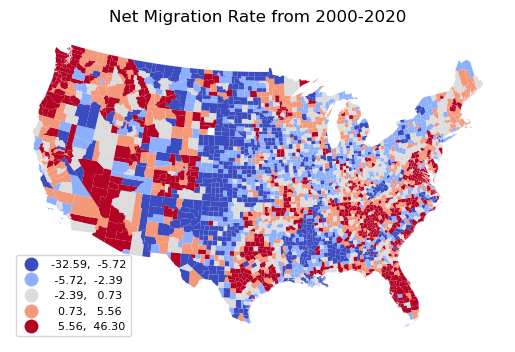

In [64]:
plt.figure(figsize=(10, 8))
gdf_NMR.plot(column="NetMigrationRateTotal",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,legend_kwds={
        "fontsize": 8,  # Adjust font size for smaller text
        "loc": "lower left",  # Position the legend
    })
plt.title("Net Migration Rate from 2000-2020")
plt.axis('off')
plt.show()

### Disaster map

In [65]:
df_disaster = pd.merge(df_20_years_by_county,county,left_on="FIPS",right_on="FIPS",how="inner")
gdf_disaster = gpd.GeoDataFrame(df_disaster,geometry="geometry")

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)


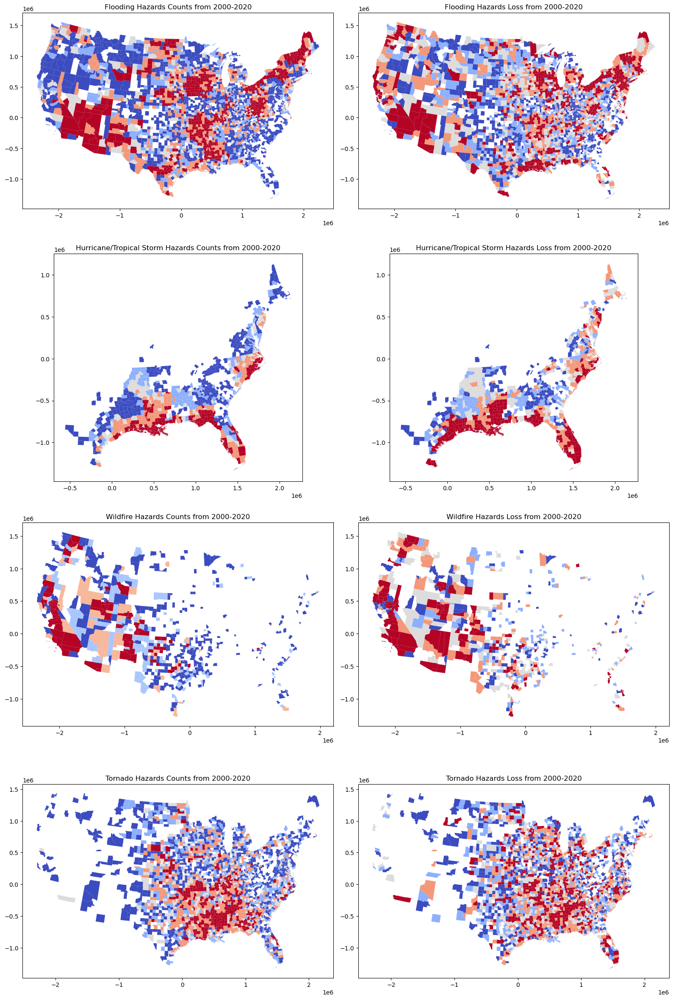

In [66]:
fig, axes = plt.subplots(4,2,figsize=(16,24))
list_disaster = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
for i in range(4):
    use_df_disaster = gdf_disaster[gdf_disaster["Hazard"] == str(list_disaster[i])]
#     print(use_df_disaster.head())
    use_df_disaster.plot(column="frequency",cmap="coolwarm",scheme='quantiles',
#                          classification_kwds={'bins':[1,3,5,10,20,50]},
                         ax=axes[i,0])
    use_df_disaster.plot(column="PropertyDmg(ADJ 2020)",cmap="coolwarm",scheme="quantiles",
#                          ,legend=True,
                         ax=axes[i,1])
    axes[i,0].set_title(f"{list_disaster[i]} Hazards Counts from 2000-2020")
    axes[i,1].set_title(f"{list_disaster[i]} Hazards Loss from 2000-2020")
plt.tight_layout()
plt.show()

# AutoML

### Combine each dataset

In [67]:
Regression_data = pd.DataFrame()
Regression_data = df_pep_0120
Regression_data = pd.merge(Regression_data,Disaster,on="FIPS",how="outer")
Regression_data = pd.merge(Regression_data,HAI,on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Hurricane,left_on="FIPS",right_on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Wildfire,left_on="FIPS",right_on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Tornado,left_on="FIPS",right_on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Heat,left_on="FIPS",right_on="FIPS",how="outer")
Regression_data = pd.merge(Regression_data,SVI_10,on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,NRI_CONUS,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,unemployment_rate_pivot,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,PopDensity_CONUS_sel,on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,conus_annual_prices,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,MedianHouseValue,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,MedianHouseIndicator,on="FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,GDP_final_data,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,T_sel,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,Amenity,on="FIPS",how="outer")

In [68]:
used_list_flood = [
    "FIPS","NetMigrationRateTotal",#PEP
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_flood = [
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_flood = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Dmg","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%Poverty","%Unemployed","PerCapIncome","%NoDiploma","%Elderly",
    "%Child","%Single-Parent","%Minority","%LimitedEng",
    "%MultiUHouse","%MHome","%Pop>Room","%NoVehicle","%GroupQuarters",
    "PopDensity",
    "HAI",
    "MedIncome",
#     "MedianHHIncome2020",
    "%ChgIncome","Income/HV",
#     "Income/Value2020",
    "%Income/%HV",#House Indicators
    'Amenity' #Amenity
]    

used_list_hurricane = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_hurricane = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_hurricane =  [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Dmg","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%Poverty","%Unemployed","PerCapIncome","%NoDiploma","%Elderly",
    "%Child","%Single-Parent","%Minority","%LimitedEng",
    "%MultiUHouse","%MHome","%Pop>Room","%NoVehicle","%GroupQuarters",
    "PopDensity",
    "HAI",
    "MedIncome",
#     "MedianHHIncome2020",
    "%ChgIncome","Income/HV",
#     "Income/Value2020",
    "%Income/%HV",#House Indicators
    'Amenity' #Amenity
]    


used_list_wildfire = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_wildfire = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_wildfire = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Dmg","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%Poverty","%Unemployed","PerCapIncome","%NoDiploma","%Elderly",
    "%Child","%Single-Parent","%Minority","%LimitedEng",
    "%MultiUHouse","%MHome","%Pop>Room","%NoVehicle","%GroupQuarters",
    "PopDensity",
    "HAI",
    "MedIncome",
#     "MedianHHIncome2020",
    "%ChgIncome","Income/HV",
#     "Income/Value2020",
    "%Income/%HV",#House Indicators
    'Amenity' #Amenity
]    



used_list_tornado = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_tornado = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_tornado = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Dmg","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%Poverty","%Unemployed","PerCapIncome","%NoDiploma","%Elderly",
    "%Child","%Single-Parent","%Minority","%LimitedEng",
    "%MultiUHouse","%MHome","%Pop>Room","%NoVehicle","%GroupQuarters",
    "PopDensity",
    "HAI",
    "MedIncome",
#     "MedianHHIncome2020",
    "%ChgIncome","Income/HV",
#     "Income/Value2020",
    "%Income/%HV",#House Indicators
    'Amenity' #Amenity
]    

In [69]:
Regression_data = Regression_data[~np.isinf(Regression_data['income/value2000'])]

In [70]:
Regression_data["W_HT_HAI_rev"]=-Regression_data["W_HT_HAI"]

In [71]:
Regression_data = Regression_data.fillna(0)

In [72]:
Flood_Regression_data = Regression_data[(Regression_data["FIPS"].isin(flooding_list))&(Regression_data["Flood_Occur"]!=0)].reset_index()
Hurricane_Regression_data = Regression_data[(Regression_data["FIPS"].isin(hurricane_list))&(Regression_data["Hurricane_Occur"]!=0)].reset_index()
Wildfire_Regression_data = Regression_data[(Regression_data["FIPS"].isin(wildfire_list))&(Regression_data["Wildfire_Occur"]!=0)].reset_index()
Tornado_Regression_data = Regression_data[(Regression_data["FIPS"].isin(tornado_list))&(Regression_data["Tornado_Occur"]!=0)].reset_index()

In [73]:
scaler = RobustScaler()
remove_list = []
Flood_Regression_data_used = Flood_Regression_data[used_list_flood]
Flood_Regression_data_used[standard_list_flood] = scaler.fit_transform(Flood_Regression_data_used[standard_list_flood])
Flood_Regression_data_used.columns = name_list_flood
Flood_Regression_data_used = Flood_Regression_data_used[~Flood_Regression_data_used["FIPS"].isin(remove_list)]

Hurricane_Regression_data_used = Hurricane_Regression_data[used_list_hurricane]
Hurricane_Regression_data_used[standard_list_hurricane] = scaler.fit_transform(Hurricane_Regression_data_used[standard_list_hurricane])
Hurricane_Regression_data_used.columns = name_list_hurricane
Hurricane_Regression_data_used = Hurricane_Regression_data_used[~Hurricane_Regression_data_used["FIPS"].isin(remove_list)]

Wildfire_Regression_data_used = Wildfire_Regression_data[used_list_wildfire]
Wildfire_Regression_data_used[standard_list_wildfire] = scaler.fit_transform(Wildfire_Regression_data_used[standard_list_wildfire])
Wildfire_Regression_data_used.columns = name_list_wildfire
Wildfire_Regression_data_used = Wildfire_Regression_data_used[~Wildfire_Regression_data_used["FIPS"].isin(remove_list)]

Tornado_Regression_data_used = Tornado_Regression_data[used_list_tornado]
Tornado_Regression_data_used[standard_list_tornado] = scaler.fit_transform(Tornado_Regression_data_used[standard_list_tornado])
Tornado_Regression_data_used.columns = name_list_tornado
Tornado_Regression_data_used = Tornado_Regression_data_used[~Tornado_Regression_data_used["FIPS"].isin(remove_list)]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_19640\4177641814.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Flood_Regression_data_used[standard_list_flood] = scaler.fit_transform(Flood_Regression_data_used[standard_list_flood])
C:\Users\xiang11\AppData\Local\Temp\ipykernel_19640\4177641814.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Hurricane_Regression_data_used[standard_list_hurricane] = scaler.fit_transform(Hurricane_Regression_data_used[standard_list_hurricane])
C:\Users\xiang11\AppData\L

In [74]:
Floodhigh_Regression_data_used = Flood_Regression_data_used[Flood_Regression_data_used["FIPS"].isin(flooding_high_list)]
Hurricanehigh_Regression_data_used = Hurricane_Regression_data_used[Hurricane_Regression_data_used["FIPS"].isin(hurricane_high_list)]
Wildfirehigh_Regression_data_used = Wildfire_Regression_data_used[Wildfire_Regression_data_used["FIPS"].isin(wildfire_high_list)]
Tornadohigh_Regression_data_used = Tornado_Regression_data_used[Tornado_Regression_data_used["FIPS"].isin(tornado_high_list)]

In [75]:
Floodlow_Regression_data_used = Flood_Regression_data_used[Flood_Regression_data_used["FIPS"].isin(flooding_low_list)]
Hurricanelow_Regression_data_used = Hurricane_Regression_data_used[Hurricane_Regression_data_used["FIPS"].isin(hurricane_low_list)]
Wildfirelow_Regression_data_used = Wildfire_Regression_data_used[Wildfire_Regression_data_used["FIPS"].isin(wildfire_low_list)]
Tornadolow_Regression_data_used = Tornado_Regression_data_used[Tornado_Regression_data_used["FIPS"].isin(tornado_low_list)]

In [76]:
Floodmed_Regression_data_used = Flood_Regression_data_used[Flood_Regression_data_used["FIPS"].isin(flooding_med_list)]
Hurricanemed_Regression_data_used = Hurricane_Regression_data_used[Hurricane_Regression_data_used["FIPS"].isin(hurricane_med_list)]
Wildfiremed_Regression_data_used = Wildfire_Regression_data_used[Wildfire_Regression_data_used["FIPS"].isin(wildfire_med_list)]
Tornadomed_Regression_data_used = Tornado_Regression_data_used[Tornado_Regression_data_used["FIPS"].isin(tornado_med_list)]

In [77]:
Floodhigh_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Flood_Regression_data_high.csv")
Hurricanehigh_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Hurricane_Regression_data_high.csv")
Wildfirehigh_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Wildfire_Regression_data_high.csv")
Tornadohigh_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Tornado_Regression_data_high.csv")

In [78]:
Floodlow_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Flood_Regression_data_low.csv")
Hurricanelow_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Hurricane_Regression_data_low.csv")
Wildfirelow_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Wildfire_Regression_data_low.csv")
Tornadolow_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Tornado_Regression_data_low.csv")

In [79]:
Floodmed_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Flood_Regression_data_med.csv")
Hurricanemed_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Hurricane_Regression_data_med.csv")
Wildfiremed_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Wildfire_Regression_data_med.csv")
Tornadomed_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Tornado_Regression_data_med.csv")

## OLS

In [80]:
import pandas as pd
import numpy as np
from pathlib import Path
from typing import List, Optional, Dict, Any, Tuple

import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score


def _cv_metrics(X: pd.DataFrame, y: pd.Series, folds: int = 5, random_state: int = 42) -> Dict[str, float]:
    """Compute 5-fold CV R^2 & RMSE (mean ± std) with sklearn LinearRegression."""
    cv = KFold(n_splits=folds, shuffle=True, random_state=random_state)

    r2_scores = cross_val_score(LinearRegression(), X, y, cv=cv, scoring="r2")

    # RMSE: prefer neg_root_mean_squared_error (newer sklearn), else fall back to MSE->RMSE
    try:
        rmse_scores = -cross_val_score(
            LinearRegression(), X, y, cv=cv, scoring="neg_root_mean_squared_error"
        )
    except ValueError:
        mse = -cross_val_score(
            LinearRegression(), X, y, cv=cv, scoring="neg_mean_squared_error"
        )
        rmse_scores = np.sqrt(mse)

    return {
        "R2_mean": float(np.mean(r2_scores)),
        "R2_std": float(np.std(r2_scores)),
        "RMSE_mean": float(np.mean(rmse_scores)),
        "RMSE_std": float(np.std(rmse_scores)),
    }


def _fit_sm_ols(X: pd.DataFrame, y: pd.Series) -> Tuple[Any, pd.DataFrame, Dict[str, float]]:
    """Fit statsmodels OLS and return model, tidy coef table, and fit stats."""
    Xc = sm.add_constant(X, has_constant="add")
    model = sm.OLS(y, Xc, missing="drop").fit()

    coefs = pd.DataFrame({
        "term": model.params.index,
        "coef": model.params.values,
        "std_err": model.bse.values,
        "t": model.tvalues.values,
        "p>|t|": model.pvalues.values,
    })
    ci = model.conf_int()
    coefs["ci_lower"] = ci[0].values
    coefs["ci_upper"] = ci[1].values

    fit_stats = {
        "n_obs": int(model.nobs),
        "df_model": float(model.df_model),
        "df_resid": float(model.df_resid),
        "R2": float(model.rsquared),
        "Adj_R2": float(model.rsquared_adj),
        "RMSE_full_sample": float(np.sqrt(np.mean(model.resid ** 2))),
    }
    return model, coefs, fit_stats


def run_ols_benchmark(
    csv_path: str,
    target: str = "NMR",
    disaster_cols: Optional[List[str]] = None,
    id_like_cols: Optional[List[str]] = None,
    folds: int = 5,
    random_state: int = 42,
    save_csv: bool = True,
    output_dir: Optional[str] = None,
    output_prefix: Optional[str] = None,
) -> Dict[str, pd.DataFrame]:
    """
    Run two OLS benchmarks on a (FIPS-level, 20-year aggregated) dataset:
      A) Without disaster variables
      B) With all variables (including disaster variables)

    Returns dict of DataFrames:
      - cv_metrics: per-model cross-validated RMSE & R2 (mean ± std)
      - fit_stats:  full-sample OLS fit stats (R2, Adj R2, RMSE_full_sample, etc.)
      - coefficients: tidy coefficient tables for both models

    Also (optionally) saves three CSVs.

    Parameters
    ----------
    csv_path : str
        Path to the CSV file.
    target : str
        Target column name (default 'NMR').
    disaster_cols : list[str] or None
        Disaster variable column names. Default:
        ["Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury"]
    id_like_cols : list[str] or None
        Obvious ID/index-like columns to drop if numeric (default list below).
    folds : int
        Number of CV folds (default 5).
    random_state : int
        Random seed for KFold shuffling (default 42).
    save_csv : bool
        Whether to save CSV outputs (default True).
    output_dir : str or None
        Directory to save outputs; default: same folder as csv_path.
    output_prefix : str or None
        Prefix for output filenames; default: stem of csv_path.
    """
    if disaster_cols is None:
        disaster_cols = ["Disaster_Count", "Disaster_Loss", "Disaster_Fatality", "Disaster_Injury"]

    if id_like_cols is None:
        id_like_cols = ["FIPS", "fips", "GEOID", "geoid", "Unnamed: 0", "Unnamed: 0.1"]

    # Load
    csv_path = Path(csv_path)
    df_raw = pd.read_csv(csv_path)

    # Keep only numeric columns; coerce target if necessary
    df = df_raw.copy()
    if target not in df.columns:
        raise ValueError(f"Target '{target}' not found in {csv_path.name} columns.")

    # Coerce target to numeric if needed
    if not pd.api.types.is_numeric_dtype(df[target]):
        df[target] = pd.to_numeric(df[target], errors="coerce")

    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

    # Drop numeric ID-like columns if present
    drop_cols = [c for c in numeric_cols if c in id_like_cols]
    numeric_cols = [c for c in numeric_cols if c not in drop_cols]

    # Build numeric-only working frame; ensure target included
    if target not in numeric_cols:
        numeric_cols.append(target)
    df_num = df[numeric_cols].copy()

    # Drop rows with NaN in target
    df_num = df_num[~df_num[target].isna()].copy()

    # Define feature sets
    def build_features(include_disaster: bool) -> List[str]:
        feats = [c for c in df_num.columns if c != target]
        # Remove disaster cols that are present in the data (ignore missing)
        if not include_disaster:
            feats = [c for c in feats if c not in disaster_cols]
        return feats

    # Model A: without disaster vars
    features_A = build_features(include_disaster=False)
    X_A = df_num[features_A].dropna(axis=0, how="any").copy()
    y_A = df_num.loc[X_A.index, target].copy()

    # Model B: with all vars (including any disaster vars that exist)
    features_B = build_features(include_disaster=True)
    X_B = df_num[features_B].dropna(axis=0, how="any").copy()
    y_B = df_num.loc[X_B.index, target].copy()

    # CV metrics
    metrics_A = _cv_metrics(X_A, y_A, folds=folds, random_state=random_state)
    metrics_A.update({"model": "OLS (No Disaster Vars)", "n": int(len(y_A)), "k_features": int(X_A.shape[1])})

    metrics_B = _cv_metrics(X_B, y_B, folds=folds, random_state=random_state)
    metrics_B.update({"model": "OLS (All Vars)", "n": int(len(y_B)), "k_features": int(X_B.shape[1])})

    cv_metrics_df = pd.DataFrame([metrics_A, metrics_B])[
        ["model", "n", "k_features", "R2_mean", "R2_std", "RMSE_mean", "RMSE_std"]
    ]

    # Full-sample OLS (for coefficients and reference fit stats)
    _, coefs_A, fit_A = _fit_sm_ols(X_A, y_A)
    _, coefs_B, fit_B = _fit_sm_ols(X_B, y_B)

    fit_A.update({"model": "OLS (No Disaster Vars)"})
    fit_B.update({"model": "OLS (All Vars)"})
    fit_stats_df = pd.DataFrame([fit_A, fit_B])[
        ["model", "n_obs", "df_model", "df_resid", "R2", "Adj_R2", "RMSE_full_sample"]
    ]

    coefs_A.insert(0, "model", "OLS (No Disaster Vars)")
    coefs_B.insert(0, "model", "OLS (All Vars)")
    coefficients_df = pd.concat([coefs_A, coefs_B], ignore_index=True)

    # Save CSVs
    outputs = {
        "cv_metrics": cv_metrics_df,
        "fit_stats": fit_stats_df,
        "coefficients": coefficients_df,
    }

    if save_csv:
        out_dir = Path(output_dir) if output_dir else csv_path.parent
        out_dir.mkdir(parents=True, exist_ok=True)
        prefix = output_prefix if output_prefix else csv_path.stem

        outputs["cv_metrics"].to_csv(out_dir / f"{prefix}_ols_cv_metrics.csv", index=False)
        outputs["fit_stats"].to_csv(out_dir / f"{prefix}_ols_fullsample_fitstats.csv", index=False)
        outputs["coefficients"].to_csv(out_dir / f"{prefix}_ols_coefficients.csv", index=False)

    return outputs


# --------- 示例用法 ----------
if __name__ == "__main__":
    # 单文件
    res = run_ols_benchmark(
        csv_path=r"F:\LongMig2025\data\Regression\Flood_Regression_data_high.csv",
        target="NMR",
        disaster_cols=["Disaster_Count", "Disaster_Loss", "Disaster_Fatality", "Disaster_Injury"],
        # 如果你的文件里 FIPS 不是字符串而是数字，默认会被识别为数值列；我们在函数里会把 ID-like 列过滤掉
        id_like_cols=["FIPS", "fips", "GEOID", "geoid", "Unnamed: 0", "Unnamed: 0.1"],
        folds=5,
        random_state=42,
        save_csv=True,              # 会在同目录输出 3 个 CSV
        output_dir=None,            # None 表示和原 CSV 同目录
        output_prefix=None,         # None 表示用文件名的 stem 作为前缀
    )

    # 多文件批处理（把你的另外 3 个文件名替换下面的占位符即可）
    more_files = [
        r"F:\LongMig2025\data\Regression\Hurricane_Regression_data_high.csv",
        r"F:\LongMig2025\data\Regression\Wildfire_Regression_data_high.csv",
        r"F:\LongMig2025\data\Regression\Tornado_Regression_data_high.csv",
    ]
    for p in more_files:
        run_ols_benchmark(p, target="NMR", save_csv=True)


In [81]:
import pandas as pd
import numpy as np
from pathlib import Path
from typing import List, Optional, Dict, Any, Tuple

import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score


def _cv_metrics(X: pd.DataFrame, y: pd.Series, folds: int = 5, random_state: int = 42) -> Dict[str, float]:
    """Compute 5-fold CV R^2 & RMSE (mean ± std) with sklearn LinearRegression."""
    cv = KFold(n_splits=folds, shuffle=True, random_state=random_state)

    r2_scores = cross_val_score(LinearRegression(), X, y, cv=cv, scoring="r2")

    try:
        rmse_scores = -cross_val_score(
            LinearRegression(), X, y, cv=cv, scoring="neg_root_mean_squared_error"
        )
    except ValueError:
        mse = -cross_val_score(
            LinearRegression(), X, y, cv=cv, scoring="neg_mean_squared_error"
        )
        rmse_scores = np.sqrt(mse)

    return {
        "R2_mean": float(np.mean(r2_scores)),
        "R2_std": float(np.std(r2_scores)),
        "RMSE_mean": float(np.mean(rmse_scores)),
        "RMSE_std": float(np.std(rmse_scores)),
    }


def _fit_sm_ols(X: pd.DataFrame, y: pd.Series) -> Tuple[Any, pd.DataFrame, Dict[str, float]]:
    """Fit statsmodels OLS and return model, tidy coef table, and fit stats."""
    Xc = sm.add_constant(X, has_constant="add")
    model = sm.OLS(y, Xc, missing="drop").fit()

    coefs = pd.DataFrame({
        "term": model.params.index,
        "coef": model.params.values,
        "std_err": model.bse.values,
        "t": model.tvalues.values,
        "p>|t|": model.pvalues.values,
    })
    ci = model.conf_int()
    coefs["ci_lower"] = ci[0].values
    coefs["ci_upper"] = ci[1].values

    fit_stats = {
        "n_obs": int(model.nobs),
        "df_model": float(model.df_model),
        "df_resid": float(model.df_resid),
        "R2": float(model.rsquared),
        "Adj_R2": float(model.rsquared_adj),
        "RMSE_full_sample": float(np.sqrt(np.mean(model.resid ** 2))),
    }
    return model, coefs, fit_stats


def run_ols_benchmark(
    csv_path: str,
    target: str = "NMR",
    disaster_cols: Optional[List[str]] = None,
    id_like_cols: Optional[List[str]] = None,
    folds: int = 5,
    random_state: int = 42,
    save_csv: bool = True,
    output_dir: Optional[str] = None,
    output_prefix: Optional[str] = None,
) -> Dict[str, pd.DataFrame]:
    """
    Run two OLS benchmarks:
      A) Without disaster variables
      B) With all variables (including disaster variables)

    Returns dict of DataFrames:
      - cv_metrics: printed only
      - fit_stats:  full-sample OLS fit stats
      - coefficients: tidy coefficient tables
    """
    if disaster_cols is None:
        disaster_cols = ["Disaster_Count", "Disaster_Loss", "Disaster_Fatality", "Disaster_Injury"]

    if id_like_cols is None:
        id_like_cols = ["FIPS", "fips", "GEOID", "geoid", "Unnamed: 0", "Unnamed: 0.1"]

    csv_path = Path(csv_path)
    df_raw = pd.read_csv(csv_path)

    df = df_raw.copy()
    if target not in df.columns:
        raise ValueError(f"Target '{target}' not found in {csv_path.name} columns.")

    if not pd.api.types.is_numeric_dtype(df[target]):
        df[target] = pd.to_numeric(df[target], errors="coerce")

    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    drop_cols = [c for c in numeric_cols if c in id_like_cols]
    numeric_cols = [c for c in numeric_cols if c not in drop_cols]

    if target not in numeric_cols:
        numeric_cols.append(target)
    df_num = df[numeric_cols].copy()
    df_num = df_num[~df_num[target].isna()].copy()

    def build_features(include_disaster: bool) -> List[str]:
        feats = [c for c in df_num.columns if c != target]
        if not include_disaster:
            feats = [c for c in feats if c not in disaster_cols]
        return feats

    features_A = build_features(include_disaster=False)
    X_A = df_num[features_A].dropna(axis=0, how="any").copy()
    y_A = df_num.loc[X_A.index, target].copy()

    features_B = build_features(include_disaster=True)
    X_B = df_num[features_B].dropna(axis=0, how="any").copy()
    y_B = df_num.loc[X_B.index, target].copy()

    metrics_A = _cv_metrics(X_A, y_A, folds=folds, random_state=random_state)
    metrics_A.update({"model": "OLS (No Disaster Vars)", "n": int(len(y_A)), "k_features": int(X_A.shape[1])})

    metrics_B = _cv_metrics(X_B, y_B, folds=folds, random_state=random_state)
    metrics_B.update({"model": "OLS (All Vars)", "n": int(len(y_B)), "k_features": int(X_B.shape[1])})

    cv_metrics_df = pd.DataFrame([metrics_A, metrics_B])[[
        "model", "n", "k_features", "R2_mean", "R2_std", "RMSE_mean", "RMSE_std"
    ]]

    print("\n===== Cross-validated Metrics (5-fold) =====")
    print(cv_metrics_df.round(4))

    _, coefs_A, fit_A = _fit_sm_ols(X_A, y_A)
    _, coefs_B, fit_B = _fit_sm_ols(X_B, y_B)

    fit_A.update({"model": "OLS (No Disaster Vars)"})
    fit_B.update({"model": "OLS (All Vars)"})
    fit_stats_df = pd.DataFrame([fit_A, fit_B])[[
        "model", "n_obs", "df_model", "df_resid", "R2", "Adj_R2", "RMSE_full_sample"
    ]]

    coefs_A.insert(0, "model", "OLS (No Disaster Vars)")
    coefs_B.insert(0, "model", "OLS (All Vars)")
    coefficients_df = pd.concat([coefs_A, coefs_B], ignore_index=True)

    outputs = {
        "fit_stats": fit_stats_df,
        "coefficients": coefficients_df,
    }

    if save_csv:
        out_dir = Path(output_dir) if output_dir else csv_path.parent
        out_dir.mkdir(parents=True, exist_ok=True)
        prefix = output_prefix if output_prefix else csv_path.stem

        outputs["fit_stats"].to_csv(out_dir / f"{prefix}_ols_fullsample_fitstats.csv", index=False)
        outputs["coefficients"].to_csv(out_dir / f"{prefix}_ols_coefficients.csv", index=False)

    return outputs


# --------- 示例用法 ----------
if __name__ == "__main__":
    res = run_ols_benchmark(
        csv_path=r"F:\LongMig2025\data\Regression\Flood_Regression_data_high.csv",
        target="NMR",
        disaster_cols=["Disaster_Count", "Disaster_Loss", "Disaster_Fatality", "Disaster_Injury"],
    )

    more_files = [
        r"F:\LongMig2025\data\Regression\Hurricane_Regression_data_high.csv",
        r"F:\LongMig2025\data\Regression\Wildfire_Regression_data_high.csv",
        r"F:\LongMig2025\data\Regression\Tornado_Regression_data_high.csv",
    ]
    for p in more_files:
        run_ols_benchmark(p, target="NMR", save_csv=True)



===== Cross-validated Metrics (5-fold) =====
                    model    n  k_features  R2_mean  R2_std  RMSE_mean  \
0  OLS (No Disaster Vars)  679          22   0.4388  0.0564     5.7076   
1          OLS (All Vars)  679          25   0.4505  0.0706     5.6477   

   RMSE_std  
0    0.7093  
1    0.7686  

===== Cross-validated Metrics (5-fold) =====
                    model    n  k_features  R2_mean  R2_std  RMSE_mean  \
0  OLS (No Disaster Vars)  201          22   0.5587  0.0634     6.9460   
1          OLS (All Vars)  201          25   0.4039  0.2424     8.1899   

   RMSE_std  
0    0.8194  
1    2.8204  

===== Cross-validated Metrics (5-fold) =====
                    model    n  k_features  R2_mean  R2_std  RMSE_mean  \
0  OLS (No Disaster Vars)  137          22  -0.0156  0.3087     8.4579   
1          OLS (All Vars)  137          25  -0.2034  0.5540     9.0624   

   RMSE_std  
0    0.8557  
1    1.5130  

===== Cross-validated Metrics (5-fold) =====
                    m

## Hurricane

### Without Disaster Variables

In [356]:
Hurricane_Regression_data_used["FIPS"]  = Hurricane_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Hurricane_Regression_data_used["FIPS"]
# Prepare features and target
X = Hurricane_Regression_data_used.drop(columns=["FIPS", "NMR","Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury"])
y = Hurricane_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 22:36:07] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 22:36:07] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 22:36:07] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 22:36:07] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 22:36:07] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 22:36:08] {2393} INFO - Estimated sufficient time budget=4013s. Estimated necessary time budget=22s.
[flaml.automl.logger: 09-01 22:36:08] {2442} INFO -  at 0.4s,	estimator xgboost's best error=8.8451,	best estimator xgboost's best error=8.8451
[flaml.automl.logger: 09-01 22:36:08] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 22:36:08] {2442} INFO -  at 0.7s,	estimator lgbm's best error=8.8206,	best estimator lgbm's best error=8.8206
[flaml.automl.logger:

[flaml.automl.logger: 09-01 22:36:20] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 22:36:21] {2442} INFO -  at 14.2s,	estimator histgb's best error=6.1580,	best estimator histgb's best error=6.1580
[flaml.automl.logger: 09-01 22:36:21] {2258} INFO - iteration 35, current learner xgboost
[flaml.automl.logger: 09-01 22:36:22] {2442} INFO -  at 14.7s,	estimator xgboost's best error=6.9911,	best estimator histgb's best error=6.1580
[flaml.automl.logger: 09-01 22:36:22] {2258} INFO - iteration 36, current learner extra_tree
[flaml.automl.logger: 09-01 22:36:22] {2442} INFO -  at 15.2s,	estimator extra_tree's best error=7.2511,	best estimator histgb's best error=6.1580
[flaml.automl.logger: 09-01 22:36:22] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 22:36:24] {2442} INFO -  at 16.4s,	estimator histgb's best error=6.1580,	best estimator histgb's best error=6.1580
[flaml.automl.logger: 09-01 22:36:24] {2258} INFO - iteration 

[flaml.automl.logger: 09-01 22:37:09] {2442} INFO -  at 62.1s,	estimator xgboost's best error=6.4087,	best estimator histgb's best error=6.1262
[flaml.automl.logger: 09-01 22:37:09] {2258} INFO - iteration 70, current learner xgboost
[flaml.automl.logger: 09-01 22:37:10] {2442} INFO -  at 62.7s,	estimator xgboost's best error=6.4087,	best estimator histgb's best error=6.1262
[flaml.automl.logger: 09-01 22:37:10] {2258} INFO - iteration 71, current learner extra_tree
[flaml.automl.logger: 09-01 22:37:10] {2442} INFO -  at 63.1s,	estimator extra_tree's best error=6.6918,	best estimator histgb's best error=6.1262
[flaml.automl.logger: 09-01 22:37:10] {2258} INFO - iteration 72, current learner extra_tree
[flaml.automl.logger: 09-01 22:37:11] {2442} INFO -  at 64.0s,	estimator extra_tree's best error=6.6918,	best estimator histgb's best error=6.1262
[flaml.automl.logger: 09-01 22:37:11] {2258} INFO - iteration 73, current learner extra_tree
[flaml.automl.logger: 09-01 22:37:12] {2442} INFO

[flaml.automl.logger: 09-01 22:39:01] {2258} INFO - iteration 104, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:39:02] {2442} INFO -  at 174.5s,	estimator xgb_limitdepth's best error=6.5900,	best estimator catboost's best error=6.0712
[flaml.automl.logger: 09-01 22:39:02] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-01 22:39:04] {2442} INFO -  at 176.5s,	estimator xgboost's best error=6.2121,	best estimator catboost's best error=6.0712
[flaml.automl.logger: 09-01 22:39:04] {2258} INFO - iteration 106, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:39:05] {2442} INFO -  at 177.5s,	estimator xgb_limitdepth's best error=6.5197,	best estimator catboost's best error=6.0712
[flaml.automl.logger: 09-01 22:39:05] {2258} INFO - iteration 107, current learner xgboost
[flaml.automl.logger: 09-01 22:39:05] {2442} INFO -  at 178.2s,	estimator xgboost's best error=6.2121,	best estimator catboost's best error=6.0712
[flaml.automl.logger

[flaml.automl.logger: 09-01 22:41:00] {2258} INFO - iteration 139, current learner lgbm
[flaml.automl.logger: 09-01 22:41:01] {2442} INFO -  at 294.2s,	estimator lgbm's best error=6.2242,	best estimator catboost's best error=6.0646
[flaml.automl.logger: 09-01 22:41:01] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-01 22:41:10] {2442} INFO -  at 302.8s,	estimator xgboost's best error=6.0918,	best estimator catboost's best error=6.0646
[flaml.automl.logger: 09-01 22:41:10] {2258} INFO - iteration 141, current learner lgbm
[flaml.automl.logger: 09-01 22:41:12] {2442} INFO -  at 305.2s,	estimator lgbm's best error=6.2242,	best estimator catboost's best error=6.0646
[flaml.automl.logger: 09-01 22:41:12] {2258} INFO - iteration 142, current learner xgboost
[flaml.automl.logger: 09-01 22:41:14] {2442} INFO -  at 306.5s,	estimator xgboost's best error=6.0918,	best estimator catboost's best error=6.0646
[flaml.automl.logger: 09-01 22:41:14] {2258} INFO - iteratio

[flaml.automl.logger: 09-01 22:42:34] {2258} INFO - iteration 174, current learner histgb
[flaml.automl.logger: 09-01 22:42:35] {2442} INFO -  at 387.5s,	estimator histgb's best error=6.0640,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:42:35] {2258} INFO - iteration 175, current learner histgb
[flaml.automl.logger: 09-01 22:42:35] {2442} INFO -  at 388.2s,	estimator histgb's best error=6.0640,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:42:35] {2258} INFO - iteration 176, current learner histgb
[flaml.automl.logger: 09-01 22:42:36] {2442} INFO -  at 389.1s,	estimator histgb's best error=6.0640,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:42:36] {2258} INFO - iteration 177, current learner lgbm
[flaml.automl.logger: 09-01 22:42:39] {2442} INFO -  at 391.6s,	estimator lgbm's best error=6.2242,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:42:39] {2258} INFO - iteration 178, c

[flaml.automl.logger: 09-01 22:43:55] {2258} INFO - iteration 209, current learner histgb
[flaml.automl.logger: 09-01 22:43:56] {2442} INFO -  at 469.1s,	estimator histgb's best error=6.0640,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:43:56] {2258} INFO - iteration 210, current learner lgbm
[flaml.automl.logger: 09-01 22:43:58] {2442} INFO -  at 471.3s,	estimator lgbm's best error=6.2242,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:43:58] {2258} INFO - iteration 211, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:43:59] {2442} INFO -  at 472.2s,	estimator xgb_limitdepth's best error=6.2642,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:43:59] {2258} INFO - iteration 212, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:44:01] {2442} INFO -  at 474.1s,	estimator xgb_limitdepth's best error=6.2642,	best estimator histgb's best error=6.0640
[flaml.automl.logger: 09-01 22:44:01

[flaml.automl.logger: 09-01 22:45:36] {2442} INFO -  at 568.7s,	estimator xgboost's best error=5.9929,	best estimator xgboost's best error=5.9929
[flaml.automl.logger: 09-01 22:45:36] {2258} INFO - iteration 244, current learner xgboost
[flaml.automl.logger: 09-01 22:45:41] {2442} INFO -  at 573.4s,	estimator xgboost's best error=5.9929,	best estimator xgboost's best error=5.9929
[flaml.automl.logger: 09-01 22:45:41] {2258} INFO - iteration 245, current learner xgboost
[flaml.automl.logger: 09-01 22:45:47] {2442} INFO -  at 579.9s,	estimator xgboost's best error=5.9929,	best estimator xgboost's best error=5.9929
[flaml.automl.logger: 09-01 22:45:47] {2258} INFO - iteration 246, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:45:48] {2442} INFO -  at 581.2s,	estimator xgb_limitdepth's best error=6.2642,	best estimator xgboost's best error=5.9929
[flaml.automl.logger: 09-01 22:45:48] {2258} INFO - iteration 247, current learner xgboost
[flaml.automl.logger: 09-01 22:45:52] 

In [357]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")


Best estimator: xgboost
Best config: {'n_estimators': 51, 'max_leaves': 35, 'min_child_weight': 12.25665141111339, 'learning_rate': 0.07438255349647593, 'subsample': 0.690529175566814, 'colsample_bylevel': 0.9340074632922378, 'colsample_bytree': 0.8437449886778062, 'reg_alpha': 0.0009765625, 'reg_lambda': 0.14442695656912588}
Best validation loss: 5.992934793488253
Best Model Performance:
RMSE = 5.4904, MAE = 3.8001, ME = -0.3660, R² = 0.7039


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [358]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
5,histgb,5.300162,-0.279252,3.753535,0.724087
6,catboost,5.326858,-0.305692,3.666627,0.721300
4,lgbm,5.434093,-0.358567,3.908439,0.709966
0,xgboost,5.463261,-0.376576,3.852818,0.706844
2,rf,5.649912,-0.353279,3.934705,0.686471
3,extra_tree,5.857527,-0.263551,3.986731,0.663005
1,xgb_limitdepth,6.009358,-0.075869,4.132889,0.645309


In [359]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,5.573923,0.463490,3.915781,0.271337,0.051111,0.314934,0.685255,0.038226,5.589094,3.915334,0.050924,0.687569
4,lgbm,5.748398,0.438042,4.137573,0.184161,0.103166,0.433018,0.664740,0.043369,5.761486,4.137479,0.103655,0.667998
5,histgb,5.754500,0.412405,4.043518,0.200748,0.082643,0.407763,0.661961,0.060695,5.765905,4.043317,0.083035,0.667488
0,xgboost,5.872953,0.519365,4.097945,0.287218,-0.040988,0.467690,0.650441,0.045971,5.890900,4.097499,-0.040559,0.652916
2,rf,5.964353,0.567043,4.215770,0.337954,0.029727,0.484354,0.636936,0.072958,5.986205,4.215601,0.030207,0.641594
3,extra_tree,6.101822,0.539932,4.296101,0.302824,0.055517,0.479864,0.623528,0.040097,6.121116,4.295873,0.056107,0.625258
1,xgb_limitdepth,6.235286,0.432489,4.436273,0.217119,0.095948,0.302245,0.604167,0.063040,6.247267,4.436052,0.096195,0.609652


### With Disaster Variables

In [360]:
Hurricane_Regression_data_used["FIPS"]  = Hurricane_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Hurricane_Regression_data_used["FIPS"]
# Prepare features and target
X = Hurricane_Regression_data_used.drop(columns=["FIPS", "NMR"])
y = Hurricane_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 22:47:43] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 22:47:43] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 22:47:43] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 22:47:43] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 22:47:43] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 22:47:44] {2393} INFO - Estimated sufficient time budget=4682s. Estimated necessary time budget=25s.
[flaml.automl.logger: 09-01 22:47:44] {2442} INFO -  at 0.5s,	estimator xgboost's best error=8.8451,	best estimator xgboost's best error=8.8451
[flaml.automl.logger: 09-01 22:47:44] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 22:47:44] {2442} INFO -  at 0.9s,	estimator lgbm's best error=8.8206,	best estimator lgbm's best error=8.8206
[flaml.automl.logger:

[flaml.automl.logger: 09-01 22:47:57] {2442} INFO -  at 13.7s,	estimator extra_tree's best error=7.3054,	best estimator histgb's best error=6.1115
[flaml.automl.logger: 09-01 22:47:57] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 22:47:58] {2442} INFO -  at 14.4s,	estimator histgb's best error=6.1115,	best estimator histgb's best error=6.1115
[flaml.automl.logger: 09-01 22:47:58] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-01 22:47:59] {2442} INFO -  at 15.5s,	estimator rf's best error=6.7670,	best estimator histgb's best error=6.1115
[flaml.automl.logger: 09-01 22:47:59] {2258} INFO - iteration 36, current learner histgb
[flaml.automl.logger: 09-01 22:47:59] {2442} INFO -  at 16.1s,	estimator histgb's best error=6.1115,	best estimator histgb's best error=6.1115
[flaml.automl.logger: 09-01 22:47:59] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 22:48:00] {2442} INFO -  at 16.7s,	estimator his

[flaml.automl.logger: 09-01 22:48:58] {2442} INFO -  at 74.7s,	estimator xgb_limitdepth's best error=6.5656,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:48:58] {2258} INFO - iteration 69, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:48:59] {2442} INFO -  at 75.8s,	estimator xgb_limitdepth's best error=6.5656,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:48:59] {2258} INFO - iteration 70, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:49:00] {2442} INFO -  at 76.4s,	estimator xgb_limitdepth's best error=6.5656,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:49:00] {2258} INFO - iteration 71, current learner xgboost
[flaml.automl.logger: 09-01 22:49:00] {2442} INFO -  at 76.9s,	estimator xgboost's best error=6.6551,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:49:00] {2258} INFO - iteration 72, current learner xgb_limitdepth
[flaml.automl.

[flaml.automl.logger: 09-01 22:50:43] {2258} INFO - iteration 103, current learner lgbm
[flaml.automl.logger: 09-01 22:50:45] {2442} INFO -  at 181.5s,	estimator lgbm's best error=6.2907,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:50:45] {2258} INFO - iteration 104, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:50:45] {2442} INFO -  at 182.3s,	estimator xgb_limitdepth's best error=6.2245,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:50:45] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-01 22:50:46] {2442} INFO -  at 182.9s,	estimator xgboost's best error=6.6551,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:50:46] {2258} INFO - iteration 106, current learner extra_tree
[flaml.automl.logger: 09-01 22:50:47] {2442} INFO -  at 183.5s,	estimator extra_tree's best error=6.1971,	best estimator catboost's best error=5.9498
[flaml.automl.logger: 09-01 22:50:

[flaml.automl.logger: 09-01 22:51:44] {2442} INFO -  at 241.1s,	estimator extra_tree's best error=5.9240,	best estimator extra_tree's best error=5.9240
[flaml.automl.logger: 09-01 22:51:44] {2258} INFO - iteration 138, current learner catboost
[flaml.automl.logger: 09-01 22:51:57] {2442} INFO -  at 254.0s,	estimator catboost's best error=5.9498,	best estimator extra_tree's best error=5.9240
[flaml.automl.logger: 09-01 22:51:57] {2258} INFO - iteration 139, current learner extra_tree
[flaml.automl.logger: 09-01 22:51:59] {2442} INFO -  at 255.3s,	estimator extra_tree's best error=5.9240,	best estimator extra_tree's best error=5.9240
[flaml.automl.logger: 09-01 22:51:59] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-01 22:52:00] {2442} INFO -  at 257.2s,	estimator xgboost's best error=6.2901,	best estimator extra_tree's best error=5.9240
[flaml.automl.logger: 09-01 22:52:00] {2258} INFO - iteration 141, current learner extra_tree
[flaml.automl.logger: 09-0

[flaml.automl.logger: 09-01 22:53:20] {2442} INFO -  at 336.8s,	estimator xgb_limitdepth's best error=6.2245,	best estimator extra_tree's best error=5.9126
[flaml.automl.logger: 09-01 22:53:20] {2258} INFO - iteration 172, current learner xgboost
[flaml.automl.logger: 09-01 22:53:25] {2442} INFO -  at 341.4s,	estimator xgboost's best error=5.9763,	best estimator extra_tree's best error=5.9126
[flaml.automl.logger: 09-01 22:53:25] {2258} INFO - iteration 173, current learner xgboost
[flaml.automl.logger: 09-01 22:53:28] {2442} INFO -  at 345.2s,	estimator xgboost's best error=5.9763,	best estimator extra_tree's best error=5.9126
[flaml.automl.logger: 09-01 22:53:28] {2258} INFO - iteration 174, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 22:53:29] {2442} INFO -  at 345.9s,	estimator xgb_limitdepth's best error=6.2245,	best estimator extra_tree's best error=5.9126
[flaml.automl.logger: 09-01 22:53:29] {2258} INFO - iteration 175, current learner extra_tree
[flaml.automl.lo

[flaml.automl.logger: 09-01 22:55:18] {2442} INFO -  at 454.8s,	estimator extra_tree's best error=5.8993,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:55:18] {2258} INFO - iteration 206, current learner catboost
[flaml.automl.logger: 09-01 22:55:31] {2442} INFO -  at 468.1s,	estimator catboost's best error=5.9498,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:55:31] {2258} INFO - iteration 207, current learner histgb
[flaml.automl.logger: 09-01 22:55:32] {2442} INFO -  at 468.5s,	estimator histgb's best error=6.1069,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:55:32] {2258} INFO - iteration 208, current learner extra_tree
[flaml.automl.logger: 09-01 22:55:33] {2442} INFO -  at 469.8s,	estimator extra_tree's best error=5.8993,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:55:33] {2258} INFO - iteration 209, current learner lgbm
[flaml.automl.logger: 09-01 22:55:

[flaml.automl.logger: 09-01 22:56:55] {2442} INFO -  at 552.1s,	estimator histgb's best error=6.0126,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:56:55] {2258} INFO - iteration 240, current learner extra_tree
[flaml.automl.logger: 09-01 22:56:56] {2442} INFO -  at 553.0s,	estimator extra_tree's best error=5.8993,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:56:56] {2258} INFO - iteration 241, current learner extra_tree
[flaml.automl.logger: 09-01 22:56:58] {2442} INFO -  at 554.4s,	estimator extra_tree's best error=5.8993,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:56:58] {2258} INFO - iteration 242, current learner histgb
[flaml.automl.logger: 09-01 22:56:58] {2442} INFO -  at 555.0s,	estimator histgb's best error=6.0126,	best estimator extra_tree's best error=5.8993
[flaml.automl.logger: 09-01 22:56:58] {2258} INFO - iteration 243, current learner xgboost
[flaml.automl.logger: 09-01 22:

In [361]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: extra_tree
Best config: {'n_estimators': 77, 'max_features': 0.7482957867431096, 'max_leaves': 320}
Best validation loss: 5.899318919497838
Best Model Performance:
RMSE = 5.5646, MAE = 3.8480, ME = -0.4727, R² = 0.6959


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [362]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,5.387007,-0.395914,3.712618,0.714971
0,xgboost,5.391420,-0.352787,3.742466,0.714504
4,lgbm,5.509890,-0.184104,3.927503,0.701819
2,rf,5.581103,-0.360220,3.846449,0.694061
3,extra_tree,5.608184,-0.436941,3.810688,0.691085
5,histgb,5.743148,-0.166394,3.735904,0.676038
1,xgb_limitdepth,6.407154,-0.225737,4.309217,0.596796


In [363]:
y_pred = automl.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
me = np.mean(y_test - y_pred)
r2 = r2_score(y_test, y_pred)
print("✅ Best Model Performance on Test Set")
print(f"Best Model: {automl.best_estimator}")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"ME (Mean Error): {me:.4f}")


✅ Best Model Performance on Test Set
Best Model: extra_tree
R² Score: 0.6959
RMSE: 5.5646
MAE: 3.8480
ME (Mean Error): -0.4727


In [364]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,5.474100,0.527857,3.858812,0.213848,-0.019817,0.357697,0.697290,0.032912,5.494434,3.858652,-0.019825,0.698062
0,xgboost,5.766799,0.536849,4.038028,0.248496,0.042575,0.432984,0.662088,0.054218,5.786439,4.037746,0.042978,0.665116
3,extra_tree,5.802358,0.605381,4.053095,0.341145,-0.067866,0.509373,0.659227,0.047799,5.827565,4.052864,-0.067301,0.660339
5,histgb,5.814484,0.480742,4.083676,0.255283,0.053607,0.305783,0.656158,0.054720,5.830211,4.083505,0.053831,0.660030
2,rf,5.894623,0.564540,4.108900,0.289630,0.008860,0.381165,0.646045,0.065641,5.916201,4.108655,0.009312,0.649928
4,lgbm,5.900668,0.523424,4.189882,0.252417,0.082654,0.427635,0.647417,0.043424,5.918926,4.189490,0.083071,0.649605
1,xgb_limitdepth,6.275531,0.415287,4.444078,0.243644,-0.042516,0.612680,0.599840,0.053803,6.285986,4.443790,-0.041849,0.604799


In [284]:
Hurricane_Regression_data_used["FIPS"]  = Hurricane_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Hurricane_Regression_data_used["FIPS"]

In [285]:
explainer = shap.Explainer(automl.model.predict, X)
shap_values = explainer(X)

PermutationExplainer explainer: 805it [12:03,  1.10it/s]                                                               


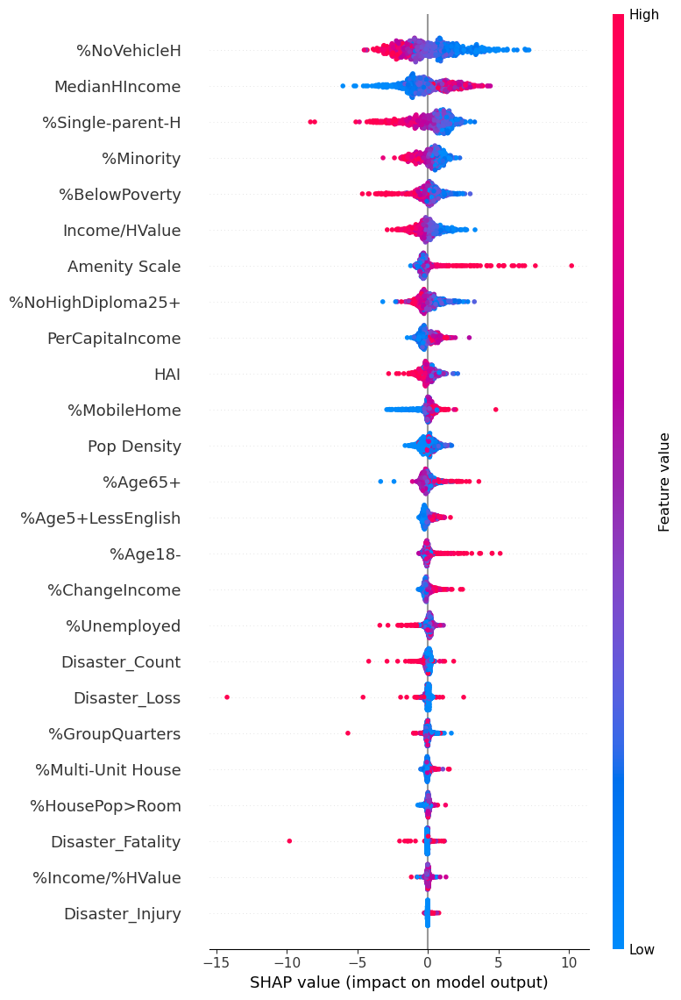

<Figure size 640x480 with 0 Axes>

In [286]:
shap_df_hurricane = pd.DataFrame(shap_values.values, columns=X.columns)
shap_df_hurricane["FIPS"] = fips_series.values

shap.summary_plot(shap_values, X,max_display=30)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Hurricane_all_0819.png', dpi=600, bbox_inches='tight')

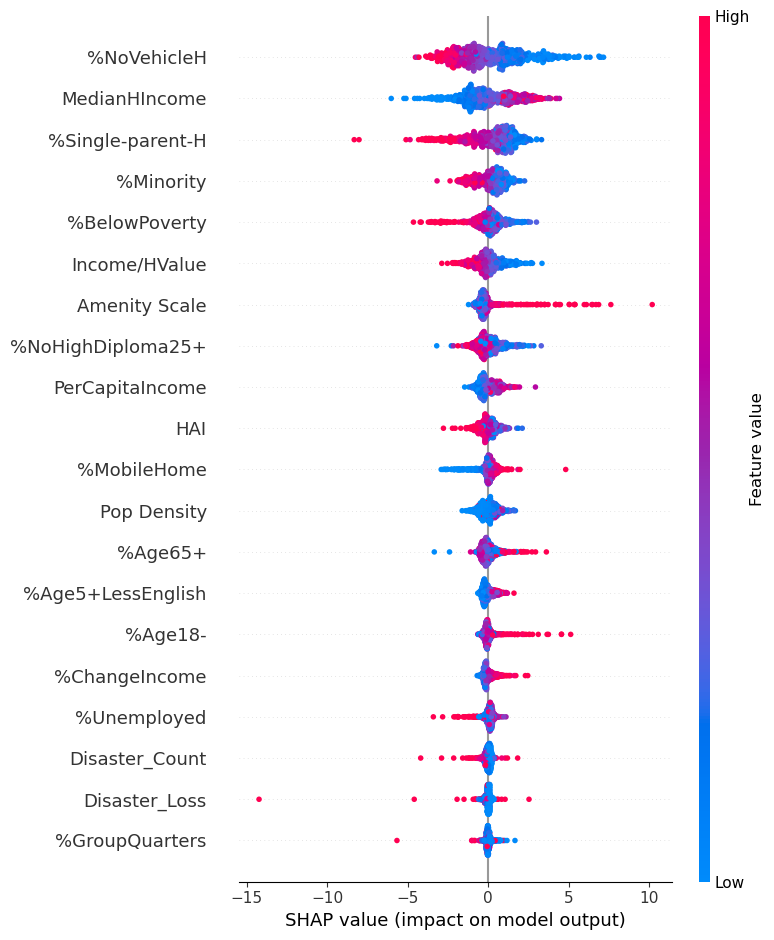

<Figure size 640x480 with 0 Axes>

In [287]:
shap.summary_plot(shap_values, X,max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Hurricane_0819.png', dpi=600, bbox_inches='tight')

Top 10 important features: ['%NoVehicleH', 'MedianHIncome', '%Single-parent-H', '%Minority', '%BelowPoverty', 'Income/HValue', 'Amenity Scale', '%NoHighDiploma25+', 'PerCapitaIncome', 'HAI']


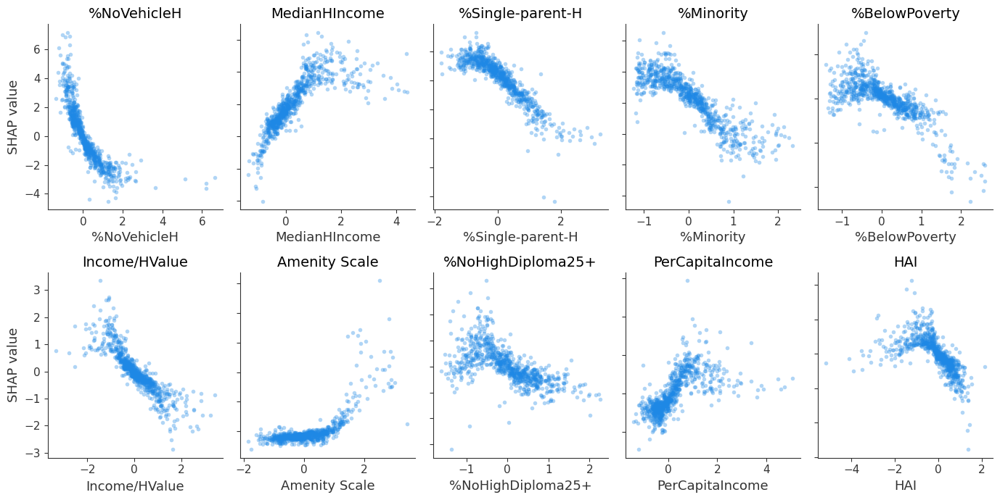

In [288]:
importance = np.abs(shap_values.values).mean(axis=0)
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance})
top_features = importance_df.sort_values(by='importance', ascending=False).head(10)['feature'].tolist()

print("Top 10 important features:", top_features)

fig, axes = plt.subplots(2, 5, figsize=(14,7))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
    if i not in [0, 5]:  
        axes[i].set_ylabel("")
        axes[i].set_yticklabels([])
    else:
        axes[i].set_ylabel("SHAP value")
    axes[i].set_title(feature, fontsize=14)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
plt.savefig(r"F:\LongMig2025\results\maps\automl\dependece_hurricane_0819.png", dpi=600, bbox_inches='tight')
plt.show()

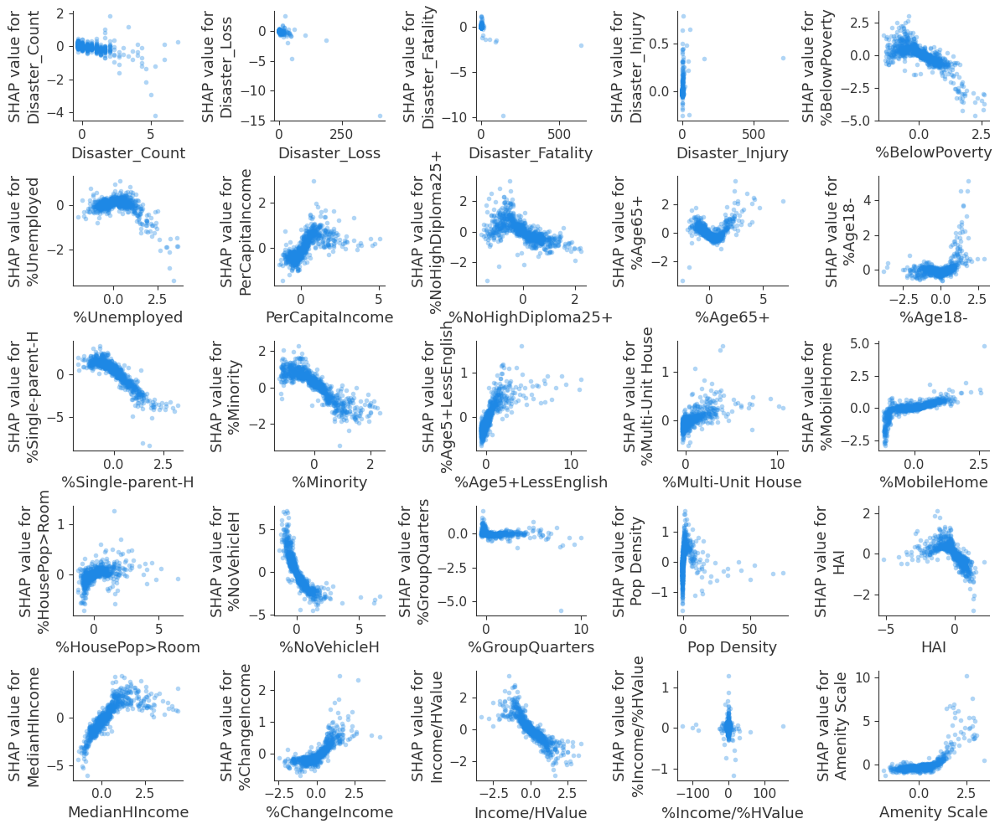

In [289]:
# Get all feature names
all_features = X.columns.tolist()

# Grid layout setup
num_features = len(all_features)
cols = 5
rows = (num_features + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12,10))
axes = axes.flatten()

# Loop through each feature to create a SHAP dependence plot in its subplot
for i, feature in enumerate(all_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
#     axes[i].set_title(f"{feature}", fontsize=10)
# Hide any unused subplot areas
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")

# Final layout and output
plt.tight_layout()
plt.show()

## Flood

In [365]:
Flood_Regression_data_used["FIPS"]  = Flood_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Flood_Regression_data_used["FIPS"]
# Prepare features and target
X = Flood_Regression_data_used.drop(columns=["FIPS", "NMR","Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury"])
y = Flood_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 22:59:24] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 22:59:24] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 22:59:24] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 22:59:24] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 22:59:24] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 22:59:25] {2393} INFO - Estimated sufficient time budget=4618s. Estimated necessary time budget=25s.
[flaml.automl.logger: 09-01 22:59:25] {2442} INFO -  at 0.5s,	estimator xgboost's best error=7.2103,	best estimator xgboost's best error=7.2103
[flaml.automl.logger: 09-01 22:59:25] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 22:59:25] {2442} INFO -  at 0.8s,	estimator lgbm's best error=7.1880,	best estimator lgbm's best error=7.1880
[flaml.automl.logger:

[flaml.automl.logger: 09-01 22:59:40] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 22:59:40] {2442} INFO -  at 15.8s,	estimator histgb's best error=4.7903,	best estimator histgb's best error=4.7903
[flaml.automl.logger: 09-01 22:59:40] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-01 22:59:41] {2442} INFO -  at 17.3s,	estimator rf's best error=5.2453,	best estimator histgb's best error=4.7903
[flaml.automl.logger: 09-01 22:59:41] {2258} INFO - iteration 36, current learner histgb
[flaml.automl.logger: 09-01 22:59:42] {2442} INFO -  at 18.3s,	estimator histgb's best error=4.6564,	best estimator histgb's best error=4.6564
[flaml.automl.logger: 09-01 22:59:42] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 22:59:46] {2442} INFO -  at 21.3s,	estimator histgb's best error=4.6090,	best estimator histgb's best error=4.6090
[flaml.automl.logger: 09-01 22:59:46] {2258} INFO - iteration 38, current learne

[flaml.automl.logger: 09-01 23:01:21] {2442} INFO -  at 117.0s,	estimator extra_tree's best error=4.9853,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:01:21] {2258} INFO - iteration 70, current learner xgboost
[flaml.automl.logger: 09-01 23:01:23] {2442} INFO -  at 118.7s,	estimator xgboost's best error=4.8630,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:01:23] {2258} INFO - iteration 71, current learner extra_tree
[flaml.automl.logger: 09-01 23:01:24] {2442} INFO -  at 119.7s,	estimator extra_tree's best error=4.9853,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:01:24] {2258} INFO - iteration 72, current learner lgbm
[flaml.automl.logger: 09-01 23:01:27] {2442} INFO -  at 122.3s,	estimator lgbm's best error=4.6468,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:01:27] {2258} INFO - iteration 73, current learner extra_tree
[flaml.automl.logger: 09-01 23:01:28] {2442} INFO -  a

[flaml.automl.logger: 09-01 23:02:47] {2258} INFO - iteration 104, current learner rf
[flaml.automl.logger: 09-01 23:02:48] {2442} INFO -  at 203.9s,	estimator rf's best error=5.0072,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:02:48] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-01 23:02:49] {2442} INFO -  at 204.6s,	estimator xgboost's best error=4.8630,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:02:49] {2258} INFO - iteration 106, current learner extra_tree
[flaml.automl.logger: 09-01 23:02:50] {2442} INFO -  at 205.6s,	estimator extra_tree's best error=4.7669,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:02:50] {2258} INFO - iteration 107, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:02:50] {2442} INFO -  at 206.3s,	estimator xgb_limitdepth's best error=4.9195,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:02:50] {2258} I

[flaml.automl.logger: 09-01 23:05:33] {2258} INFO - iteration 139, current learner rf
[flaml.automl.logger: 09-01 23:05:35] {2442} INFO -  at 370.6s,	estimator rf's best error=4.7337,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:05:35] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-01 23:05:38] {2442} INFO -  at 373.5s,	estimator xgboost's best error=4.6161,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:05:38] {2258} INFO - iteration 141, current learner extra_tree
[flaml.automl.logger: 09-01 23:05:40] {2442} INFO -  at 375.9s,	estimator extra_tree's best error=4.7058,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:05:40] {2258} INFO - iteration 142, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:05:41] {2442} INFO -  at 376.8s,	estimator xgb_limitdepth's best error=4.7877,	best estimator histgb's best error=4.5239
[flaml.automl.logger: 09-01 23:05:41] {2258} I

In [366]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")


Best estimator: histgb
Best config: {'n_estimators': 470, 'max_leaves': 18, 'min_samples_leaf': 24, 'learning_rate': 0.035708851866169386, 'log_max_bin': 7, 'l2_regularization': 1.8094817211957381, 'max_iter': 470}
Best validation loss: 4.513554518131171
Best Model Performance:
RMSE = 4.7633, MAE = 3.2122, ME = -0.1747, R² = 0.6429


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [367]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,4.770919,-0.258508,3.187295,0.641738
5,histgb,4.862891,-0.291336,3.250710,0.627792
0,xgboost,4.895481,-0.450231,3.351719,0.622786
4,lgbm,4.928181,-0.332706,3.334218,0.617730
1,xgb_limitdepth,4.972525,-0.431428,3.371080,0.610820
2,rf,5.179255,-0.534602,3.453563,0.577787
3,extra_tree,5.232761,-0.602376,3.475194,0.569019


In [368]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,4.475471,0.193492,3.146851,0.068865,-0.057344,0.236325,0.677420,0.035041,4.478816,3.146851,-0.057344,0.679499
5,histgb,4.563390,0.196333,3.198850,0.068747,-0.049218,0.197106,0.664177,0.040539,4.566768,3.198850,-0.049218,0.666788
0,xgboost,4.595802,0.202034,3.242943,0.092848,-0.052320,0.223038,0.659373,0.041832,4.599353,3.242943,-0.052320,0.662016
4,lgbm,4.658265,0.158213,3.237296,0.101268,0.011168,0.240867,0.651094,0.028376,4.660414,3.237296,0.011168,0.652982
3,extra_tree,4.735743,0.301180,3.270621,0.140247,-0.138140,0.307306,0.639276,0.042409,4.743398,3.270621,-0.138140,0.640514
2,rf,4.745582,0.235680,3.310558,0.119390,-0.094135,0.268747,0.637621,0.038374,4.750262,3.310558,-0.094135,0.639473
1,xgb_limitdepth,4.853636,0.161516,3.346189,0.119306,-0.044009,0.281432,0.621209,0.031218,4.855786,3.346189,-0.044009,0.623277


### With Disaster

In [369]:
Flood_Regression_data_used["FIPS"]  = Flood_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Flood_Regression_data_used["FIPS"]
# Prepare features and target
X = Flood_Regression_data_used.drop(columns=["FIPS", "NMR"])
y = Flood_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 23:11:58] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 23:11:58] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 23:11:58] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 23:11:58] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 23:11:58] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 23:11:58] {2393} INFO - Estimated sufficient time budget=4895s. Estimated necessary time budget=26s.
[flaml.automl.logger: 09-01 23:11:58] {2442} INFO -  at 0.5s,	estimator xgboost's best error=7.2103,	best estimator xgboost's best error=7.2103
[flaml.automl.logger: 09-01 23:11:58] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 23:11:58] {2442} INFO -  at 0.9s,	estimator lgbm's best error=7.1880,	best estimator lgbm's best error=7.1880
[flaml.automl.logger:

[flaml.automl.logger: 09-01 23:12:14] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 23:12:15] {2442} INFO -  at 17.4s,	estimator histgb's best error=4.6336,	best estimator histgb's best error=4.6336
[flaml.automl.logger: 09-01 23:12:15] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-01 23:12:16] {2442} INFO -  at 18.2s,	estimator rf's best error=5.2096,	best estimator histgb's best error=4.6336
[flaml.automl.logger: 09-01 23:12:16] {2258} INFO - iteration 36, current learner histgb
[flaml.automl.logger: 09-01 23:12:19] {2442} INFO -  at 21.8s,	estimator histgb's best error=4.5754,	best estimator histgb's best error=4.5754
[flaml.automl.logger: 09-01 23:12:19] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 23:12:20] {2442} INFO -  at 22.7s,	estimator histgb's best error=4.5754,	best estimator histgb's best error=4.5754
[flaml.automl.logger: 09-01 23:12:20] {2258} INFO - iteration 38, current learne

[flaml.automl.logger: 09-01 23:13:48] {2258} INFO - iteration 69, current learner rf
[flaml.automl.logger: 09-01 23:13:50] {2442} INFO -  at 112.7s,	estimator rf's best error=4.9279,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:13:50] {2258} INFO - iteration 70, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:13:51] {2442} INFO -  at 113.8s,	estimator xgb_limitdepth's best error=4.9713,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:13:51] {2258} INFO - iteration 71, current learner xgboost
[flaml.automl.logger: 09-01 23:13:52] {2442} INFO -  at 114.4s,	estimator xgboost's best error=5.2950,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:13:52] {2258} INFO - iteration 72, current learner rf
[flaml.automl.logger: 09-01 23:13:53] {2442} INFO -  at 115.7s,	estimator rf's best error=4.9279,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:13:53] {2258} INFO - iteration 73, 

[flaml.automl.logger: 09-01 23:15:38] {2258} INFO - iteration 104, current learner rf
[flaml.automl.logger: 09-01 23:15:40] {2442} INFO -  at 222.2s,	estimator rf's best error=4.6798,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:15:40] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-01 23:15:40] {2442} INFO -  at 222.7s,	estimator xgboost's best error=5.2950,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:15:40] {2258} INFO - iteration 106, current learner extra_tree
[flaml.automl.logger: 09-01 23:15:42] {2442} INFO -  at 224.9s,	estimator extra_tree's best error=4.6976,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:15:42] {2258} INFO - iteration 107, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:15:43] {2442} INFO -  at 225.6s,	estimator xgb_limitdepth's best error=4.9560,	best estimator histgb's best error=4.5072
[flaml.automl.logger: 09-01 23:15:43] {2258} I

[flaml.automl.logger: 09-01 23:17:51] {2258} INFO - iteration 139, current learner histgb
[flaml.automl.logger: 09-01 23:18:17] {2442} INFO -  at 379.5s,	estimator histgb's best error=4.4893,	best estimator histgb's best error=4.4893
[flaml.automl.logger: 09-01 23:18:17] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-01 23:18:20] {2442} INFO -  at 382.7s,	estimator xgboost's best error=4.7192,	best estimator histgb's best error=4.4893
[flaml.automl.logger: 09-01 23:18:20] {2258} INFO - iteration 141, current learner histgb
[flaml.automl.logger: 09-01 23:18:23] {2442} INFO -  at 385.3s,	estimator histgb's best error=4.4893,	best estimator histgb's best error=4.4893
[flaml.automl.logger: 09-01 23:18:23] {2258} INFO - iteration 142, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:18:24] {2442} INFO -  at 386.1s,	estimator xgb_limitdepth's best error=4.8441,	best estimator histgb's best error=4.4893
[flaml.automl.logger: 09-01 23:18:24] {2258} I

[flaml.automl.logger: 09-01 23:20:52] {2258} INFO - iteration 174, current learner lgbm
[flaml.automl.logger: 09-01 23:20:56] {2442} INFO -  at 538.1s,	estimator lgbm's best error=4.6081,	best estimator histgb's best error=4.4657
[flaml.automl.logger: 09-01 23:20:56] {2258} INFO - iteration 175, current learner histgb
[flaml.automl.logger: 09-01 23:21:02] {2442} INFO -  at 544.2s,	estimator histgb's best error=4.4657,	best estimator histgb's best error=4.4657
[flaml.automl.logger: 09-01 23:21:02] {2258} INFO - iteration 176, current learner histgb
[flaml.automl.logger: 09-01 23:21:08] {2442} INFO -  at 550.4s,	estimator histgb's best error=4.4657,	best estimator histgb's best error=4.4657
[flaml.automl.logger: 09-01 23:21:08] {2258} INFO - iteration 177, current learner rf
[flaml.automl.logger: 09-01 23:21:10] {2442} INFO -  at 552.9s,	estimator rf's best error=4.6798,	best estimator histgb's best error=4.4657
[flaml.automl.logger: 09-01 23:21:10] {2258} INFO - iteration 178, current l

In [370]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: histgb
Best config: {'n_estimators': 931, 'max_leaves': 12, 'min_samples_leaf': 17, 'learning_rate': 0.018710614835539454, 'log_max_bin': 7, 'l2_regularization': 0.43459356504804536, 'max_iter': 931}
Best validation loss: 4.465676977744993
Best Model Performance:
RMSE = 4.9164, MAE = 3.2771, ME = -0.1678, R² = 0.6196


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [371]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,4.744375,-0.182813,3.167989,0.645713
5,histgb,4.863708,-0.261056,3.195508,0.627667
0,xgboost,4.875387,-0.346960,3.270564,0.625877
4,lgbm,4.951807,-0.262448,3.347095,0.614056
1,xgb_limitdepth,5.135155,-0.410885,3.428508,0.584947
2,rf,5.145370,-0.458400,3.453438,0.583294
3,extra_tree,5.269029,-0.565488,3.526067,0.563024


In [372]:
y_pred = automl.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
me = np.mean(y_test - y_pred)
r2 = r2_score(y_test, y_pred)
print("✅ Best Model Performance on Test Set")
print(f"Best Model: {automl.best_estimator}")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"ME (Mean Error): {me:.4f}")


✅ Best Model Performance on Test Set
Best Model: histgb
R² Score: 0.6196
RMSE: 4.9164
MAE: 3.2771
ME (Mean Error): -0.1678


In [373]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,4.421823,0.216533,3.096927,0.085990,-0.028000,0.221554,0.684646,0.040722,4.426062,3.096927,-0.028000,0.687004
5,histgb,4.510586,0.222314,3.156573,0.054970,-0.039058,0.196571,0.671718,0.043150,4.514967,3.156573,-0.039058,0.674304
4,lgbm,4.570356,0.219235,3.204776,0.098170,-0.012039,0.217022,0.663604,0.037959,4.574560,3.204776,-0.012039,0.665650
0,xgboost,4.576070,0.188973,3.244749,0.100104,-0.060286,0.222657,0.662413,0.040402,4.579191,3.244749,-0.060286,0.664972
2,rf,4.754923,0.214812,3.313165,0.084780,-0.102989,0.268058,0.635981,0.039273,4.758804,3.313165,-0.102989,0.638175
3,extra_tree,4.756321,0.304285,3.298372,0.159098,-0.125473,0.298754,0.636134,0.042879,4.764102,3.298372,-0.125473,0.637369
1,xgb_limitdepth,4.824477,0.219947,3.364908,0.136985,-0.034615,0.291311,0.625521,0.037765,4.828487,3.364908,-0.034615,0.627501


PermutationExplainer explainer: 2716it [22:45,  1.98it/s]                                                              


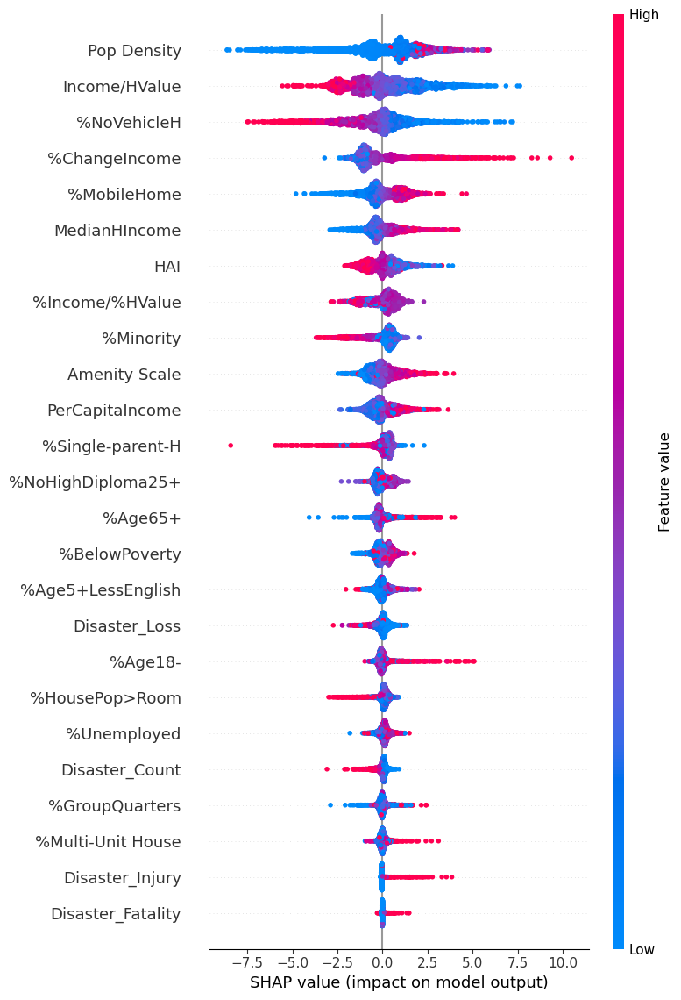

<Figure size 640x480 with 0 Axes>

In [297]:
explainer = shap.Explainer(automl.model.predict, X)
shap_values = explainer(X)

shap_df_flood = pd.DataFrame(shap_values.values, columns=X.columns)
shap_df_flood["FIPS"] = fips_series.values

shap.summary_plot(shap_values, X,max_display=30)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Flood_all_0819.png', dpi=600, bbox_inches='tight')

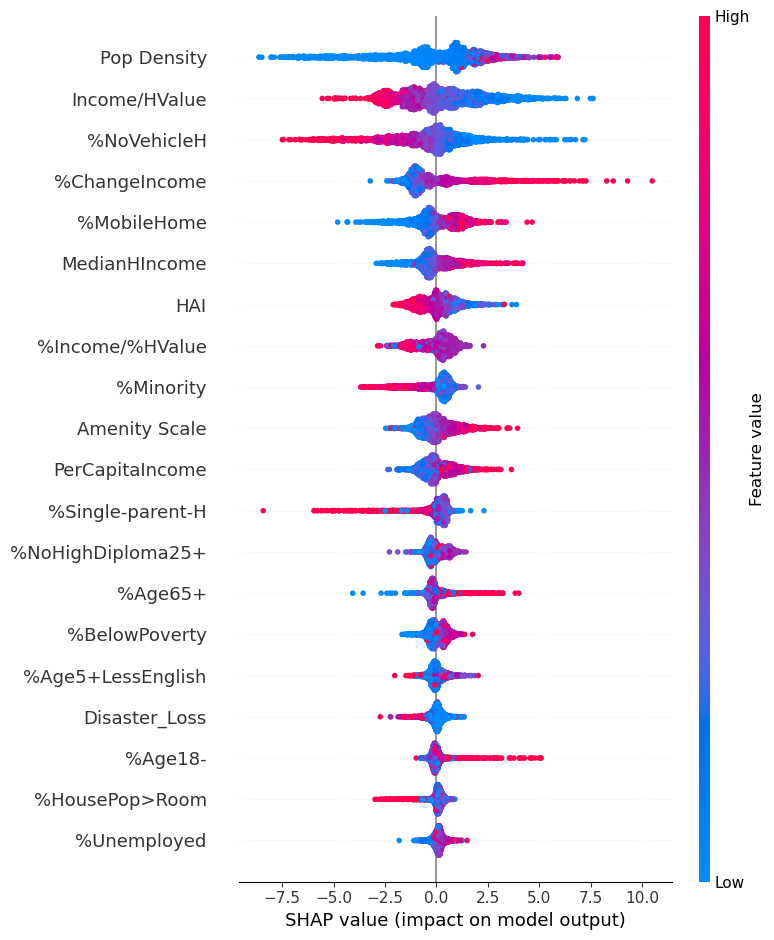

<Figure size 640x480 with 0 Axes>

In [298]:
shap.summary_plot(shap_values, X,max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Flood_0819.png', dpi=600, bbox_inches='tight')

Top 10 important features: ['Pop Density', 'Income/HValue', '%NoVehicleH', '%ChangeIncome', '%MobileHome', 'MedianHIncome', 'HAI', '%Income/%HValue', '%Minority', 'Amenity Scale']


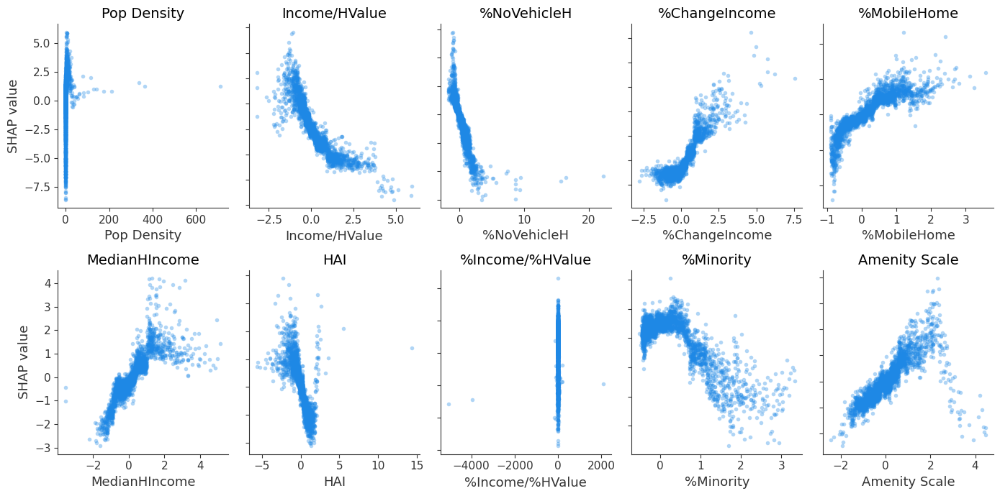

In [299]:
importance = np.abs(shap_values.values).mean(axis=0)
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance})
top_features = importance_df.sort_values(by='importance', ascending=False).head(10)['feature'].tolist()

print("Top 10 important features:", top_features)

fig, axes = plt.subplots(2, 5, figsize=(14,7))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
    if i not in [0, 5]:  
        axes[i].set_ylabel("")
        axes[i].set_yticklabels([])
    else:
        axes[i].set_ylabel("SHAP value")
    axes[i].set_title(feature, fontsize=14)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
plt.savefig(r"F:\LongMig2025\results\maps\automl\dependece_flood_0819.png", dpi=600, bbox_inches='tight')
plt.show()

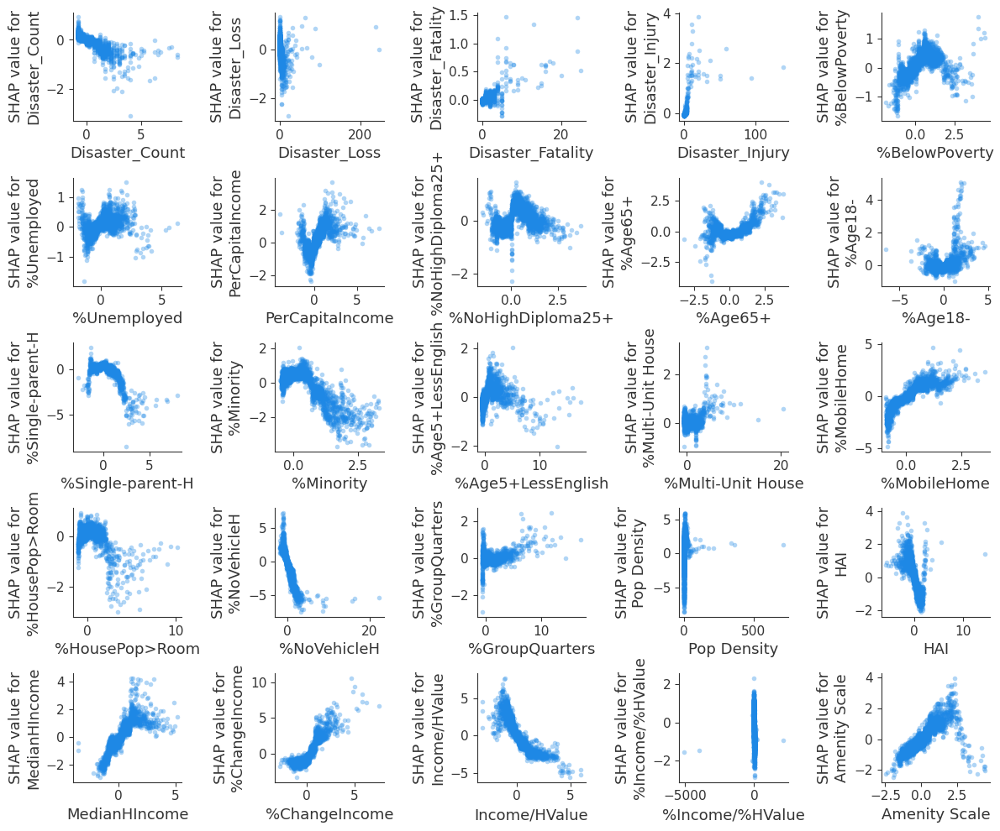

In [300]:
# Get all feature names
all_features = X.columns.tolist()

# Grid layout setup
num_features = len(all_features)
cols = 5
rows = (num_features + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12,10))
axes = axes.flatten()

# Loop through each feature to create a SHAP dependence plot in its subplot
for i, feature in enumerate(all_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
#     axes[i].set_title(f"{feature}", fontsize=10)
# Hide any unused subplot areas
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")

# Final layout and output
plt.tight_layout()
plt.show()

## Wildfire

### Without Disaster

In [374]:
Wildfire_Regression_data_used["FIPS"]  = Wildfire_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Wildfire_Regression_data_used["FIPS"]

# Prepare features and target
X = Wildfire_Regression_data_used.drop(columns=["FIPS", "NMR","Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury"])
y = Wildfire_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 23:24:46] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 23:24:46] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 23:24:46] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 23:24:46] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 23:24:46] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 23:24:47] {2393} INFO - Estimated sufficient time budget=5207s. Estimated necessary time budget=28s.
[flaml.automl.logger: 09-01 23:24:47] {2442} INFO -  at 0.6s,	estimator xgboost's best error=8.2706,	best estimator xgboost's best error=8.2706
[flaml.automl.logger: 09-01 23:24:47] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 23:24:47] {2442} INFO -  at 0.9s,	estimator lgbm's best error=8.2552,	best estimator lgbm's best error=8.2552
[flaml.automl.logger:

[flaml.automl.logger: 09-01 23:24:58] {2442} INFO -  at 11.6s,	estimator rf's best error=7.1525,	best estimator histgb's best error=5.8514
[flaml.automl.logger: 09-01 23:24:58] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 23:24:58] {2442} INFO -  at 11.8s,	estimator histgb's best error=5.8514,	best estimator histgb's best error=5.8514
[flaml.automl.logger: 09-01 23:24:58] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-01 23:24:59] {2442} INFO -  at 12.8s,	estimator rf's best error=6.6657,	best estimator histgb's best error=5.8514
[flaml.automl.logger: 09-01 23:24:59] {2258} INFO - iteration 36, current learner lgbm
[flaml.automl.logger: 09-01 23:24:59] {2442} INFO -  at 13.3s,	estimator lgbm's best error=6.4787,	best estimator histgb's best error=5.8514
[flaml.automl.logger: 09-01 23:24:59] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 23:25:00] {2442} INFO -  at 13.5s,	estimator histgb's best e

[flaml.automl.logger: 09-01 23:25:13] {2258} INFO - iteration 69, current learner xgboost
[flaml.automl.logger: 09-01 23:25:13] {2442} INFO -  at 27.0s,	estimator xgboost's best error=6.6733,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:13] {2258} INFO - iteration 70, current learner histgb
[flaml.automl.logger: 09-01 23:25:13] {2442} INFO -  at 27.1s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:13] {2258} INFO - iteration 71, current learner histgb
[flaml.automl.logger: 09-01 23:25:14] {2442} INFO -  at 27.7s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:14] {2258} INFO - iteration 72, current learner histgb
[flaml.automl.logger: 09-01 23:25:14] {2442} INFO -  at 27.9s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:14] {2258} INFO - iteration 73, curr

[flaml.automl.logger: 09-01 23:25:51] {2442} INFO -  at 65.2s,	estimator xgboost's best error=6.6733,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:51] {2258} INFO - iteration 105, current learner histgb
[flaml.automl.logger: 09-01 23:25:52] {2442} INFO -  at 65.4s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:52] {2258} INFO - iteration 106, current learner rf
[flaml.automl.logger: 09-01 23:25:53] {2442} INFO -  at 66.7s,	estimator rf's best error=6.1308,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:53] {2258} INFO - iteration 107, current learner lgbm
[flaml.automl.logger: 09-01 23:25:54] {2442} INFO -  at 67.5s,	estimator lgbm's best error=6.3685,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:25:54] {2258} INFO - iteration 108, current learner histgb
[flaml.automl.logger: 09-01 23:25:54] {2442} INFO -  at 68.0s,	estimator histgb

[flaml.automl.logger: 09-01 23:26:32] {2258} INFO - iteration 140, current learner histgb
[flaml.automl.logger: 09-01 23:26:32] {2442} INFO -  at 105.8s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:26:32] {2258} INFO - iteration 141, current learner extra_tree
[flaml.automl.logger: 09-01 23:26:33] {2442} INFO -  at 106.6s,	estimator extra_tree's best error=6.1506,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:26:33] {2258} INFO - iteration 142, current learner histgb
[flaml.automl.logger: 09-01 23:26:33] {2442} INFO -  at 107.1s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:26:33] {2258} INFO - iteration 143, current learner extra_tree
[flaml.automl.logger: 09-01 23:26:34] {2442} INFO -  at 108.1s,	estimator extra_tree's best error=6.1506,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:26:34] {2258} INF

[flaml.automl.logger: 09-01 23:27:00] {2258} INFO - iteration 175, current learner histgb
[flaml.automl.logger: 09-01 23:27:01] {2442} INFO -  at 134.5s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:01] {2258} INFO - iteration 176, current learner lgbm
[flaml.automl.logger: 09-01 23:27:02] {2442} INFO -  at 135.7s,	estimator lgbm's best error=5.9102,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:02] {2258} INFO - iteration 177, current learner catboost
[flaml.automl.logger: 09-01 23:27:08] {2442} INFO -  at 141.4s,	estimator catboost's best error=5.9868,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:08] {2258} INFO - iteration 178, current learner histgb
[flaml.automl.logger: 09-01 23:27:08] {2442} INFO -  at 141.9s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:08] {2258} INFO - iteration 17

[flaml.automl.logger: 09-01 23:27:45] {2258} INFO - iteration 210, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:27:46] {2442} INFO -  at 180.0s,	estimator xgb_limitdepth's best error=6.3487,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:46] {2258} INFO - iteration 211, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:27:47] {2442} INFO -  at 181.2s,	estimator xgb_limitdepth's best error=6.3487,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:47] {2258} INFO - iteration 212, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:27:48] {2442} INFO -  at 182.0s,	estimator xgb_limitdepth's best error=6.3487,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:27:48] {2258} INFO - iteration 213, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:27:49] {2442} INFO -  at 182.9s,	estimator xgb_limitdepth's best error=6.3487,	best estimator histgb's best error=5.7081


[flaml.automl.logger: 09-01 23:28:32] {2258} INFO - iteration 245, current learner lgbm
[flaml.automl.logger: 09-01 23:28:33] {2442} INFO -  at 226.8s,	estimator lgbm's best error=5.7850,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:28:33] {2258} INFO - iteration 246, current learner histgb
[flaml.automl.logger: 09-01 23:28:33] {2442} INFO -  at 227.1s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:28:33] {2258} INFO - iteration 247, current learner extra_tree
[flaml.automl.logger: 09-01 23:28:34] {2442} INFO -  at 227.9s,	estimator extra_tree's best error=6.1279,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:28:34] {2258} INFO - iteration 248, current learner histgb
[flaml.automl.logger: 09-01 23:28:34] {2442} INFO -  at 228.3s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:28:34] {2258} INFO - iteratio

[flaml.automl.logger: 09-01 23:29:26] {2258} INFO - iteration 280, current learner lgbm
[flaml.automl.logger: 09-01 23:29:30] {2442} INFO -  at 283.4s,	estimator lgbm's best error=5.7850,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:29:30] {2258} INFO - iteration 281, current learner catboost
[flaml.automl.logger: 09-01 23:29:37] {2442} INFO -  at 290.5s,	estimator catboost's best error=5.9101,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:29:37] {2258} INFO - iteration 282, current learner histgb
[flaml.automl.logger: 09-01 23:29:37] {2442} INFO -  at 290.7s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:29:37] {2258} INFO - iteration 283, current learner xgboost
[flaml.automl.logger: 09-01 23:29:40] {2442} INFO -  at 293.6s,	estimator xgboost's best error=5.8859,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:29:40] {2258} INFO - iteration 

[flaml.automl.logger: 09-01 23:30:26] {2258} INFO - iteration 315, current learner histgb
[flaml.automl.logger: 09-01 23:30:27] {2442} INFO -  at 340.4s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:30:27] {2258} INFO - iteration 316, current learner rf
[flaml.automl.logger: 09-01 23:30:30] {2442} INFO -  at 343.6s,	estimator rf's best error=6.0272,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:30:30] {2258} INFO - iteration 317, current learner histgb
[flaml.automl.logger: 09-01 23:30:30] {2442} INFO -  at 344.0s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:30:30] {2258} INFO - iteration 318, current learner histgb
[flaml.automl.logger: 09-01 23:30:30] {2442} INFO -  at 344.2s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:30:30] {2258} INFO - iteration 319, curre

[flaml.automl.logger: 09-01 23:31:22] {2258} INFO - iteration 350, current learner histgb
[flaml.automl.logger: 09-01 23:31:23] {2442} INFO -  at 396.5s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:31:23] {2258} INFO - iteration 351, current learner xgboost
[flaml.automl.logger: 09-01 23:31:24] {2442} INFO -  at 398.2s,	estimator xgboost's best error=5.8859,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:31:24] {2258} INFO - iteration 352, current learner histgb
[flaml.automl.logger: 09-01 23:31:25] {2442} INFO -  at 398.5s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:31:25] {2258} INFO - iteration 353, current learner histgb
[flaml.automl.logger: 09-01 23:31:25] {2442} INFO -  at 398.7s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:31:25] {2258} INFO - iteration 

[flaml.automl.logger: 09-01 23:32:33] {2442} INFO -  at 466.4s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:32:33] {2258} INFO - iteration 386, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:32:36] {2442} INFO -  at 469.7s,	estimator xgb_limitdepth's best error=6.0890,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:32:36] {2258} INFO - iteration 387, current learner lgbm
[flaml.automl.logger: 09-01 23:32:41] {2442} INFO -  at 474.7s,	estimator lgbm's best error=5.7850,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:32:41] {2258} INFO - iteration 388, current learner histgb
[flaml.automl.logger: 09-01 23:32:41] {2442} INFO -  at 474.9s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:32:41] {2258} INFO - iteration 389, current learner catboost
[flaml.automl.logger: 09-01 23:32:47] {2442} INFO 

[flaml.automl.logger: 09-01 23:33:45] {2258} INFO - iteration 421, current learner histgb
[flaml.automl.logger: 09-01 23:33:45] {2442} INFO -  at 538.8s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:33:45] {2258} INFO - iteration 422, current learner lgbm
[flaml.automl.logger: 09-01 23:33:47] {2442} INFO -  at 541.3s,	estimator lgbm's best error=5.7850,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:33:47] {2258} INFO - iteration 423, current learner histgb
[flaml.automl.logger: 09-01 23:33:48] {2442} INFO -  at 541.5s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:33:48] {2258} INFO - iteration 424, current learner lgbm
[flaml.automl.logger: 09-01 23:33:49] {2442} INFO -  at 543.2s,	estimator lgbm's best error=5.7850,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:33:49] {2258} INFO - iteration 425, curre

[flaml.automl.logger: 09-01 23:34:45] {2442} INFO -  at 599.1s,	estimator rf's best error=5.9548,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:34:45] {2258} INFO - iteration 457, current learner histgb
[flaml.automl.logger: 09-01 23:34:46] {2442} INFO -  at 599.4s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:34:46] {2258} INFO - iteration 458, current learner histgb
[flaml.automl.logger: 09-01 23:34:46] {2442} INFO -  at 599.7s,	estimator histgb's best error=5.7081,	best estimator histgb's best error=5.7081
[flaml.automl.logger: 09-01 23:34:46] {2685} INFO - retrain histgb for 0.0s
[flaml.automl.logger: 09-01 23:34:46] {2688} INFO - retrained model: HistGradientBoostingRegressor(l2_regularization=1.5640775052557627,
                              learning_rate=0.1242226940535355, max_iter=45,
                              max_leaf_nodes=9, min_samples_leaf=8,
                              rand

In [375]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: histgb
Best config: {'n_estimators': 45, 'max_leaves': 9, 'min_samples_leaf': 8, 'learning_rate': 0.1242226940535355, 'log_max_bin': 8, 'l2_regularization': 1.5640775052557627, 'max_iter': 45}
Best validation loss: 5.7081101553358335
Best Model Performance:
RMSE = 6.6081, MAE = 4.8039, ME = 0.1727, R² = 0.5624


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [376]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,6.406056,-0.248709,4.705134,0.588703
0,xgboost,6.622305,-0.133880,5.040099,0.560466
1,xgb_limitdepth,6.624778,-0.036741,4.920112,0.560137
5,histgb,6.705676,-0.113139,5.040368,0.549329
2,rf,6.735185,-0.348817,4.979057,0.545354
4,lgbm,6.881131,-0.712594,5.136840,0.525437
3,extra_tree,7.080203,0.093341,5.182793,0.497581


In [377]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,5.910143,0.563579,4.323320,0.269827,-0.049069,0.764557,0.602798,0.069492,5.932835,4.324144,-0.049004,0.610986
0,xgboost,5.931505,0.591470,4.326127,0.407563,-0.018964,0.584944,0.603771,0.043903,5.956350,4.327267,-0.018818,0.607896
5,histgb,5.933101,0.516466,4.396692,0.362456,-0.030039,0.589024,0.600644,0.062146,5.952526,4.397871,-0.030191,0.608400
1,xgb_limitdepth,6.100492,0.449875,4.489417,0.296049,-0.108776,0.627433,0.573936,0.087368,6.114723,4.490206,-0.108644,0.586768
2,rf,6.110169,0.521135,4.478101,0.320750,-0.270815,0.645318,0.577422,0.058334,6.129145,4.478961,-0.270787,0.584816
4,lgbm,6.140497,0.451803,4.485991,0.378738,-0.048469,0.875317,0.571446,0.067906,6.155191,4.487183,-0.049685,0.581280
3,extra_tree,6.410453,0.469764,4.757366,0.241408,-0.285313,0.779835,0.534060,0.064598,6.425448,4.758136,-0.284701,0.543703


### With disaster

In [378]:
Wildfire_Regression_data_used["FIPS"]  = Wildfire_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Wildfire_Regression_data_used["FIPS"]

# Prepare features and target
X = Wildfire_Regression_data_used.drop(columns=["FIPS", "NMR"])
y = Wildfire_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 23:36:21] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 23:36:21] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 23:36:21] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 23:36:21] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 23:36:21] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 23:36:22] {2393} INFO - Estimated sufficient time budget=4284s. Estimated necessary time budget=23s.
[flaml.automl.logger: 09-01 23:36:22] {2442} INFO -  at 0.5s,	estimator xgboost's best error=8.2706,	best estimator xgboost's best error=8.2706
[flaml.automl.logger: 09-01 23:36:22] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 23:36:22] {2442} INFO -  at 0.8s,	estimator lgbm's best error=8.2552,	best estimator lgbm's best error=8.2552
[flaml.automl.logger:

[flaml.automl.logger: 09-01 23:36:32] {2442} INFO -  at 11.1s,	estimator xgboost's best error=6.6560,	best estimator histgb's best error=5.8765
[flaml.automl.logger: 09-01 23:36:32] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 23:36:32] {2442} INFO -  at 11.3s,	estimator histgb's best error=5.8765,	best estimator histgb's best error=5.8765
[flaml.automl.logger: 09-01 23:36:32] {2258} INFO - iteration 35, current learner xgboost
[flaml.automl.logger: 09-01 23:36:33] {2442} INFO -  at 11.8s,	estimator xgboost's best error=6.6560,	best estimator histgb's best error=5.8765
[flaml.automl.logger: 09-01 23:36:33] {2258} INFO - iteration 36, current learner lgbm
[flaml.automl.logger: 09-01 23:36:33] {2442} INFO -  at 12.2s,	estimator lgbm's best error=6.4787,	best estimator histgb's best error=5.8765
[flaml.automl.logger: 09-01 23:36:33] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 23:36:34] {2442} INFO -  at 12.5s,	estimator 

[flaml.automl.logger: 09-01 23:36:57] {2258} INFO - iteration 69, current learner histgb
[flaml.automl.logger: 09-01 23:36:57] {2442} INFO -  at 36.1s,	estimator histgb's best error=5.8556,	best estimator histgb's best error=5.8556
[flaml.automl.logger: 09-01 23:36:57] {2258} INFO - iteration 70, current learner xgboost
[flaml.automl.logger: 09-01 23:36:58] {2442} INFO -  at 37.3s,	estimator xgboost's best error=6.1942,	best estimator histgb's best error=5.8556
[flaml.automl.logger: 09-01 23:36:58] {2258} INFO - iteration 71, current learner histgb
[flaml.automl.logger: 09-01 23:36:59] {2442} INFO -  at 37.5s,	estimator histgb's best error=5.8556,	best estimator histgb's best error=5.8556
[flaml.automl.logger: 09-01 23:36:59] {2258} INFO - iteration 72, current learner histgb
[flaml.automl.logger: 09-01 23:36:59] {2442} INFO -  at 37.8s,	estimator histgb's best error=5.8556,	best estimator histgb's best error=5.8556
[flaml.automl.logger: 09-01 23:36:59] {2258} INFO - iteration 73, curr

[flaml.automl.logger: 09-01 23:37:48] {2442} INFO -  at 87.0s,	estimator xgboost's best error=6.1593,	best estimator histgb's best error=5.7180
[flaml.automl.logger: 09-01 23:37:48] {2258} INFO - iteration 105, current learner histgb
[flaml.automl.logger: 09-01 23:37:48] {2442} INFO -  at 87.3s,	estimator histgb's best error=5.7180,	best estimator histgb's best error=5.7180
[flaml.automl.logger: 09-01 23:37:48] {2258} INFO - iteration 106, current learner histgb
[flaml.automl.logger: 09-01 23:37:49] {2442} INFO -  at 87.6s,	estimator histgb's best error=5.7180,	best estimator histgb's best error=5.7180
[flaml.automl.logger: 09-01 23:37:49] {2258} INFO - iteration 107, current learner histgb
[flaml.automl.logger: 09-01 23:37:49] {2442} INFO -  at 88.1s,	estimator histgb's best error=5.7180,	best estimator histgb's best error=5.7180
[flaml.automl.logger: 09-01 23:37:49] {2258} INFO - iteration 108, current learner histgb
[flaml.automl.logger: 09-01 23:37:49] {2442} INFO -  at 88.3s,	esti

[flaml.automl.logger: 09-01 23:38:20] {2258} INFO - iteration 140, current learner histgb
[flaml.automl.logger: 09-01 23:38:20] {2442} INFO -  at 119.1s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:38:20] {2258} INFO - iteration 141, current learner xgboost
[flaml.automl.logger: 09-01 23:38:23] {2442} INFO -  at 121.8s,	estimator xgboost's best error=5.8324,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:38:23] {2258} INFO - iteration 142, current learner histgb
[flaml.automl.logger: 09-01 23:38:23] {2442} INFO -  at 122.0s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:38:23] {2258} INFO - iteration 143, current learner histgb
[flaml.automl.logger: 09-01 23:38:24] {2442} INFO -  at 122.5s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:38:24] {2258} INFO - iteration 

[flaml.automl.logger: 09-01 23:39:02] {2442} INFO -  at 160.7s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:02] {2258} INFO - iteration 176, current learner histgb
[flaml.automl.logger: 09-01 23:39:02] {2442} INFO -  at 160.9s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:02] {2258} INFO - iteration 177, current learner catboost
[flaml.automl.logger: 09-01 23:39:12] {2442} INFO -  at 170.8s,	estimator catboost's best error=5.9710,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:12] {2258} INFO - iteration 178, current learner histgb
[flaml.automl.logger: 09-01 23:39:12] {2442} INFO -  at 171.0s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:12] {2258} INFO - iteration 179, current learner histgb
[flaml.automl.logger: 09-01 23:39:13] {2442} INFO -  at 171.

[flaml.automl.logger: 09-01 23:39:48] {2442} INFO -  at 206.7s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:48] {2258} INFO - iteration 211, current learner histgb
[flaml.automl.logger: 09-01 23:39:48] {2442} INFO -  at 206.9s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:48] {2258} INFO - iteration 212, current learner histgb
[flaml.automl.logger: 09-01 23:39:48] {2442} INFO -  at 207.0s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:48] {2258} INFO - iteration 213, current learner histgb
[flaml.automl.logger: 09-01 23:39:48] {2442} INFO -  at 207.2s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:39:48] {2258} INFO - iteration 214, current learner histgb
[flaml.automl.logger: 09-01 23:39:49] {2442} INFO -  at 207.4s,	

[flaml.automl.logger: 09-01 23:40:55] {2258} INFO - iteration 245, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:40:56] {2442} INFO -  at 275.3s,	estimator xgb_limitdepth's best error=6.4611,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:40:56] {2258} INFO - iteration 246, current learner histgb
[flaml.automl.logger: 09-01 23:40:57] {2442} INFO -  at 275.5s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:40:57] {2258} INFO - iteration 247, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:40:58] {2442} INFO -  at 276.4s,	estimator xgb_limitdepth's best error=6.3312,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:40:58] {2258} INFO - iteration 248, current learner histgb
[flaml.automl.logger: 09-01 23:40:58] {2442} INFO -  at 276.6s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:4

[flaml.automl.logger: 09-01 23:41:38] {2258} INFO - iteration 280, current learner histgb
[flaml.automl.logger: 09-01 23:41:38] {2442} INFO -  at 317.2s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:41:38] {2258} INFO - iteration 281, current learner catboost
[flaml.automl.logger: 09-01 23:41:51] {2442} INFO -  at 329.4s,	estimator catboost's best error=5.8537,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:41:51] {2258} INFO - iteration 282, current learner histgb
[flaml.automl.logger: 09-01 23:41:51] {2442} INFO -  at 329.7s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:41:51] {2258} INFO - iteration 283, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:41:52] {2442} INFO -  at 330.9s,	estimator xgb_limitdepth's best error=6.1847,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:41:52] {2258}

[flaml.automl.logger: 09-01 23:42:16] {2258} INFO - iteration 315, current learner histgb
[flaml.automl.logger: 09-01 23:42:16] {2442} INFO -  at 354.9s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:16] {2258} INFO - iteration 316, current learner extra_tree
[flaml.automl.logger: 09-01 23:42:17] {2442} INFO -  at 355.9s,	estimator extra_tree's best error=6.1853,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:17] {2258} INFO - iteration 317, current learner histgb
[flaml.automl.logger: 09-01 23:42:17] {2442} INFO -  at 356.2s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:17] {2258} INFO - iteration 318, current learner histgb
[flaml.automl.logger: 09-01 23:42:18] {2442} INFO -  at 356.4s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:18] {2258} INFO - iter

[flaml.automl.logger: 09-01 23:42:48] {2442} INFO -  at 386.7s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:48] {2258} INFO - iteration 350, current learner histgb
[flaml.automl.logger: 09-01 23:42:48] {2442} INFO -  at 387.0s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:48] {2258} INFO - iteration 351, current learner extra_tree
[flaml.automl.logger: 09-01 23:42:49] {2442} INFO -  at 387.5s,	estimator extra_tree's best error=5.9308,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:49] {2258} INFO - iteration 352, current learner histgb
[flaml.automl.logger: 09-01 23:42:49] {2442} INFO -  at 387.7s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:42:49] {2258} INFO - iteration 353, current learner histgb
[flaml.automl.logger: 09-01 23:42:49] {2442} INFO -  at 

[flaml.automl.logger: 09-01 23:43:46] {2258} INFO - iteration 384, current learner histgb
[flaml.automl.logger: 09-01 23:43:46] {2442} INFO -  at 444.6s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:43:46] {2258} INFO - iteration 385, current learner histgb
[flaml.automl.logger: 09-01 23:43:46] {2442} INFO -  at 444.8s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:43:46] {2258} INFO - iteration 386, current learner extra_tree
[flaml.automl.logger: 09-01 23:43:47] {2442} INFO -  at 445.7s,	estimator extra_tree's best error=5.9308,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:43:47] {2258} INFO - iteration 387, current learner extra_tree
[flaml.automl.logger: 09-01 23:43:48] {2442} INFO -  at 446.6s,	estimator extra_tree's best error=5.9308,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:43:48] {2258} INF

[flaml.automl.logger: 09-01 23:44:38] {2258} INFO - iteration 419, current learner histgb
[flaml.automl.logger: 09-01 23:44:38] {2442} INFO -  at 497.1s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:44:38] {2258} INFO - iteration 420, current learner histgb
[flaml.automl.logger: 09-01 23:44:39] {2442} INFO -  at 497.4s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:44:39] {2258} INFO - iteration 421, current learner histgb
[flaml.automl.logger: 09-01 23:44:39] {2442} INFO -  at 497.5s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:44:39] {2258} INFO - iteration 422, current learner extra_tree
[flaml.automl.logger: 09-01 23:44:40] {2442} INFO -  at 498.7s,	estimator extra_tree's best error=5.9308,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:44:40] {2258} INFO - iter

[flaml.automl.logger: 09-01 23:45:34] {2258} INFO - iteration 454, current learner histgb
[flaml.automl.logger: 09-01 23:45:34] {2442} INFO -  at 553.2s,	estimator histgb's best error=5.7166,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:45:34] {2258} INFO - iteration 455, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:45:38] {2442} INFO -  at 557.2s,	estimator xgb_limitdepth's best error=5.9725,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:45:38] {2258} INFO - iteration 456, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:45:41] {2442} INFO -  at 559.7s,	estimator xgb_limitdepth's best error=5.9725,	best estimator histgb's best error=5.7166
[flaml.automl.logger: 09-01 23:45:41] {2258} INFO - iteration 457, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:45:49] {2442} INFO -  at 567.6s,	estimator xgb_limitdepth's best error=5.9725,	best estimator histgb's best error=5.7166
[flaml.automl.lo

In [379]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: histgb
Best config: {'n_estimators': 30, 'max_leaves': 7, 'min_samples_leaf': 4, 'learning_rate': 0.22142677113815679, 'log_max_bin': 8, 'l2_regularization': 2.4372069410275166, 'max_iter': 30}
Best validation loss: 5.7166055881117845
Best Model Performance:
RMSE = 6.6651, MAE = 4.8573, ME = -0.4124, R² = 0.5548


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [380]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
0,xgboost,6.309529,-0.207896,4.644455,0.601004
6,catboost,6.471428,-0.184619,4.751319,0.580266
1,xgb_limitdepth,6.617332,-0.218562,4.880985,0.561126
5,histgb,6.663747,-0.196138,5.109188,0.554947
4,lgbm,6.731534,-0.185982,5.095459,0.545847
2,rf,6.764322,-0.284025,5.000697,0.541412
3,extra_tree,7.132119,-0.236916,5.184906,0.490186


In [381]:
y_pred = automl.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
me = np.mean(y_test - y_pred)
r2 = r2_score(y_test, y_pred)
print("✅ Best Model Performance on Test Set")
print(f"Best Model: {automl.best_estimator}")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"ME (Mean Error): {me:.4f}")


✅ Best Model Performance on Test Set
Best Model: histgb
R² Score: 0.5548
RMSE: 6.6651
MAE: 4.8573
ME (Mean Error): -0.4124


In [382]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,5.865559,0.450115,4.302974,0.355193,-0.074890,0.789681,0.611964,0.034967,5.880408,4.303633,-0.074940,0.617831
1,xgb_limitdepth,5.974187,0.566562,4.367553,0.423223,-0.150506,0.609445,0.594693,0.069895,5.997054,4.368791,-0.150862,0.602519
0,xgboost,6.024786,0.434597,4.392060,0.226688,-0.014825,0.663851,0.587557,0.063982,6.038058,4.392606,-0.014852,0.597065
5,histgb,6.053594,0.559192,4.446217,0.418171,-0.127473,0.629960,0.584944,0.061821,6.075353,4.447432,-0.127598,0.592072
2,rf,6.110604,0.510671,4.488242,0.359417,-0.288773,0.671386,0.576773,0.061653,6.128952,4.489283,-0.288797,0.584843
4,lgbm,6.146924,0.511270,4.511342,0.371020,-0.082517,0.579839,0.573385,0.046917,6.164998,4.512412,-0.082707,0.579945
3,extra_tree,6.485326,0.604155,4.746263,0.344545,-0.240196,0.723692,0.526027,0.049637,6.508958,4.747041,-0.240218,0.531766


PermutationExplainer explainer: 547it [00:40, 10.17it/s]                                                               


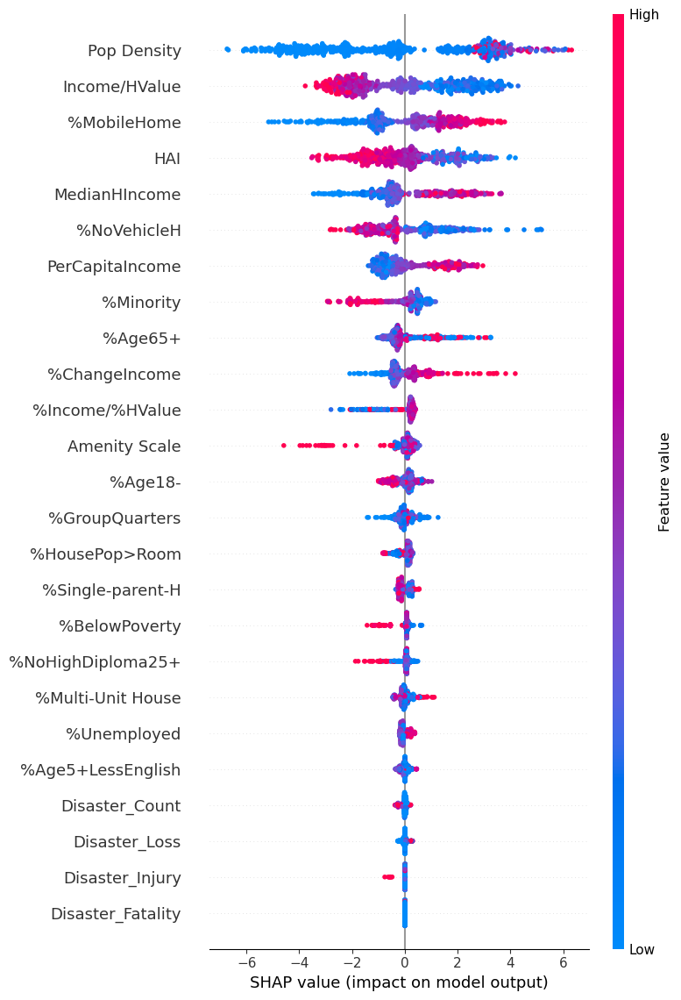

<Figure size 640x480 with 0 Axes>

In [308]:
explainer = shap.Explainer(automl.model.predict, X)
shap_values = explainer(X)

shap_df_wildfire = pd.DataFrame(shap_values.values, columns=X.columns)
shap_df_wildfire["FIPS"] = fips_series.values

shap.summary_plot(shap_values, X,max_display=30)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Wildfire_all_0819.png', dpi=600, bbox_inches='tight')

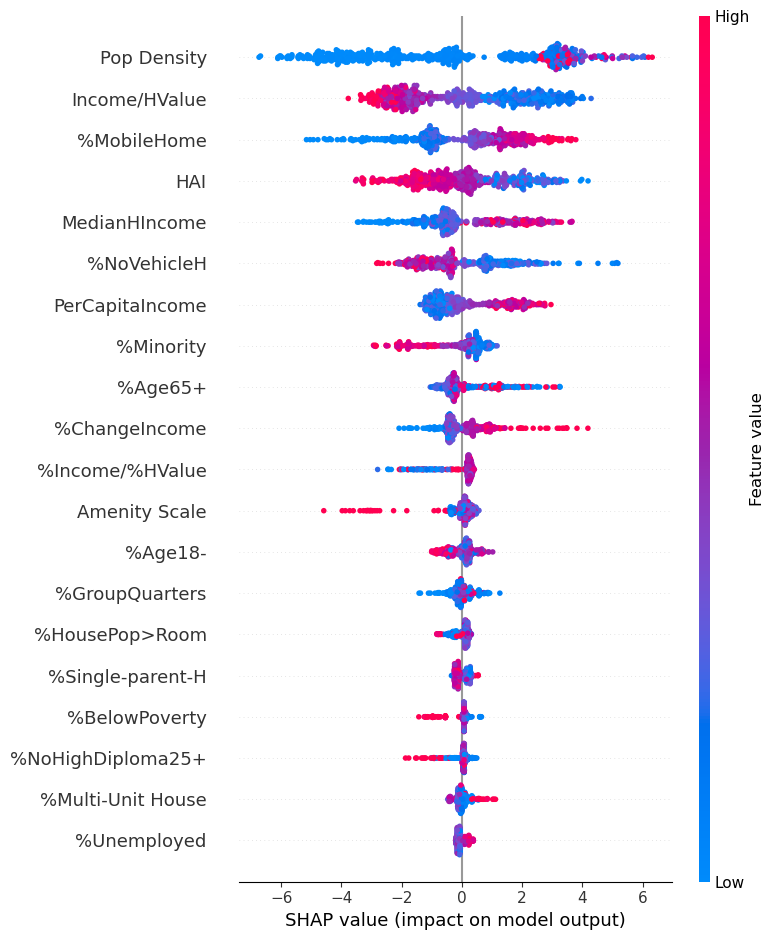

<Figure size 640x480 with 0 Axes>

In [309]:
shap.summary_plot(shap_values, X,max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Wildfire_0819.png', dpi=600, bbox_inches='tight')

Top 10 important features: ['Pop Density', 'Income/HValue', '%MobileHome', 'HAI', 'MedianHIncome', '%NoVehicleH', 'PerCapitaIncome', '%Minority', '%Age65+', '%ChangeIncome']


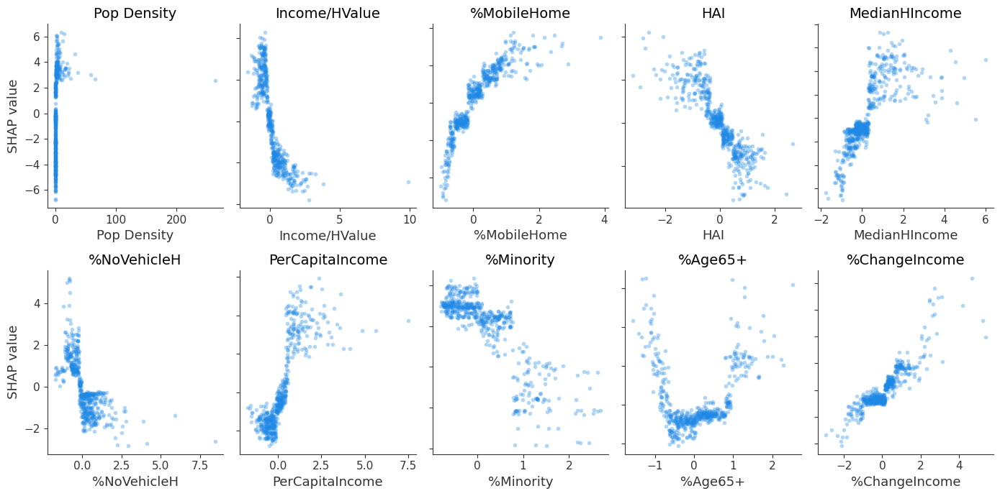

In [310]:
importance = np.abs(shap_values.values).mean(axis=0)
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance})
top_features = importance_df.sort_values(by='importance', ascending=False).head(10)['feature'].tolist()

print("Top 10 important features:", top_features)

fig, axes = plt.subplots(2, 5, figsize=(14,7))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
    if i not in [0, 5]:  
        axes[i].set_ylabel("")
        axes[i].set_yticklabels([])
    else:
        axes[i].set_ylabel("SHAP value")
    axes[i].set_title(feature, fontsize=14)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
plt.savefig(r"F:\LongMig2025\results\maps\automl\dependece_wildfire_0819.png", dpi=600, bbox_inches='tight')
plt.show()

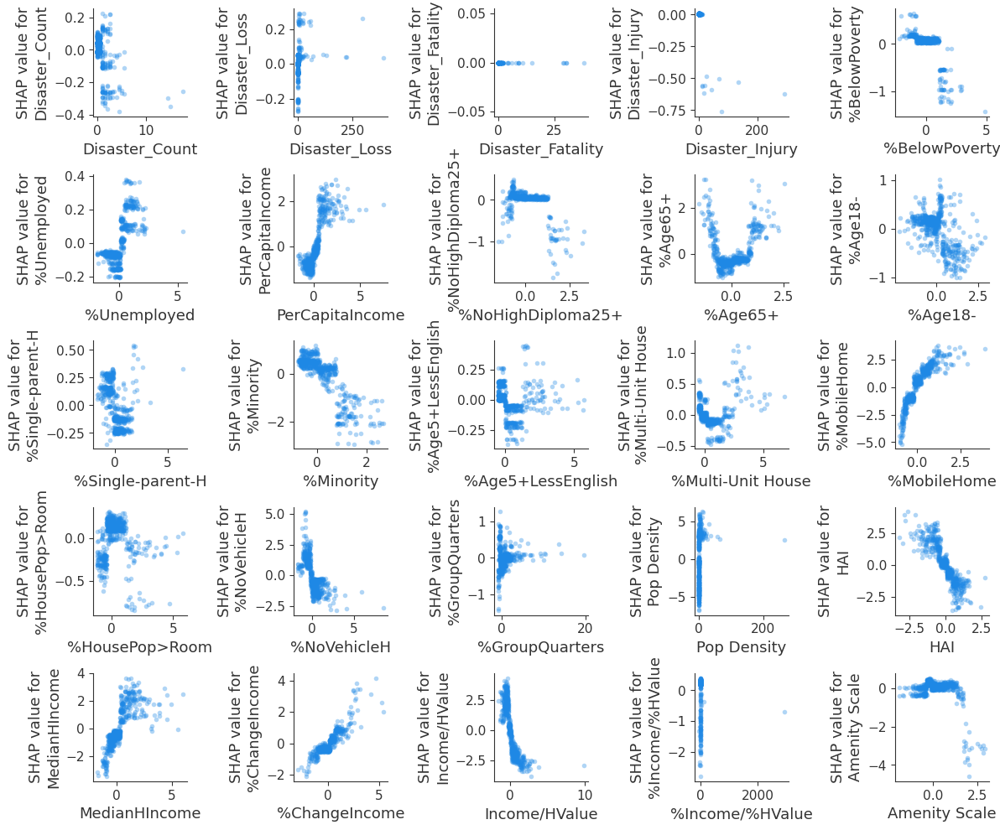

In [311]:
# Get all feature names
all_features = X.columns.tolist()

# Grid layout setup
num_features = len(all_features)
cols = 5
rows = (num_features + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12,10))
axes = axes.flatten()

# Loop through each feature to create a SHAP dependence plot in its subplot
for i, feature in enumerate(all_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
#     axes[i].set_title(f"{feature}", fontsize=10)
# Hide any unused subplot areas
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")

# Final layout and output
plt.tight_layout()
plt.show()

## Tornado

### Without disaster

In [383]:
Tornado_Regression_data_used["FIPS"]  = Tornado_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Tornado_Regression_data_used["FIPS"]


# Prepare features and target
X = Tornado_Regression_data_used.drop(columns=["FIPS", "NMR","Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury"])
y = Tornado_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-01 23:47:56] {1728} INFO - task = regression
[flaml.automl.logger: 09-01 23:47:56] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-01 23:47:56] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-01 23:47:56] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-01 23:47:56] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-01 23:47:56] {2393} INFO - Estimated sufficient time budget=4490s. Estimated necessary time budget=24s.
[flaml.automl.logger: 09-01 23:47:56] {2442} INFO -  at 0.5s,	estimator xgboost's best error=7.4201,	best estimator xgboost's best error=7.4201
[flaml.automl.logger: 09-01 23:47:56] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-01 23:47:56] {2442} INFO -  at 0.8s,	estimator lgbm's best error=7.4141,	best estimator lgbm's best error=7.4141
[flaml.automl.logger:

[flaml.automl.logger: 09-01 23:48:12] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-01 23:48:15] {2442} INFO -  at 19.8s,	estimator histgb's best error=4.7781,	best estimator histgb's best error=4.7781
[flaml.automl.logger: 09-01 23:48:15] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-01 23:48:17] {2442} INFO -  at 21.5s,	estimator rf's best error=5.3395,	best estimator histgb's best error=4.7781
[flaml.automl.logger: 09-01 23:48:17] {2258} INFO - iteration 36, current learner histgb
[flaml.automl.logger: 09-01 23:48:18] {2442} INFO -  at 22.2s,	estimator histgb's best error=4.7781,	best estimator histgb's best error=4.7781
[flaml.automl.logger: 09-01 23:48:18] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-01 23:48:23] {2442} INFO -  at 27.3s,	estimator histgb's best error=4.7604,	best estimator histgb's best error=4.7604
[flaml.automl.logger: 09-01 23:48:23] {2258} INFO - iteration 38, current learne

[flaml.automl.logger: 09-01 23:49:55] {2442} INFO -  at 119.1s,	estimator rf's best error=5.0311,	best estimator histgb's best error=4.6593
[flaml.automl.logger: 09-01 23:49:55] {2258} INFO - iteration 70, current learner xgboost
[flaml.automl.logger: 09-01 23:49:55] {2442} INFO -  at 119.8s,	estimator xgboost's best error=5.0764,	best estimator histgb's best error=4.6593
[flaml.automl.logger: 09-01 23:49:55] {2258} INFO - iteration 71, current learner lgbm
[flaml.automl.logger: 09-01 23:49:56] {2442} INFO -  at 120.8s,	estimator lgbm's best error=5.2890,	best estimator histgb's best error=4.6593
[flaml.automl.logger: 09-01 23:49:56] {2258} INFO - iteration 72, current learner lgbm
[flaml.automl.logger: 09-01 23:49:57] {2442} INFO -  at 121.3s,	estimator lgbm's best error=5.2890,	best estimator histgb's best error=4.6593
[flaml.automl.logger: 09-01 23:49:57] {2258} INFO - iteration 73, current learner lgbm
[flaml.automl.logger: 09-01 23:49:59] {2442} INFO -  at 123.7s,	estimator lgbm's

[flaml.automl.logger: 09-01 23:51:31] {2442} INFO -  at 215.1s,	estimator xgb_limitdepth's best error=5.0569,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:51:31] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-01 23:51:33] {2442} INFO -  at 217.0s,	estimator xgboost's best error=5.0238,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:51:33] {2258} INFO - iteration 106, current learner rf
[flaml.automl.logger: 09-01 23:51:34] {2442} INFO -  at 218.4s,	estimator rf's best error=4.9330,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:51:34] {2258} INFO - iteration 107, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:51:35] {2442} INFO -  at 219.8s,	estimator xgb_limitdepth's best error=4.9090,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:51:35] {2258} INFO - iteration 108, current learner extra_tree
[flaml.automl.logger: 09-01 23:51:36] {244

[flaml.automl.logger: 09-01 23:53:31] {2258} INFO - iteration 139, current learner rf
[flaml.automl.logger: 09-01 23:53:33] {2442} INFO -  at 337.7s,	estimator rf's best error=4.8394,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:53:33] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-01 23:53:35] {2442} INFO -  at 339.1s,	estimator xgboost's best error=4.7776,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:53:35] {2258} INFO - iteration 141, current learner histgb
[flaml.automl.logger: 09-01 23:53:39] {2442} INFO -  at 343.3s,	estimator histgb's best error=4.6209,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:53:39] {2258} INFO - iteration 142, current learner xgb_limitdepth
[flaml.automl.logger: 09-01 23:53:41] {2442} INFO -  at 345.5s,	estimator xgb_limitdepth's best error=4.9090,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:53:41] {2258} INFO - it

[flaml.automl.logger: 09-01 23:57:02] {2258} INFO - iteration 174, current learner extra_tree
[flaml.automl.logger: 09-01 23:57:04] {2442} INFO -  at 548.7s,	estimator extra_tree's best error=4.7844,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:57:04] {2258} INFO - iteration 175, current learner extra_tree
[flaml.automl.logger: 09-01 23:57:07] {2442} INFO -  at 551.5s,	estimator extra_tree's best error=4.7844,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:57:07] {2258} INFO - iteration 176, current learner extra_tree
[flaml.automl.logger: 09-01 23:57:10] {2442} INFO -  at 554.9s,	estimator extra_tree's best error=4.7844,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:57:10] {2258} INFO - iteration 177, current learner rf
[flaml.automl.logger: 09-01 23:57:13] {2442} INFO -  at 557.4s,	estimator rf's best error=4.8116,	best estimator histgb's best error=4.6209
[flaml.automl.logger: 09-01 23:57:13] {2258} INF

In [384]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: histgb
Best config: {'n_estimators': 566, 'max_leaves': 24, 'min_samples_leaf': 4, 'learning_rate': 0.04448369540340245, 'log_max_bin': 8, 'l2_regularization': 0.8347348554911355, 'max_iter': 566}
Best validation loss: 4.620948300272237
Best Model Performance:
RMSE = 5.2186, MAE = 3.5128, ME = 0.2130, R² = 0.6523


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [385]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,5.130089,0.229399,3.331129,0.663968
5,histgb,5.250671,0.146410,3.532350,0.647986
0,xgboost,5.313242,0.125860,3.535080,0.639546
4,lgbm,5.392296,0.259631,3.649968,0.628740
3,extra_tree,5.442091,0.130637,3.642650,0.621852
2,rf,5.501032,0.141944,3.727940,0.613616
1,xgb_limitdepth,5.591406,0.304080,3.766148,0.600817


In [386]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,4.471424,0.507233,3.109245,0.202471,0.025551,0.154549,0.716163,0.033879,4.494381,3.109245,0.025551,0.715188
5,histgb,4.577609,0.561307,3.212882,0.253747,-0.006799,0.143364,0.702479,0.040354,4.605058,3.212882,-0.006799,0.700988
0,xgboost,4.679938,0.507073,3.222718,0.238255,-0.025074,0.245506,0.688764,0.036766,4.701863,3.222718,-0.025074,0.688284
4,lgbm,4.770386,0.590641,3.325391,0.263123,0.010063,0.203553,0.677139,0.042156,4.799549,3.325391,0.010063,0.675197
3,extra_tree,4.803139,0.527730,3.308161,0.247876,-0.077596,0.249705,0.672511,0.035843,4.826277,3.308161,-0.077596,0.671570
2,rf,4.808292,0.547371,3.327120,0.272556,-0.066174,0.281984,0.671561,0.041331,4.833152,3.327120,-0.066174,0.670633
1,xgb_limitdepth,4.867760,0.598648,3.379186,0.337441,-0.050811,0.234879,0.663707,0.044213,4.897121,3.379186,-0.050811,0.661857


### With Disaster

In [387]:
Tornado_Regression_data_used["FIPS"]  = Tornado_Regression_data_used["FIPS"].astype(str).str.rjust(5,"0")
fips_series = Tornado_Regression_data_used["FIPS"]


# Prepare features and target
X = Tornado_Regression_data_used.drop(columns=["FIPS", "NMR"])
y = Tornado_Regression_data_used["NMR"]

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and run FLAML
automl = AutoML()
automl.fit(
    X_train=X_train,
    y_train=y_train,
    task="regression",
    time_budget=600,
    metric="rmse",
    estimator_list=[
        "xgboost", "xgb_limitdepth", "rf", "extra_tree", "lgbm", "histgb", "catboost"
    ]
)

[flaml.automl.logger: 09-02 00:00:37] {1728} INFO - task = regression
[flaml.automl.logger: 09-02 00:00:37] {1739} INFO - Evaluation method: cv
[flaml.automl.logger: 09-02 00:00:37] {1838} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 09-02 00:00:37] {1955} INFO - List of ML learners in AutoML Run: ['xgboost', 'xgb_limitdepth', 'rf', 'extra_tree', 'lgbm', 'histgb', 'catboost']
[flaml.automl.logger: 09-02 00:00:37] {2258} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 09-02 00:00:38] {2393} INFO - Estimated sufficient time budget=4766s. Estimated necessary time budget=26s.
[flaml.automl.logger: 09-02 00:00:38] {2442} INFO -  at 0.5s,	estimator xgboost's best error=7.4201,	best estimator xgboost's best error=7.4201
[flaml.automl.logger: 09-02 00:00:38] {2258} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 09-02 00:00:38] {2442} INFO -  at 0.9s,	estimator lgbm's best error=7.4141,	best estimator lgbm's best error=7.4141
[flaml.automl.logger:

[flaml.automl.logger: 09-02 00:00:56] {2258} INFO - iteration 34, current learner histgb
[flaml.automl.logger: 09-02 00:00:57] {2442} INFO -  at 19.8s,	estimator histgb's best error=4.7560,	best estimator histgb's best error=4.7560
[flaml.automl.logger: 09-02 00:00:57] {2258} INFO - iteration 35, current learner rf
[flaml.automl.logger: 09-02 00:00:58] {2442} INFO -  at 20.9s,	estimator rf's best error=5.3529,	best estimator histgb's best error=4.7560
[flaml.automl.logger: 09-02 00:00:58] {2258} INFO - iteration 36, current learner extra_tree
[flaml.automl.logger: 09-02 00:00:59] {2442} INFO -  at 21.7s,	estimator extra_tree's best error=5.7135,	best estimator histgb's best error=4.7560
[flaml.automl.logger: 09-02 00:00:59] {2258} INFO - iteration 37, current learner histgb
[flaml.automl.logger: 09-02 00:01:04] {2442} INFO -  at 27.2s,	estimator histgb's best error=4.7560,	best estimator histgb's best error=4.7560
[flaml.automl.logger: 09-02 00:01:04] {2258} INFO - iteration 38, curren

[flaml.automl.logger: 09-02 00:02:26] {2442} INFO -  at 108.9s,	estimator xgb_limitdepth's best error=5.0152,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:02:26] {2258} INFO - iteration 69, current learner xgb_limitdepth
[flaml.automl.logger: 09-02 00:02:27] {2442} INFO -  at 109.9s,	estimator xgb_limitdepth's best error=5.0152,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:02:27] {2258} INFO - iteration 70, current learner xgb_limitdepth
[flaml.automl.logger: 09-02 00:02:28] {2442} INFO -  at 110.8s,	estimator xgb_limitdepth's best error=5.0152,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:02:28] {2258} INFO - iteration 71, current learner xgboost
[flaml.automl.logger: 09-02 00:02:30] {2442} INFO -  at 112.6s,	estimator xgboost's best error=5.0290,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:02:30] {2258} INFO - iteration 72, current learner xgb_limitdepth
[flaml.aut

[flaml.automl.logger: 09-02 00:04:30] {2258} INFO - iteration 103, current learner histgb
[flaml.automl.logger: 09-02 00:04:32] {2442} INFO -  at 234.6s,	estimator histgb's best error=4.6699,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:04:32] {2258} INFO - iteration 104, current learner extra_tree
[flaml.automl.logger: 09-02 00:04:33] {2442} INFO -  at 235.8s,	estimator extra_tree's best error=4.9026,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:04:33] {2258} INFO - iteration 105, current learner xgboost
[flaml.automl.logger: 09-02 00:04:33] {2442} INFO -  at 236.5s,	estimator xgboost's best error=5.0290,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:04:33] {2258} INFO - iteration 106, current learner lgbm
[flaml.automl.logger: 09-02 00:04:36] {2442} INFO -  at 238.7s,	estimator lgbm's best error=4.7995,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:04:36] {2258} INFO 

[flaml.automl.logger: 09-02 00:08:18] {2442} INFO -  at 461.4s,	estimator lgbm's best error=4.7995,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:08:18] {2258} INFO - iteration 138, current learner catboost
[flaml.automl.logger: 09-02 00:08:38] {2442} INFO -  at 481.4s,	estimator catboost's best error=4.6337,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:08:38] {2258} INFO - iteration 139, current learner lgbm
[flaml.automl.logger: 09-02 00:08:40] {2442} INFO -  at 482.7s,	estimator lgbm's best error=4.7995,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:08:40] {2258} INFO - iteration 140, current learner xgboost
[flaml.automl.logger: 09-02 00:08:43] {2442} INFO -  at 485.9s,	estimator xgboost's best error=4.7312,	best estimator catboost's best error=4.6337
[flaml.automl.logger: 09-02 00:08:43] {2258} INFO - iteration 141, current learner histgb
[flaml.automl.logger: 09-02 00:09:25] {2442} INFO -  at 

In [388]:
best_model = automl.model
y_pred = best_model.predict(X_test)
print("Best estimator:", automl.best_estimator)
print("Best config:", automl.best_config)
print("Best validation loss:", automl.best_loss)
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)
me = (y_test - y_pred).mean()
r2 = r2_score(y_test, y_pred)

print(f"Best Model Performance:\nRMSE = {rmse:.4f}, MAE = {mae:.4f}, ME = {me:.4f}, R² = {r2:.4f}")

Best estimator: catboost
Best config: {'early_stopping_rounds': 17, 'learning_rate': 0.04148219422445773, 'n_estimators': 8192}
Best validation loss: 4.633705536942443
Best Model Performance:
RMSE = 5.4128, MAE = 3.6721, ME = 0.0820, R² = 0.6259


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [389]:
native_estimators = {
    'xgboost': XGBRegressor,
    'xgb_limitdepth': XGBRegressor,
    'rf': RandomForestRegressor,
    'extra_tree': ExtraTreesRegressor,
    'lgbm': LGBMRegressor,
    'histgb': HistGradientBoostingRegressor,
    'catboost': CatBoostRegressor
}

results = []

for est_name, config in automl.best_config_per_estimator.items():
    try:
        config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v for k, v in config.items()}
        config = config.copy()
        ModelClass = native_estimators[est_name]

        # Remove FLAML internal params
        for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
            config.pop(key, None)

        # Add random_state if available
        try:
            if 'random_state' in ModelClass().get_params():
                config['random_state'] = 42
        except:
            pass

        # Model-specific cleanup
        if est_name in ['rf', 'extra_tree']:
            config.pop('max_leaf_nodes', None)
        if est_name == 'histgb':
            config.pop('n_estimators', None)
        if est_name == 'catboost':
            config['verbose'] = 0
        if est_name == 'xgb_limitdepth':
            config['max_depth'] = config.get('max_depth', 6)

        # Train and predict
        model = ModelClass(**config)
        model.fit(X_train, y_train)
        preds = model.predict(X_test)

        # Evaluate
        rmse = mean_squared_error(y_test, preds, squared=False)
        mae = mean_absolute_error(y_test, preds)
        me = (y_test - preds).mean()
        r2 = r2_score(y_test, preds)

        results.append({
            'estimator': est_name,
            'rmse': rmse,
            'me': me,
            'mae': mae,
            'r2': r2
        })

    except Exception as e:
        print(f"❌ Failed to evaluate {est_name}: {e}")

# Display results
if results:
    results_df = pd.DataFrame(results).sort_values(by="rmse")
    display(results_df)
else:
    print("❗️No models were successfully evaluated.")


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

,estimator,rmse,me,mae,r2
6,catboost,5.096128,0.210452,3.279952,0.668403
5,histgb,5.280423,0.140149,3.502961,0.643985
3,extra_tree,5.449980,0.115707,3.632731,0.620755
4,lgbm,5.483335,0.254156,3.730135,0.616098
0,xgboost,5.498704,0.229170,3.655873,0.613943
1,xgb_limitdepth,5.511348,-0.002200,3.749764,0.612166
2,rf,5.834168,0.002875,4.019000,0.565401


In [390]:
y_pred = automl.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
me = np.mean(y_test - y_pred)
r2 = r2_score(y_test, y_pred)
print("✅ Best Model Performance on Test Set")
print(f"Best Model: {automl.best_estimator}")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"ME (Mean Error): {me:.4f}")


✅ Best Model Performance on Test Set
Best Model: catboost
R² Score: 0.6259
RMSE: 5.4128
MAE: 3.6721
ME (Mean Error): 0.0820


In [391]:


def _clean_config_for_cv(est_name, config, ModelClass):
    """将 FLAML 的 best_config 清洗为原生 sklearn/lightgbm/xgboost 可用的参数。"""
    config = {k: float(v) if isinstance(v, (np.generic, np.float32, np.float64)) else v
              for k, v in config.items()}
    config = config.copy()

    # 移除/调整不兼容参数（与您先前逻辑一致）
    for key in ['log_max_bin', 'max_leaves', 'min_child_weight', 'scale_pos_weight']:
        config.pop(key, None)
    if est_name in ['rf', 'extra_tree']:
        config.pop('max_leaf_nodes', None)
    if est_name == 'histgb':
        config.pop('n_estimators', None)
    if est_name == 'catboost':
        config['verbose'] = 0
    if est_name == 'xgb_limitdepth':
        config['max_depth'] = config.get('max_depth', 6)

    # 固定随机种子（若模型支持）
    try:
        if 'random_state' in ModelClass().get_params():
            config['random_state'] = 42
    except:
        pass
    return config

def kfold_cv_eval_models(X, y, automl, native_estimators, n_splits=5, random_state=42):
    """
    使用 KFold 对 automl.best_config_per_estimator 的每个模型做 5-fold CV。
    返回：结果表（含均值/标准差 + OOF 指标）以及各模型 OOF 预测。
    """
    if not hasattr(automl, "best_config_per_estimator") or not automl.best_config_per_estimator:
        raise ValueError("automl.best_config_per_estimator 为空，先确保已运行 automl.fit()。")

    splitter = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    results_cv = []
    oof_predictions = {}

    for est_name, config in automl.best_config_per_estimator.items():
        if est_name not in native_estimators:
            # 跳过 FLAML 里有、但你未映射为原生类的学习器
            continue

        ModelClass = native_estimators[est_name]
        cfg = _clean_config_for_cv(est_name, config, ModelClass)

        # OOF 容器
        oof_pred = np.zeros(len(y), dtype=float)
        fold_metrics = []

        # 逐折训练与验证
        for fold_id, (tr_idx, val_idx) in enumerate(splitter.split(X, y), start=1):
            X_tr, X_val = X.iloc[tr_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[tr_idx], y.iloc[val_idx]

            try:
                model = ModelClass(**cfg)
                model.fit(X_tr, y_tr)
                pred = model.predict(X_val)

                rmse = mean_squared_error(y_val, pred, squared=False)
                mae  = mean_absolute_error(y_val, pred)
                me   = (y_val - pred).mean()
                r2   = r2_score(y_val, pred)

                fold_metrics.append({"fold": fold_id, "rmse": rmse, "mae": mae, "me": me, "r2": r2})
                oof_pred[val_idx] = pred
            except Exception as e:
                print(f"❌ Fold {fold_id} for {est_name} failed: {e}")
                # 标记失败折为 NaN，避免影响其他折
                fold_metrics.append({"fold": fold_id, "rmse": np.nan, "mae": np.nan, "me": np.nan, "r2": np.nan})

        # 过滤掉失败折（若有）
        rmse_list = [m["rmse"] for m in fold_metrics if np.isfinite(m["rmse"])]
        mae_list  = [m["mae"]  for m in fold_metrics if np.isfinite(m["mae"])]
        me_list   = [m["me"]   for m in fold_metrics if np.isfinite(m["me"])]
        r2_list   = [m["r2"]   for m in fold_metrics if np.isfinite(m["r2"])]

        # 若全部失败则跳过
        if len(rmse_list) == 0:
            print(f"⚠️  {est_name}: all folds failed, skipping summary.")
            continue

        # OOF 全样本指标
        try:
            oof_rmse = mean_squared_error(y, oof_pred, squared=False)
            oof_mae  = mean_absolute_error(y, oof_pred)
            oof_me   = (y - oof_pred).mean()
            oof_r2   = r2_score(y, oof_pred)
        except Exception as e:
            print(f"⚠️  {est_name}: OOF metric failed ({e}), using NaN.")
            oof_rmse = oof_mae = oof_me = oof_r2 = np.nan

        results_cv.append({
            "estimator": est_name,
            "cv_rmse_mean": np.mean(rmse_list),
            "cv_rmse_std":  np.std(rmse_list, ddof=1) if len(rmse_list) > 1 else 0.0,
            "cv_mae_mean":  np.mean(mae_list),
            "cv_mae_std":   np.std(mae_list, ddof=1) if len(mae_list) > 1 else 0.0,
            "cv_me_mean":   np.mean(me_list),
            "cv_me_std":    np.std(me_list, ddof=1) if len(me_list) > 1 else 0.0,
            "cv_r2_mean":   np.mean(r2_list),
            "cv_r2_std":    np.std(r2_list, ddof=1) if len(r2_list) > 1 else 0.0,
            "oof_rmse": oof_rmse,
            "oof_mae":  oof_mae,
            "oof_me":   oof_me,
            "oof_r2":   oof_r2,
        })
        oof_predictions[est_name] = oof_pred

    results_cv_df = pd.DataFrame(results_cv).sort_values(by="cv_rmse_mean")
    return results_cv_df, oof_predictions

# —— 运行 5-fold CV 并展示结果 ——
cv5_results_df, cv5_oof = kfold_cv_eval_models(
    X=X, y=y,
    automl=automl,
    native_estimators=native_estimators,
    n_splits=5,
    random_state=42
)
print("=== 5-Fold KFold CV Results ===")
display(cv5_results_df)


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\skle

=== 5-Fold KFold CV Results ===


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


,estimator,cv_rmse_mean,cv_rmse_std,cv_mae_mean,cv_mae_std,cv_me_mean,cv_me_std,cv_r2_mean,cv_r2_std,oof_rmse,oof_mae,oof_me,oof_r2
6,catboost,4.531139,0.479274,3.140878,0.182292,0.009812,0.202149,0.708591,0.029157,4.551371,3.140878,0.009812,0.707919
5,histgb,4.614855,0.523360,3.212433,0.210423,-0.015379,0.184790,0.697231,0.039489,4.638535,3.212433,-0.015379,0.696625
0,xgboost,4.772842,0.592654,3.323348,0.280883,-0.020496,0.259284,0.676923,0.041566,4.802189,3.323348,-0.020496,0.674840
4,lgbm,4.830745,0.555813,3.379435,0.264618,-0.000513,0.278115,0.668497,0.041812,4.856258,3.379435,-0.000513,0.667477
3,extra_tree,4.833254,0.529250,3.323980,0.237406,-0.075507,0.238373,0.668671,0.032996,4.856380,3.323980,-0.075507,0.667460
1,xgb_limitdepth,4.949965,0.547690,3.449194,0.239949,-0.040289,0.285839,0.652829,0.031220,4.974145,3.449194,-0.040289,0.651136
2,rf,5.387228,0.463799,3.784362,0.238000,-0.053528,0.205699,0.586034,0.048823,5.403176,3.784362,-0.053528,0.588360


PermutationExplainer explainer: 2266it [02:58, 11.98it/s]                                                              


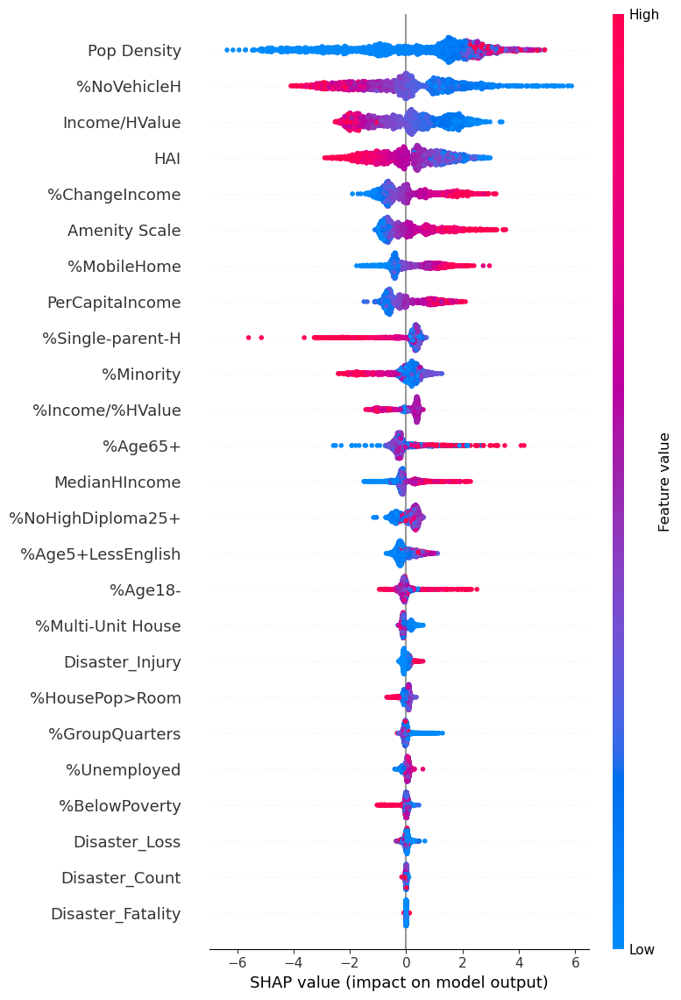

<Figure size 640x480 with 0 Axes>

In [319]:
explainer = shap.Explainer(automl.model.predict, X)
shap_values = explainer(X)

shap_df_tornado = pd.DataFrame(shap_values.values, columns=X.columns)
shap_df_tornado["FIPS"] = fips_series.values

shap.summary_plot(shap_values, X,max_display=30)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Tornado_all_0819.png', dpi=600, bbox_inches='tight')

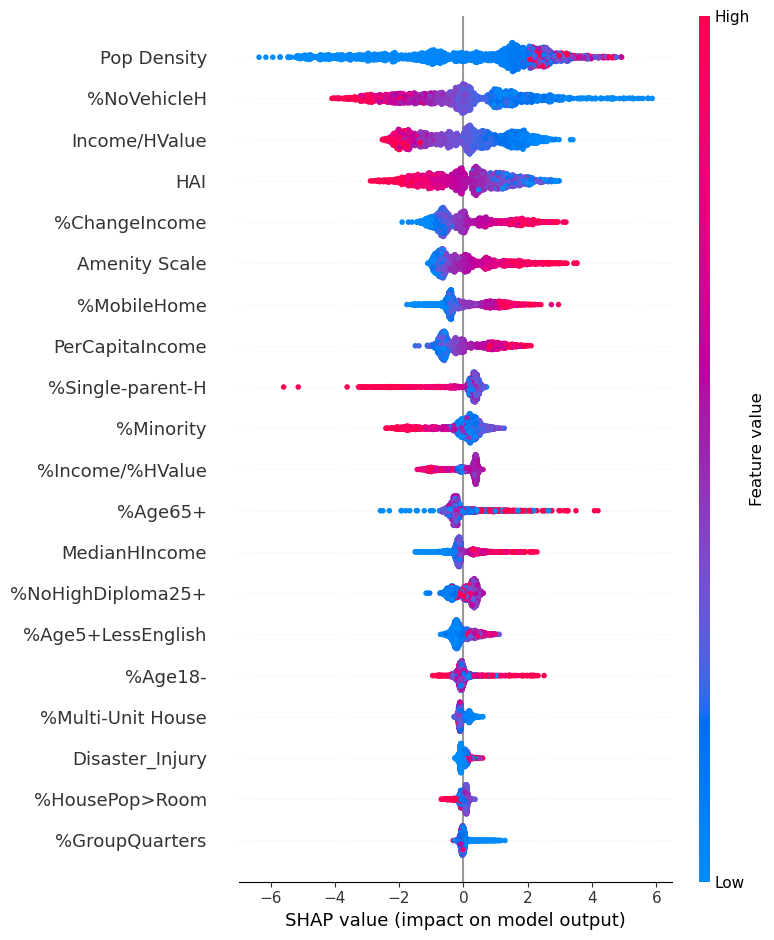

<Figure size 640x480 with 0 Axes>

In [320]:
shap.summary_plot(shap_values, X,max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\automl\Tornado_0819.png', dpi=600, bbox_inches='tight')

Top 10 important features: ['Pop Density', '%NoVehicleH', 'Income/HValue', 'HAI', '%ChangeIncome', 'Amenity Scale', '%MobileHome', 'PerCapitaIncome', '%Single-parent-H', '%Minority']


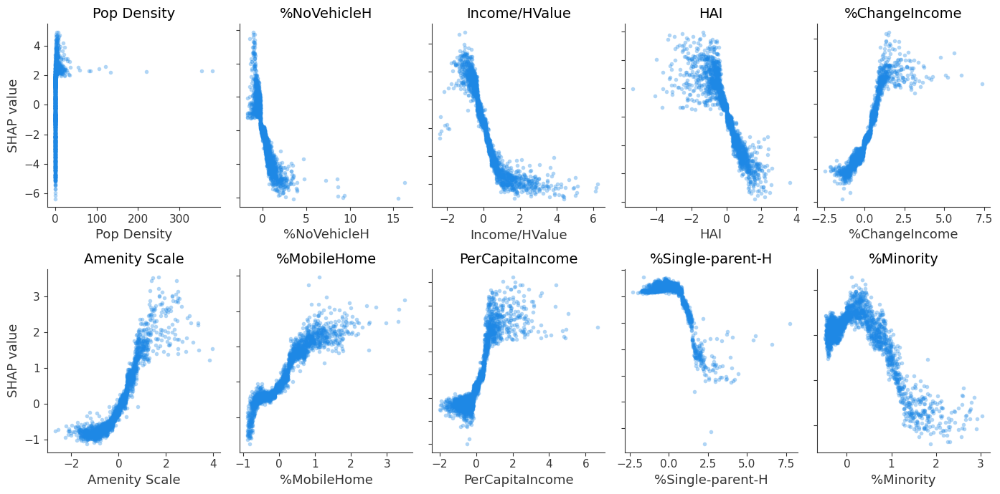

In [321]:
importance = np.abs(shap_values.values).mean(axis=0)
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importance})
top_features = importance_df.sort_values(by='importance', ascending=False).head(10)['feature'].tolist()

print("Top 10 important features:", top_features)

fig, axes = plt.subplots(2, 5, figsize=(14,7))
axes = axes.flatten()

for i, feature in enumerate(top_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
    if i not in [0, 5]:  
        axes[i].set_ylabel("")
        axes[i].set_yticklabels([])
    else:
        axes[i].set_ylabel("SHAP value")
    axes[i].set_title(feature, fontsize=14)
# plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
plt.savefig(r"F:\LongMig2025\results\maps\automl\dependece_tornado_0819.png", dpi=600, bbox_inches='tight')
plt.show()

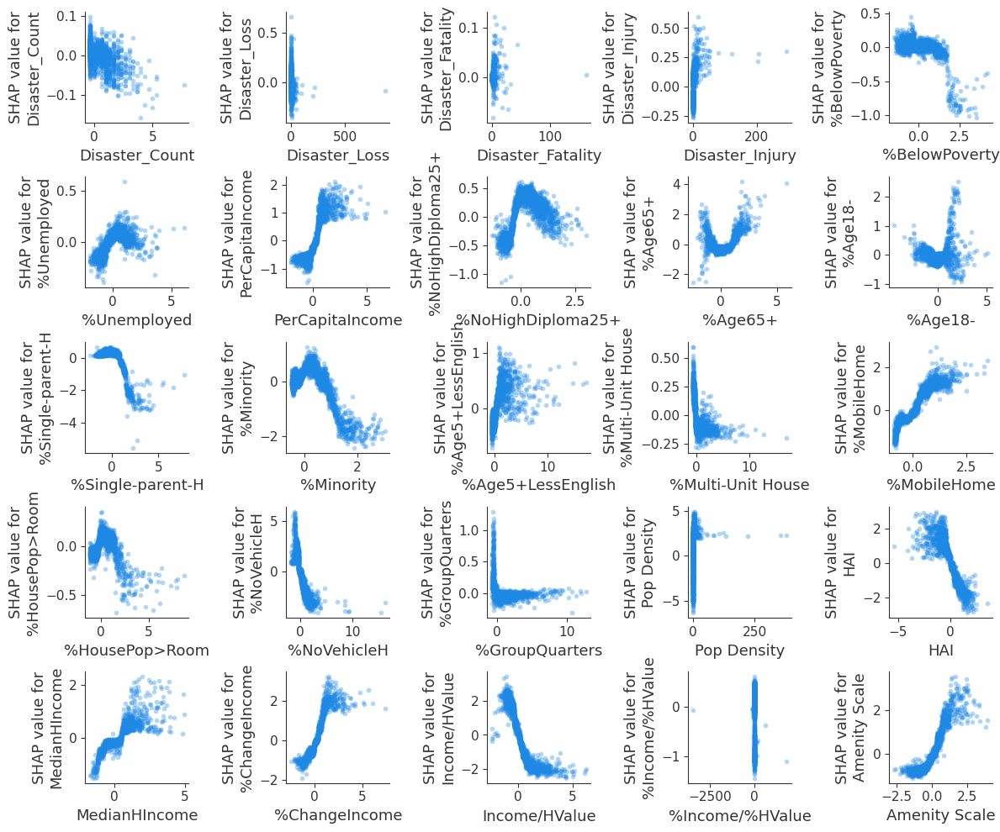

In [322]:
# Get all feature names
all_features = X.columns.tolist()

# Grid layout setup
num_features = len(all_features)
cols = 5
rows = (num_features + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12,10))
axes = axes.flatten()

# Loop through each feature to create a SHAP dependence plot in its subplot
for i, feature in enumerate(all_features):
    shap.dependence_plot(
        feature,
        shap_values.values,
        X,
        ax=axes[i],
        interaction_index=None,  # Ensures no color gradient (blue dots only)
        show=False,
        alpha=0.35
    )
#     axes[i].set_title(f"{feature}", fontsize=10)
# Hide any unused subplot areas
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")

# Final layout and output
plt.tight_layout()
plt.show()

### SHAP Maps

In [323]:
url = "https://www2.census.gov/geo/tiger/TIGER2022/COUNTY/tl_2022_us_county.zip"
gdf_county = gpd.read_file(url)

# 保留常用列
gdf_county = gdf_county[['STATEFP', 'COUNTYFP', 'GEOID', 'NAME', 'geometry']]
gdf_county.head()

,STATEFP,COUNTYFP,GEOID,NAME,geometry
0,31,039,31039,Cuming,"POLYGON ((-96.55516 41.91587, -96.55515 41.914..."
1,53,069,53069,Wahkiakum,"POLYGON ((-123.72755 46.2645, -123.72756 46.26..."
2,35,011,35011,De Baca,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
3,31,109,31109,Lancaster,"POLYGON ((-96.68493 40.5233, -96.69219 40.5231..."
4,31,129,31129,Nuckolls,"POLYGON ((-98.2737 40.1184, -98.27374 40.1224,..."


In [324]:
gdf_county["FIPS"] = gdf_county["GEOID"]
gdf_county["FIPS"]  = gdf_county["FIPS"].astype(str).str.rjust(5,"0")

In [325]:
county_used = gdf_county

In [326]:
shap_gdf_hurricane = pd.merge(shap_df_hurricane,county_used,on="FIPS",how="inner")
shap_gdf_hurricane = gpd.GeoDataFrame(shap_gdf_hurricane,geometry="geometry")
# shap_gdf_hurricane.to_file(r"F:\LongMig2025\results\maps\automl\hurricane_shap.shp")

In [327]:
shap_gdf_flood = pd.merge(shap_df_flood,county_used,on="FIPS",how="inner")
shap_gdf_flood = gpd.GeoDataFrame(shap_gdf_flood,geometry="geometry")
# shap_gdf_flood.to_file(r"F:\LongMig2025\results\maps\automl\flood_shap.shp")

In [ ]:
shap_gdf_wildfire = pd.merge(shap_df_wildfire,county_used,on="FIPS",how="inner")
shap_gdf_wildfire = gpd.GeoDataFrame(shap_gdf_wildfire,geometry="geometry")
# shap_gdf_wildfire.to_file(r"F:\LongMig2025\results\maps\automl\wildfire_shap.shp")

In [ ]:
shap_gdf_tornado = pd.merge(shap_df_tornado,county_used,on="FIPS",how="inner")
shap_gdf_tornado = gpd.GeoDataFrame(shap_gdf_tornado,geometry="geometry")
# shap_gdf_tornado.to_file(r"F:\LongMig2025\results\maps\automl\tornado_shap.shp")

In [328]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import contextily as ctx
from shapely.geometry import Point

def plot_shap_maps_clipped_with_cities(gdf, features, output_prefix="SHAP_map"):
    if output_prefix == "Flood_SHAP":
        cities = {
            "New York": (-74.006, 40.7128),
            "Los Angeles": (-118.2437, 34.0522),
            "Chicago": (-87.6298, 41.8781),
            "Houston": (-95.3698, 29.7604),
            "Atlanta": (-84.3880, 33.7490),
            "Washington": (-77.0369, 38.9072),
            "Dallas": (-96.7970, 32.7767),
            "Denver": (-104.9903, 39.7392),
            "San Francisco": (-122.4194, 37.7749),
            "Seattle": (-122.3321, 47.6062),
            "Boston": (-71.0589, 42.3601),
            "Miami": (-80.1918, 25.7617),
        }
    else:
        cities = {
            "New York": (-74.006, 40.7128),
            "Houston": (-95.3698, 29.7604),
            "Atlanta": (-84.3880, 33.7490),
            "Washington": (-77.0369, 38.9072),
            "Boston": (-71.0589, 42.3601),
            "Miami": (-80.1918, 25.7617),
        }        

    # 转换城市点为GeoDataFrame
    cities_gdf = gpd.GeoDataFrame(
        list(cities.keys()),
        columns=['city'],
        geometry=[Point(xy) for xy in cities.values()],
        crs="EPSG:4326"
    )

    gdf_web = gdf.to_crs(epsg=5070)
    cities_web = cities_gdf.to_crs(epsg=5070)

    for feature in features:
        vals = gdf_web[feature].dropna()

        vmax_q = np.percentile(np.abs(vals), 75)
        vmin = -vmax_q
        vmax = vmax_q

        fig, ax = plt.subplots(1, 1, figsize=(11, 7))
        gdf_web.plot(
            column=feature,
            cmap='coolwarm',
            ax=ax,
            legend=True,
            vmin=vmin,
            vmax=vmax,
            legend_kwds={
                'label': "SHAP Value",
                'shrink': 0.6
            },
            missing_kwds={"color": "lightgrey"}
        )

        # 添加城市标注
        cities_web.plot(ax=ax, color='black', markersize=10, zorder=5)
        for x, y, label in zip(cities_web.geometry.x, cities_web.geometry.y, cities_web['city']):
            ax.text(x, y, label, fontsize=9, color='black')

        # 添加底图
#         ctx.add_basemap(
#             ax=ax,
#             crs=gdf_web.crs.to_string(),
#             source=ctx.providers.CartoDB.Positron,
#             alpha=0.4
#         )

        ax.set_title(f"{feature} - SHAP values", fontsize=15)
        ax.axis('off')

        plt.tight_layout()
        if feature == "Income/HValue":
            feature = "IncomedivHValue"
        plt.savefig(f"F:/LongMig2025/results/maps/automl/{output_prefix}_{feature}.png", dpi=600, bbox_inches='tight')
        plt.show()


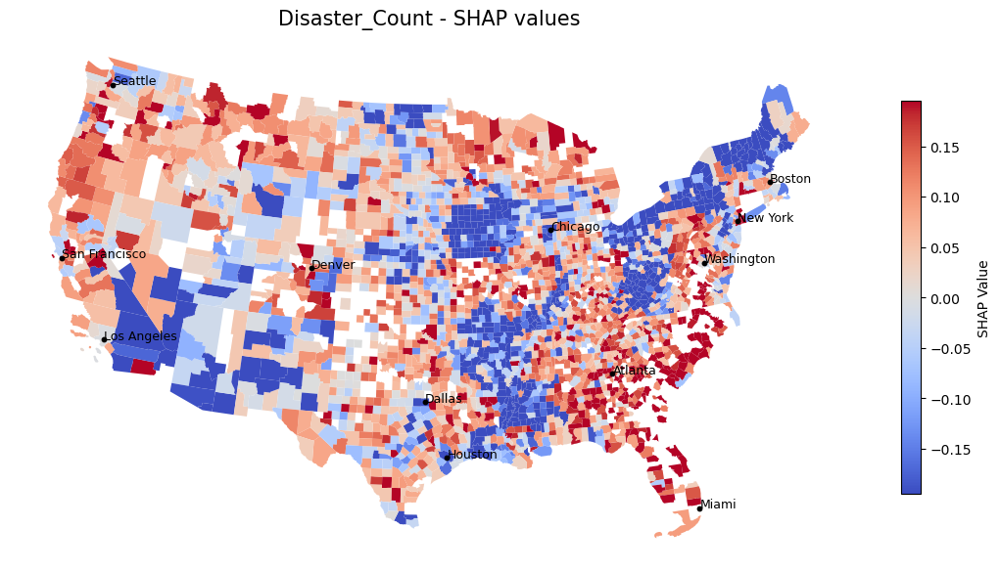

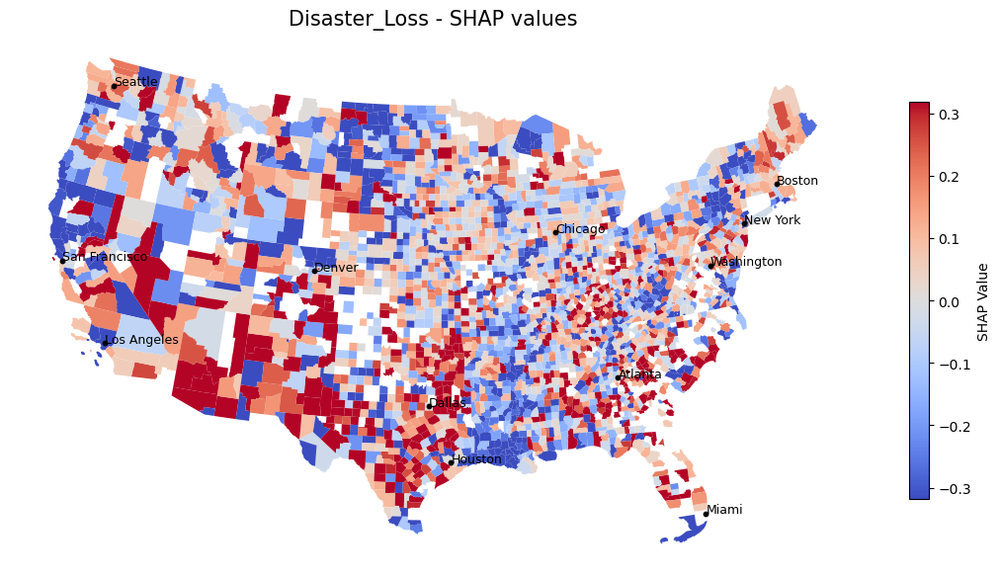

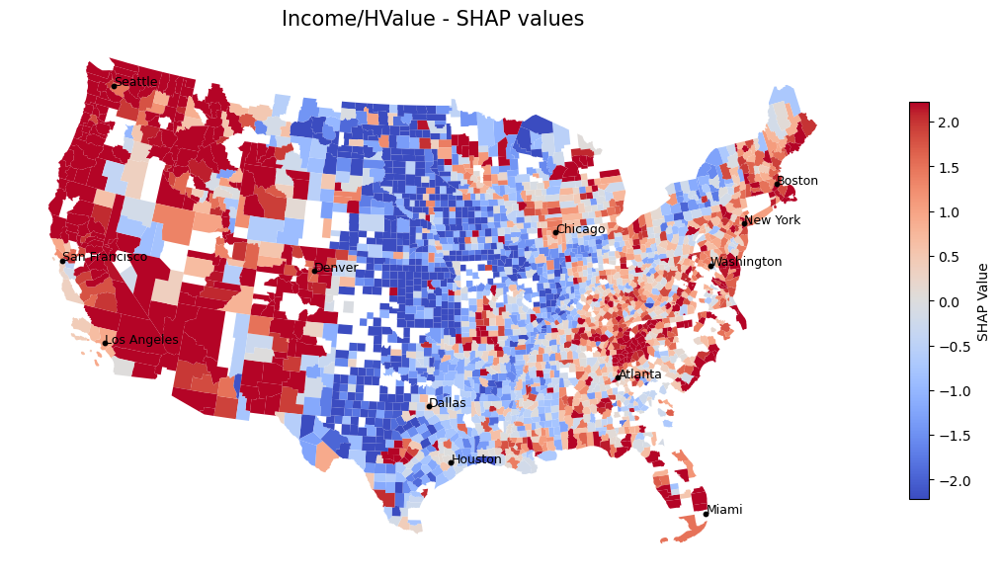

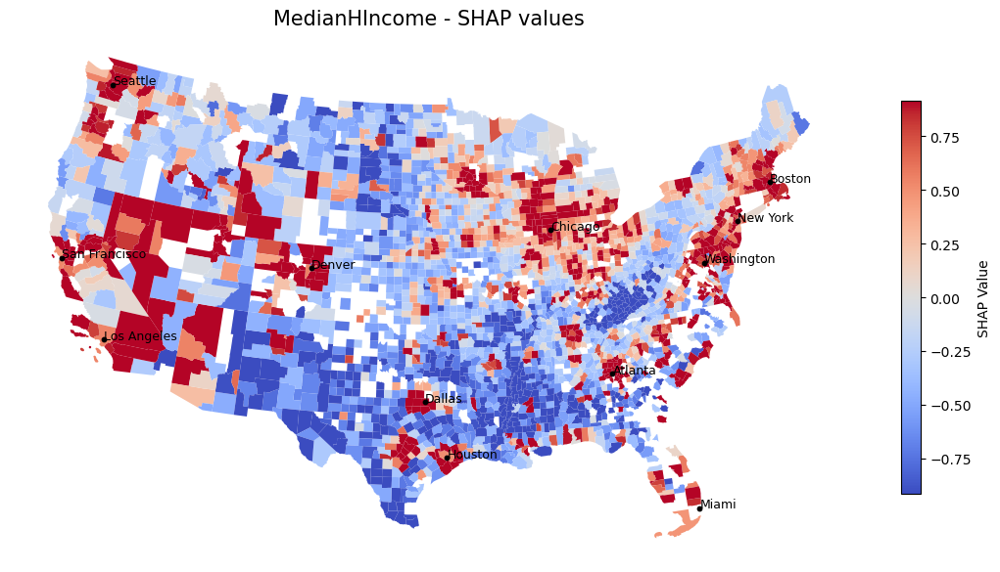

In [329]:
features = ["Disaster_Count", "Disaster_Loss", "Income/HValue", "MedianHIncome"]
plot_shap_maps_clipped_with_cities(shap_gdf_flood, features, output_prefix="Flood_SHAP")

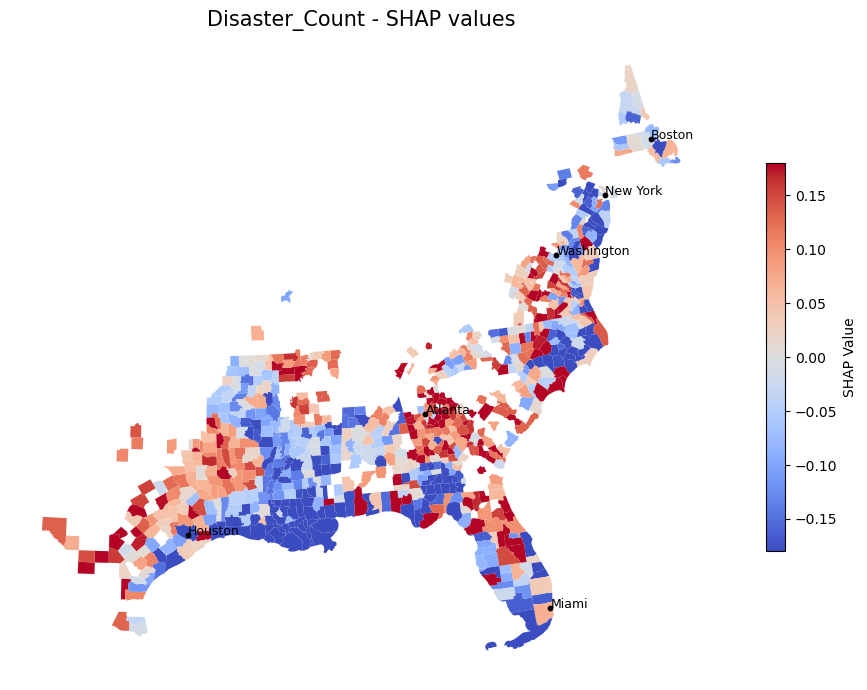

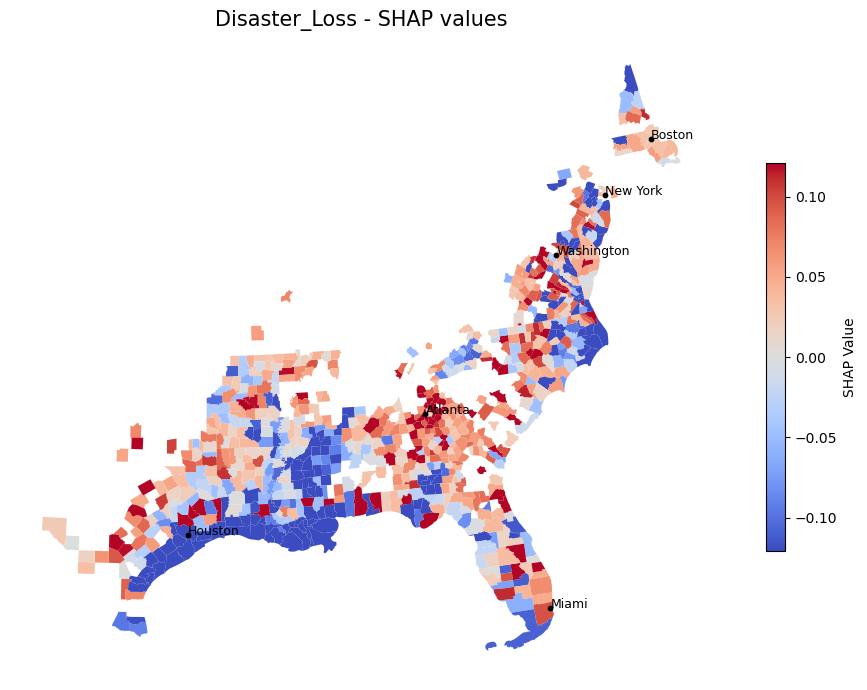

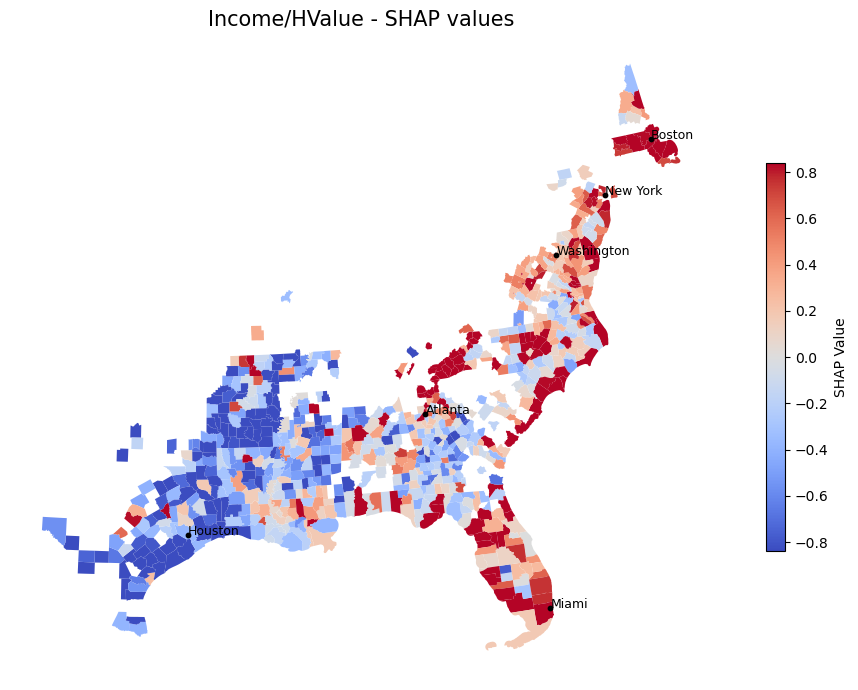

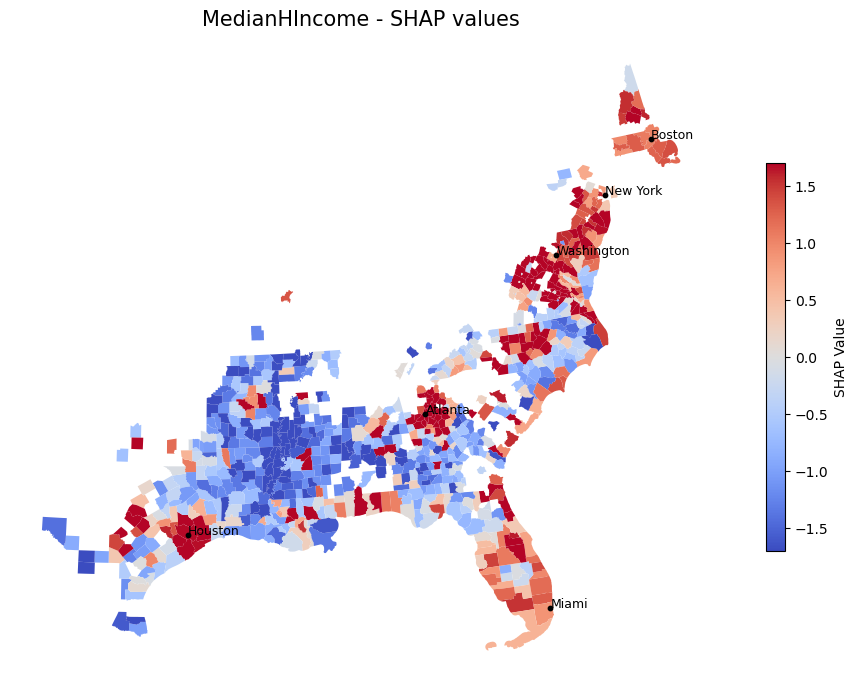

In [330]:
features = ["Disaster_Count", "Disaster_Loss", "Income/HValue", "MedianHIncome"]
plot_shap_maps_clipped_with_cities(shap_gdf_hurricane, features, output_prefix="Hurricane_SHAP")